In [1]:
import numpy as np 
import matplotlib.pyplot as plt
import math
import pandas as pd
import seaborn as sns

In [2]:
import os

In [3]:
import cv2

In [4]:
import matplotlib.colors as mcolors

## Загрузка  таблицы с клиническими результатами анализов (с разметкой)

In [108]:
df = pd.read_excel('urine_data1.xlsx')

In [82]:
df.head()

,id,date,day_id,60_sec,90_sec,color,transparency,sg,ph,pro,...,bil,ubg,nit,uwbc,bld,leu,erhy,gender,age,division
0,401202991936,2024-03-01,1,NaN,NaN,straw_yellow,transparent,1.019,5.5,neg,...,neg,3.4,neg,1.0,Ca10,NaN,NaN,NaN,NaN,NaN
1,400902992051,2024-03-01,2,NaN,NaN,bright_yellow,transparent,1.017,<=5,neg,...,neg,3.4,neg,129.0,Ca25,NaN,NaN,NaN,NaN,NaN
2,401202991933,2024-03-01,3,NaN,NaN,bright_yellow,transparent,1.021,5.5,neg,...,neg,3.4,neg,12.0,Ca25,NaN,NaN,NaN,NaN,NaN
3,406103971050,2024-03-01,4,NaN,NaN,bright_yellow,transparent,1.019,5.5,neg,...,neg,3.4,pos,83.0,neg,NaN,NaN,NaN,NaN,NaN
4,402502991722,2024-03-01,5,NaN,NaN,bright_yellow,transparent,1.024,6,neg,...,neg,17.0,neg,72.0,neg,NaN,NaN,NaN,NaN,NaN


In [2050]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420 entries, 0 to 419
Columns: 156 entries, id to ubg_z
dtypes: datetime64[ns](1), float64(139), int64(2), object(14)
memory usage: 512.0+ KB


In [84]:
df[380:400]

,id,date,day_id,60_sec,90_sec,color,transparency,sg,ph,pro,...,bil,ubg,nit,uwbc,bld,leu,erhy,gender,age,division
380,409603971109,2024-04-05,1,IMG_20240405_123911.jpg,NaN,bright_yellow,partial_transparent,1.014,<=5,neg,...,neg,3.4,neg,326.0,>=Ca200,Ca125,145.0,f,74.0,endocrinology
381,409603971110,2024-04-05,2,IMG_20240405_124040.jpg,NaN,bright_yellow,transparent,1.017,<=5,neg,...,neg,3.4,neg,48.0,>=Ca200,neg,12.0,f,65.0,endocrinology
382,409603971111,2024-04-05,3,IMG_20240405_124155.jpg,NaN,bright_yellow,transparent,1.012,5.5,neg,...,neg,3.4,neg,1.0,neg,neg,2.0,m,38.0,endocrinology
383,409603971044,2024-04-05,4,IMG_20240405_124311.jpg,NaN,bright_yellow,transparent,1.018,<=5,neg,...,neg,3.4,neg,236.0,neg,>=Ca500,21.0,f,79.0,endocrinology
384,407102992580,2024-04-05,5,IMG_20240405_124427.jpg,NaN,yellow,transparent,1.022,5.5,neg,...,neg,17.0,neg,90.0,Ca10,Ca15,2.0,f,75.0,anticancer therapy
385,407102992582,2024-04-05,6,IMG_20240405_124539.jpg,NaN,bright_yellow,transparent,1.016,7,neg,...,neg,3.4,neg,54.0,>=Ca200,neg,158.0,m,64.0,anticancer therapy
386,407903962616,2024-04-05,7,IMG_20240405_124655.jpg,NaN,bright_yellow,cloudy,1.021,<=5,neg,...,neg,3.4,neg,2.0,neg,neg,1.0,f,62.0,lor 2
387,408603961766,2024-04-05,8,IMG_20240405_124810.jpg,NaN,bright_yellow,transparent,1.031,<=5,neg,...,neg,3.4,neg,2.0,Ca80,neg,24.0,m,75.0,urgent cardiology
388,401902992563,2024-04-05,9,IMG_20240405_124925.jpg,NaN,bright_yellow,transparent,1.012,6,neg,...,neg,3.4,neg,11.0,Ca10,neg,3.0,f,42.0,urgent cardiology
389,403702993146,2024-04-05,10,IMG_20240405_125040.jpg,NaN,bright_yellow,transparent,1.011,<=5,neg,...,neg,3.4,neg,0.0,neg,neg,0.0,m,70.0,neurology onmk


#### Добавляем имена файлов в датафрейм
Для каждой даты получаем список файлов из директории, затем вносим имена файлов в столбец '60_sec'

In [17]:
num = 400

In [18]:
# укажем путь к файлам и получим список файлов:
path = "imgs/patients/08042024/60_corrected_strips/"
files = os.listdir(path)
len(files)

20

In [19]:
for i in range(20):
    df.at[num+i, '60_sec'] = files[i]

In [135]:
# сохраняем датафрейм с добавленными именами файлов
df.to_excel("urine_data2.xlsx", index = False, freeze_panes = (1,0))

## Исследовательский анализ данных

In [85]:
# значения цвета мочи
df.color.unique()

array(['straw_yellow', 'bright_yellow', 'colorless', 'yellow',
       'dark_yellow', 'bright_red', 'red', 'other', 'orange'],
      dtype=object)

In [ ]:
# значения прозрачности
df.transparency.unique()

#### Относительная плотность

Text(0.5, 0, 'значение относительной плотности')

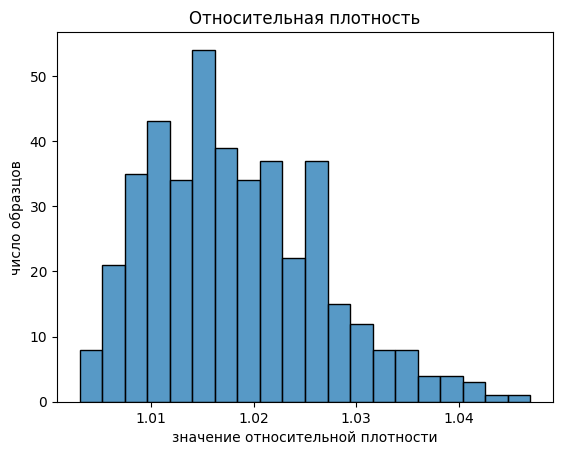

In [2224]:
ax = sns.histplot(data=df, x="sg", bins = 20)
ax.set_title('Относительная плотность')
ax.set_ylabel('число образцов')
ax.set_xlabel('значение относительной плотности')

#### pH

In [203]:
df.ph.unique()

array(['5.5', '<=5', '6', '6.5', '7', '8', '7.5'], dtype=object)

Text(0.5, 0, 'значение pH')

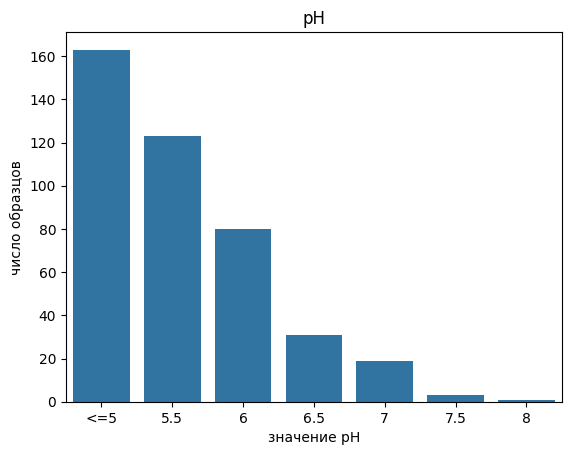

In [2223]:
ax = sns.countplot(data=df, x="ph", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'])
ax.set_title('pH')
ax.set_ylabel('число образцов')
ax.set_xlabel('значение pH')

#### Белок

In [92]:
df.pro.unique()

array(['neg', '1', 'trace', '0.3', '>=3'], dtype=object)

Text(0.5, 0, 'диапазон по тест-полоскам, г/л')

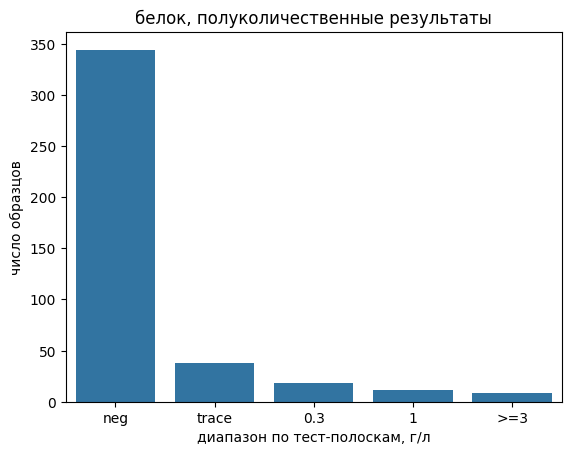

In [2231]:
ax = sns.countplot(data=df, x="pro", order=['neg', 'trace', '0.3', '1', '>=3'])
ax.set_title('белок, полуколичественные результаты')
ax.set_ylabel('число образцов')
ax.set_xlabel('диапазон по тест-полоскам, г/л')

Text(0.5, 0, 'концентрация, г/л')

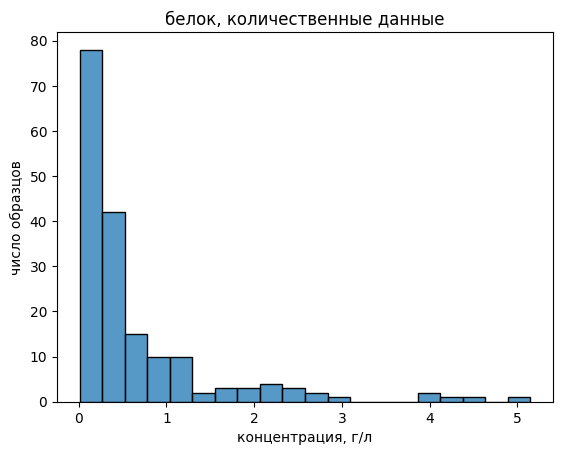

In [204]:
ax = sns.histplot(data=df, x="pro_m", bins = 20)
ax.set_title('белок, количественные данные')
ax.set_ylabel('число образцов')
ax.set_xlabel('концентрация, г/л')

Text(0, 0.5, 'диапазон по тест-полоскам, ммоль/л')

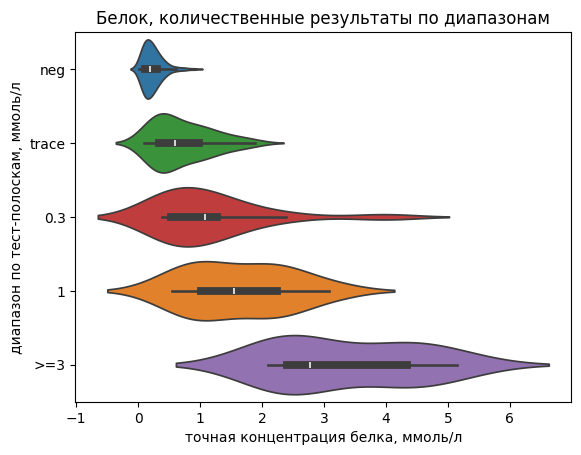

In [2239]:
ax = sns.violinplot(data=df, x="pro_m", y='pro', hue = 'pro', order=['neg', 'trace', '0.3', '1', '>=3'])
ax.set_title('Белок, количественные результаты по диапазонам')
ax.set_xlabel('точная концентрация белка, ммоль/л')
ax.set_ylabel('диапазон по тест-полоскам, ммоль/л')

Text(0, 0.5, 'диапазон по тест-полоскам, ммоль/л')

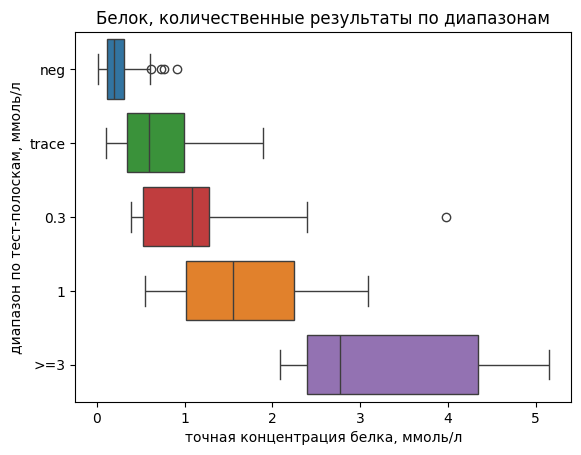

In [2243]:
ax = sns.boxplot(data=df, x="pro_m", y='pro', hue = 'pro', order=['neg', 'trace', '0.3', '1', '>=3'])
ax.set_title('Белок, количественные результаты по диапазонам')
ax.set_xlabel('точная концентрация белка, ммоль/л')
ax.set_ylabel('диапазон по тест-полоскам, ммоль/л')

#### Глокоза

In [101]:
df.glu.unique()

array(['neg', '5.6', '14', '28', '>=56'], dtype=object)

Text(0.5, 0, 'диапазон по тест-полоскам, ммоль/л')

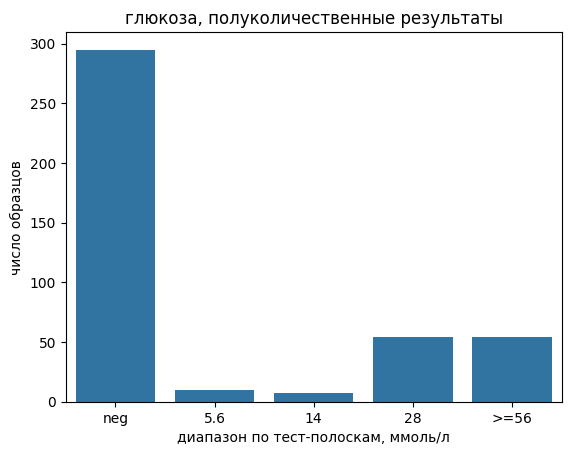

In [2214]:
ax = sns.countplot(data=df, x="glu", order=['neg', '5.6', '14', '28', '>=56'])
ax.set_title('глюкоза, полуколичественные результаты')
ax.set_ylabel('число образцов')
ax.set_xlabel('диапазон по тест-полоскам, ммоль/л')

Text(0.5, 0, 'концентрация глюкозы, ммоль/л')

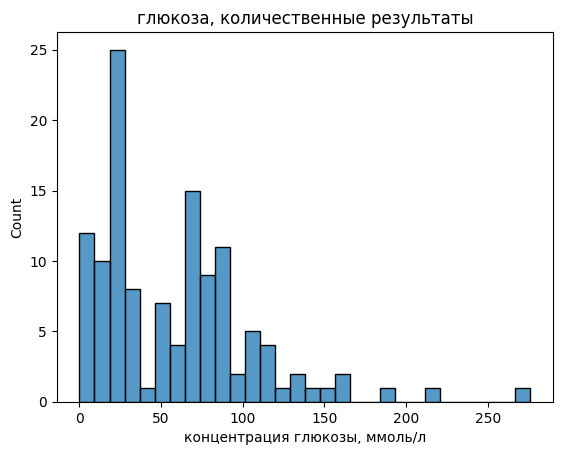

In [107]:
ax = sns.histplot(data=df, x="glu_m", bins = 30)
ax.set_title('глюкоза, количественные результаты')
ax.set_xlabel('концентрация глюкозы, ммоль/л')

Text(0, 0.5, 'диапазон по тест-полоскам, ммоль/л')

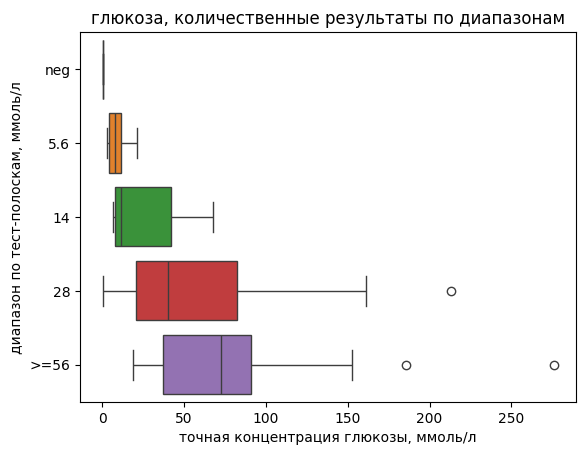

In [2225]:
ax = sns.boxplot(data=df, x="glu_m", y='glu', hue = 'glu')
ax.set_title('глюкоза, количественные результаты по диапазонам')
ax.set_xlabel('точная концентрация глюкозы, ммоль/л')
ax.set_ylabel('диапазон по тест-полоскам, ммоль/л')

Text(0, 0.5, 'диапазон по тест-полоскам, ммоль/л')

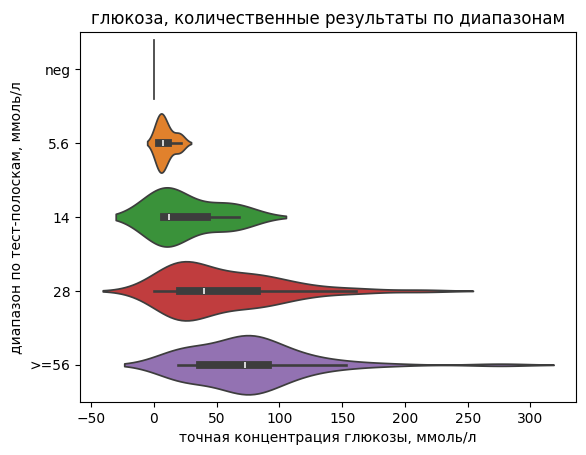

In [2226]:
ax = sns.violinplot(data=df, x="glu_m", y='glu', hue = 'glu')
ax.set_title('глюкоза, количественные результаты по диапазонам')
ax.set_xlabel('точная концентрация глюкозы, ммоль/л')
ax.set_ylabel('диапазон по тест-полоскам, ммоль/л')

In [2242]:
# максимальное и минимальное значения реальной концентрации глюкозы для образцов диапазона 28 ммоль
df.loc[df['glu'] == '28']['glu_m'].max(), df.loc[df['glu'] == '28']['glu_m'].min()

(213.05, 0.24)

#### Кетоны

In [2236]:
df.ket.unique()

array(['neg', '1.5', '>=7.8', '0.5', nan, '3.9'], dtype=object)

Text(0.5, 0, 'диапазон по тест-полоскам, ммоль/л')

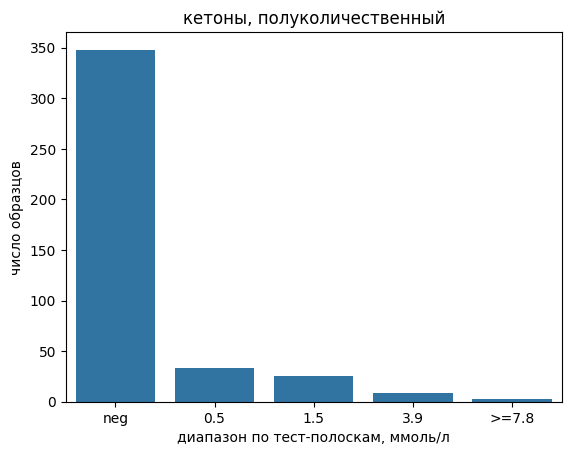

In [2215]:
ax = sns.countplot(data=df, x="ket", order=['neg', '0.5', '1.5', '3.9', '>=7.8'])
ax.set_title('кетоны, полуколичественный')
ax.set_ylabel('число образцов')
ax.set_xlabel('диапазон по тест-полоскам, ммоль/л')

#### Билирубин

In [114]:
df.bil.unique()

array(['neg', '17', nan, '51'], dtype=object)

In [2237]:
df.bil.value_counts()

bil
neg    405
17      11
51       1
Name: count, dtype: int64

Text(0.5, 0, 'диапазон по тест-полоскам, мкмоль/л')

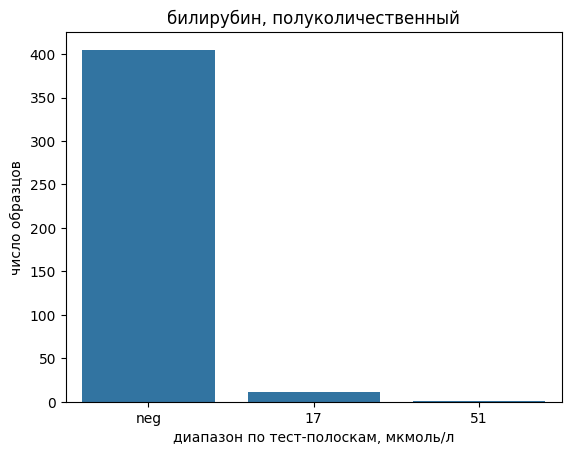

In [205]:
ax = sns.countplot(data=df, x="bil", order=['neg', '17', '51'])
ax.set_title('билирубин, полуколичественный')
ax.set_ylabel('число образцов')
ax.set_xlabel('диапазон по тест-полоскам, мкмоль/л')

#### Уробилиноген

In [2238]:
df.ubg.unique()

array([ 3.4, 17. ,  nan, 34. ])

Text(0.5, 0, 'диапазон по тест-полоскам, мкмоль/л')

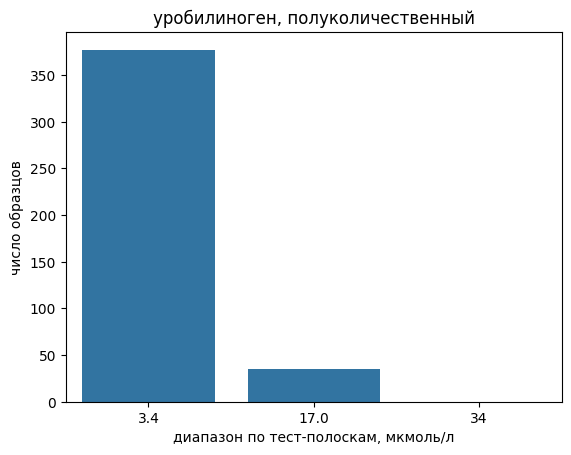

In [2217]:
ax = sns.countplot(data=df, x="ubg", order=['3.4', '17.0', '34'])
ax.set_title('уробилиноген, полуколичественный')
ax.set_ylabel('число образцов')
ax.set_xlabel('диапазон по тест-полоскам, мкмоль/л')

In [2125]:
df.ubg.value_counts()

ubg
3.4     377
17.0     35
34.0      5
Name: count, dtype: int64

#### Нитриты

In [117]:
df.nit.unique()

array(['neg', 'pos', nan], dtype=object)

Text(0.5, 0, 'диапазон по тест-полоскам')

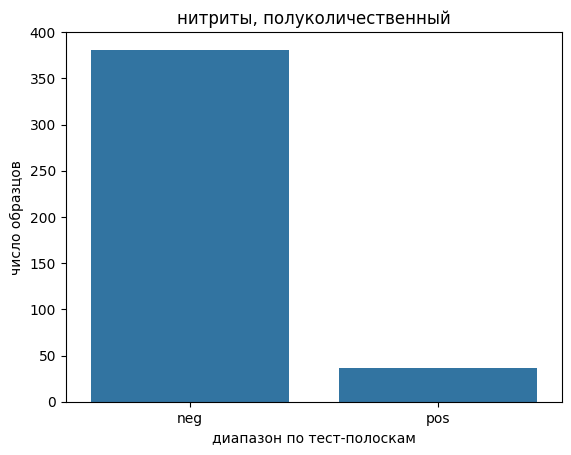

In [206]:
ax = sns.countplot(data=df, x="nit", order=['neg', 'pos'])
ax.set_title('нитриты, полуколичественный')
ax.set_ylabel('число образцов')
ax.set_xlabel('диапазон по тест-полоскам')

#### Лейкоциты

Text(0.5, 0, 'количество клеток в мкл')

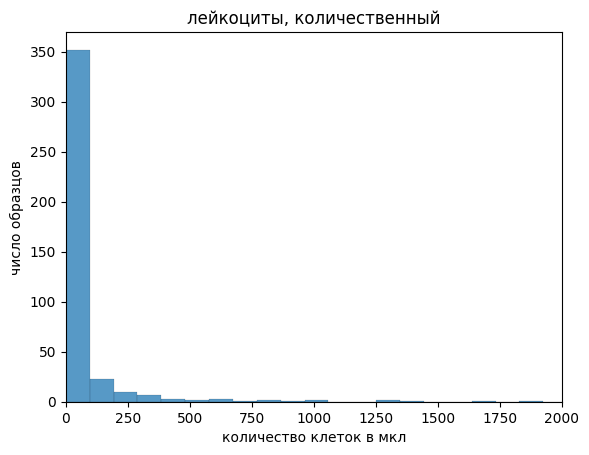

In [215]:
ax = sns.histplot(data=df, x="uwbc", bins = 400)
ax.set_xlim(0, 2000)
ax.set_title('лейкоциты, количественный анализ')
ax.set_ylabel('число образцов')
ax.set_xlabel('количество клеток в мкл')

In [216]:
df.leu.unique()

array([nan, 'Ca70', 'neg', 'Ca125', '>=Ca500', 'Ca15'], dtype=object)

In [2130]:
df.leu.value_counts()

leu
neg        248
>=Ca500     39
Ca15        36
Ca70        20
Ca125       14
Name: count, dtype: int64

Text(0.5, 0, 'диапазон по тест-полоскам, клеток/мкл')

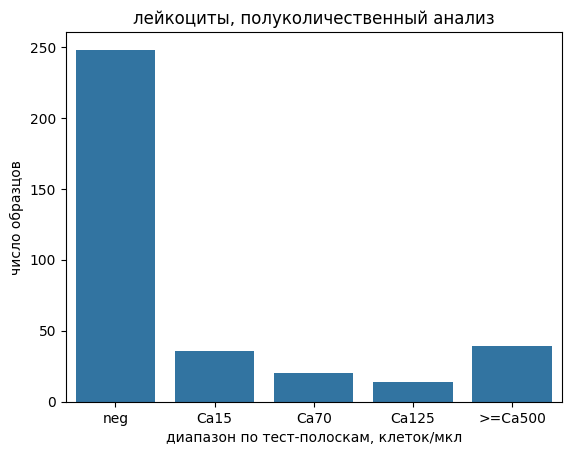

In [217]:
ax = sns.countplot(data=df, x="leu", order=['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500'])
ax.set_title('лейкоциты, полуколичественный анализ')
ax.set_ylabel('число образцов')
ax.set_xlabel('диапазон по тест-полоскам, клеток/мкл')

#### Кровь (эритроциты)

Text(0.5, 0, 'количество клеток в мкл')

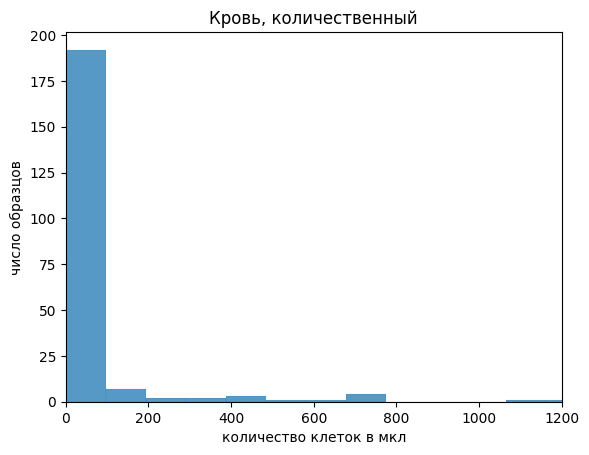

In [221]:
ax = sns.histplot(data=df, x="erhy", bins = 1000)
ax.set_title('Кровь, количественный')
ax.set_xlim(0, 1200)
ax.set_ylabel('число образцов')
ax.set_xlabel('количество клеток в мкл')

In [121]:
df.bld.unique()

array(['Ca10', 'Ca25', 'neg', '>=Ca200', 'Ca80', nan], dtype=object)

Text(0.5, 0, 'диапазон по тест-полоскам, клеток в мкл')

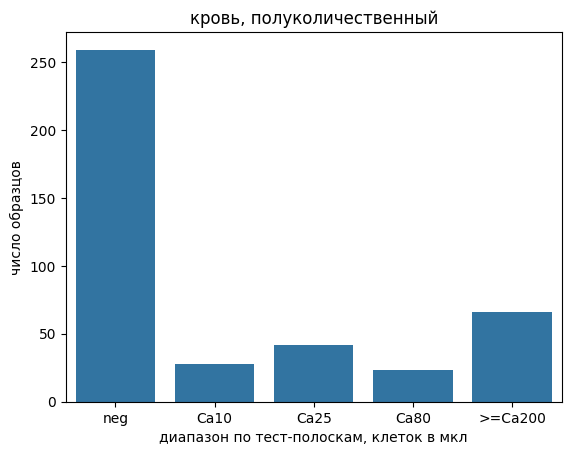

In [2222]:
ax = sns.countplot(data=df, x="bld", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'])
ax.set_title('кровь, полуколичественный')
ax.set_ylabel('число образцов')
ax.set_xlabel('диапазон по тест-полоскам, клеток в мкл')

## Извлечение цветовых признаков

### Глюкоза

In [127]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/glucose/"
files = os.listdir(path)

In [128]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [130]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['gl_red', 'gl_green', 'gl_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['gl_h', 'gl_s', 'gl_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['gl_l', 'gl_a', 'gl_b']] = lab_values
    df.loc[df['60_sec']  == file, ['gl_x', 'gl_y', 'gl_z']] = xyz_values

### Белок

In [132]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/protein/"
files = os.listdir(path)

In [133]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [134]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['pro_red', 'pro_green', 'pro_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['pro_h', 'pro_s', 'pro_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['pro_l', 'pro_a', 'pro_b']] = lab_values
    df.loc[df['60_sec']  == file, ['pro_x', 'pro_y', 'pro_z']] = xyz_values

### Билирубин

In [136]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/bilirubin/"
files = os.listdir(path)

In [137]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [138]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['bil_red', 'bil_green', 'bil_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['bil_h', 'bil_s', 'bil_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['bil_l', 'bil_a', 'bil_b']] = lab_values
    df.loc[df['60_sec']  == file, ['bil_x', 'bil_y', 'bil_z']] = xyz_values

### Бланк (контрольная зона)

In [140]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/blank/"
files = os.listdir(path)

In [141]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [142]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['blank_red', 'blank_green', 'blank_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['blank_h', 'blank_s', 'blank_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['blank_l', 'blank_a', 'blank_b']] = lab_values
    df.loc[df['60_sec']  == file, ['blank_x', 'blank_y', 'blank_z']] = xyz_values

### Кровь

In [144]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/blood/"
files = os.listdir(path)

In [145]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [146]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['blood_red', 'blood_green', 'blood_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['blood_h', 'blood_s', 'blood_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['blood_l', 'blood_a', 'blood_b']] = lab_values
    df.loc[df['60_sec']  == file, ['blood_x', 'blood_y', 'blood_z']] = xyz_values


### Плотность

In [148]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/gravity/"
files = os.listdir(path)

In [149]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [150]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['gravity_red', 'gravity_green', 'gravity_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['gravity_h', 'gravity_s', 'gravity_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['gravity_l', 'gravity_a', 'gravity_b']] = lab_values
    df.loc[df['60_sec']  == file, ['gravity_x', 'gravity_y', 'gravity_z']] = xyz_values

### Кетоны

In [152]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/ketones/"
files = os.listdir(path)

In [153]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [154]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['ket_red', 'ket_green', 'ket_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['ket_h', 'ket_s', 'ket_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['ket_l', 'ket_a', 'ket_b']] = lab_values
    df.loc[df['60_sec']  == file, ['ket_x', 'ket_y', 'ket_z']] = xyz_values

### Лейкоциты

In [156]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/leucocytes/"
files = os.listdir(path)

In [157]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [158]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['leu_red', 'leu_green', 'leu_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['leu_h', 'leu_s', 'leu_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['leu_l', 'leu_a', 'leu_b']] = lab_values
    df.loc[df['60_sec']  == file, ['leu_x', 'leu_y', 'leu_z']] = xyz_values

### Нитриты

In [160]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/nitrites/"
files = os.listdir(path)

In [161]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [162]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['nit_red', 'nit_green', 'nit_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['nit_h', 'nit_s', 'nit_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['nit_l', 'nit_a', 'nit_b']] = lab_values
    df.loc[df['60_sec']  == file, ['nit_x', 'nit_y', 'nit_z']] = xyz_values

### pH

In [164]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/pH/"
files = os.listdir(path)

In [165]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [166]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['ph_red', 'ph_green', 'ph_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['ph_h', 'ph_s', 'ph_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['ph_l', 'ph_a', 'ph_b']] = lab_values
    df.loc[df['60_sec']  == file, ['ph_x', 'ph_y', 'ph_z']] = xyz_values

### Уробилиноген

In [168]:
# укажем путь к файлам и получим список файлов:
path = "imgs/analytes/urobilinogen/"
files = os.listdir(path)

In [169]:
len(files), files[1]

(360, 'IMG_20240311_125423.jpg')

In [170]:
# извлекаем цветовые характеристики и записываем в датафрейм
for file in files:
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-20:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    df.loc[df['60_sec']  == file, ['ubg_red', 'ubg_green', 'ubg_blue']] = rgb_values
    df.loc[df['60_sec']  == file, ['ubg_h', 'ubg_s', 'ubg_v']] = hsv_values
    df.loc[df['60_sec']  == file, ['ubg_l', 'ubg_a', 'ubg_b']] = lab_values
    df.loc[df['60_sec']  == file, ['ubg_x', 'ubg_y', 'ubg_z']] = xyz_values

### Сохранение файла с цветовыми координатами индикаторных зон

In [172]:
df.to_csv('urine_data.csv', index=False)  

In [2680]:
df.to_csv('urine_data_02052024.csv', index=False)  

In [321]:
dd = pd.read_csv('urine_data.csv')

In [18]:
df = pd.read_csv('urine_data_02052024.csv')

In [20]:
df.head()

,id,date,day_id,60_sec,90_sec,color,transparency,sg,ph,pro,...,ubg_blue,ubg_h,ubg_s,ubg_v,ubg_l,ubg_a,ubg_b,ubg_x,ubg_y,ubg_z
0,401202991936,2024-03-01,1,NaN,NaN,straw_yellow,transparent,1.019,5.5,neg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,400902992051,2024-03-01,2,NaN,NaN,bright_yellow,transparent,1.017,<=5,neg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,401202991933,2024-03-01,3,NaN,NaN,bright_yellow,transparent,1.021,5.5,neg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,406103971050,2024-03-01,4,NaN,NaN,bright_yellow,transparent,1.019,5.5,neg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,402502991722,2024-03-01,5,NaN,NaN,bright_yellow,transparent,1.024,6,neg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
df.columns[:50]

Index(['id', 'date', 'day_id', '60_sec', '90_sec', 'color', 'transparency',
       'sg', 'ph', 'pro', 'pro_m', 'glu', 'glu_m', 'ket', 'bil', 'ubg', 'nit',
       'uwbc', 'bld', 'leu', 'erhy', 'gender', 'age', 'division', 'gl_red',
       'gl_green', 'gl_blue', 'gl_h', 'gl_s', 'gl_v', 'gl_l', 'gl_a', 'gl_b',
       'gl_x', 'gl_y', 'gl_z', 'pro_red', 'pro_green', 'pro_blue', 'pro_h',
       'pro_s', 'pro_v', 'pro_l', 'pro_a', 'pro_b', 'pro_x', 'pro_y', 'pro_z',
       'bil_red', 'bil_green'],
      dtype='object')

In [22]:
df.columns[50:100]

Index(['bil_blue', 'bil_h', 'bil_s', 'bil_v', 'bil_l', 'bil_a', 'bil_b',
       'bil_x', 'bil_y', 'bil_z', 'blank_red', 'blank_green', 'blank_blue',
       'blank_h', 'blank_s', 'blank_v', 'blank_l', 'blank_a', 'blank_b',
       'blank_x', 'blank_y', 'blank_z', 'blood_red', 'blood_green',
       'blood_blue', 'blood_h', 'blood_s', 'blood_v', 'blood_l', 'blood_a',
       'blood_b', 'blood_x', 'blood_y', 'blood_z', 'gravity_red',
       'gravity_green', 'gravity_blue', 'gravity_h', 'gravity_s', 'gravity_v',
       'gravity_l', 'gravity_a', 'gravity_b', 'gravity_x', 'gravity_y',
       'gravity_z', 'ket_red', 'ket_green', 'ket_blue', 'ket_h'],
      dtype='object')

In [23]:
df.columns[100:]

Index(['ket_s', 'ket_v', 'ket_l', 'ket_a', 'ket_b', 'ket_x', 'ket_y', 'ket_z',
       'leu_red', 'leu_green', 'leu_blue', 'leu_h', 'leu_s', 'leu_v', 'leu_l',
       'leu_a', 'leu_b', 'leu_x', 'leu_y', 'leu_z', 'nit_red', 'nit_green',
       'nit_blue', 'nit_h', 'nit_s', 'nit_v', 'nit_l', 'nit_a', 'nit_b',
       'nit_x', 'nit_y', 'nit_z', 'ph_red', 'ph_green', 'ph_blue', 'ph_h',
       'ph_s', 'ph_v', 'ph_l', 'ph_a', 'ph_b', 'ph_x', 'ph_y', 'ph_z',
       'ubg_red', 'ubg_green', 'ubg_blue', 'ubg_h', 'ubg_s', 'ubg_v', 'ubg_l',
       'ubg_a', 'ubg_b', 'ubg_x', 'ubg_y', 'ubg_z'],
      dtype='object')

## Анализ распределений цветовых признаков
### Глюкоза

Text(0.5, 0, 'H (HSV)')

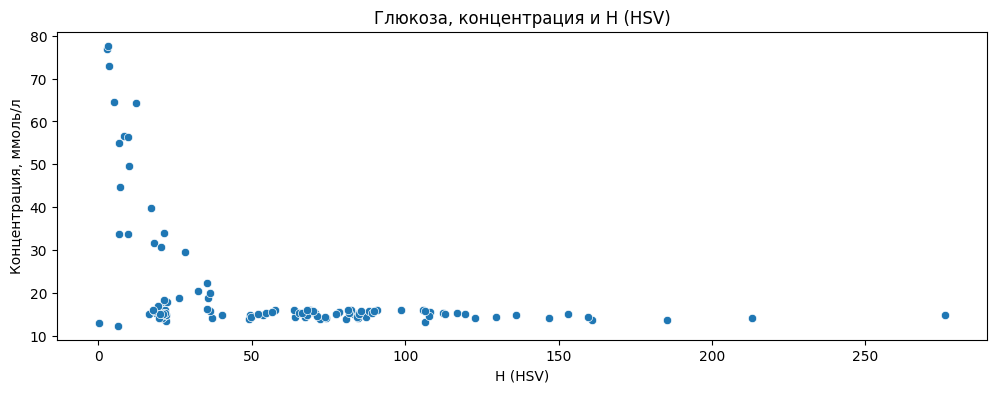

In [24]:
fig = plt.figure(figsize=(12, 4))
ax = sns.scatterplot(data=df,
                x='glu_m', y='gl_h')

ax.set_title('Глюкоза, концентрация и H (HSV)')
ax.set_ylabel('Концентрация, ммоль/л')
ax.set_xlabel('H (HSV)')

In [9]:
# выделение аномальных значений
outs2 = df.loc[(df['glu_m']<25)&(df['gl_h']<20)]
outs2.shape[0]

23

In [10]:
outs2[['date', 'day_id', 'glu', 'glu_m', 'sg', 'ph', 'ket']]

,date,day_id,glu,glu_m,sg,ph,ket
69,2024-03-11,10,28,0.24,1.023,6,neg
75,2024-03-11,16,28,6.24,1.017,5.5,neg
111,2024-03-13,12,28,22.00,1.026,6,0.5
150,2024-03-18,11,>=56,19.96,1.025,<=5,neg
153,2024-03-18,14,>=56,18.91,1.032,<=5,0.5
156,2024-03-18,17,>=56,21.55,1.018,<=5,neg
205,2024-03-21,6,>=56,21.24,1.034,<=5,neg
226,2024-03-22,7,>=56,21.26,1.022,<=5,neg
238,2024-03-22,19,>=56,20.81,1.018,<=5,neg
241,2024-03-25,2,>=56,21.63,1.020,<=5,0.5


In [11]:
ax = sns.scatterplot(data=df_g, x="glu_m", y="gl_h") #, hue="pro")
ax.set_title('глюкоза, RGB Blue при разных концентрациях')
ax.set_xlabel('точная концентрация глюкозы, ммоль/л')
ax.set_ylabel('RGB, ')

NameError: name 'df_g' is not defined

Text(0, 0.5, 'HSV, S')

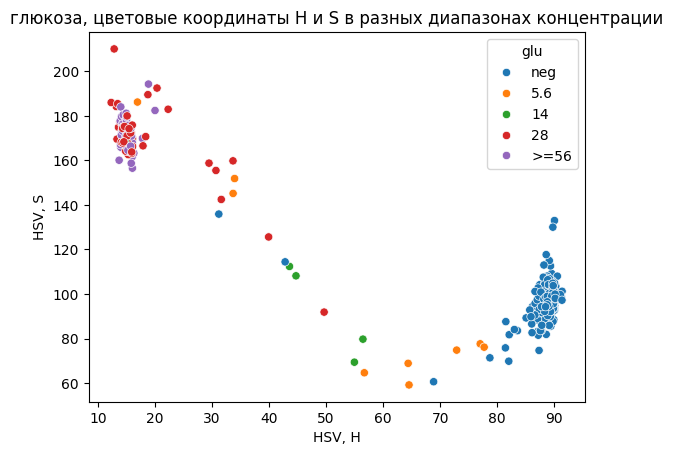

In [12]:
ax = sns.scatterplot(data=df, x="gl_h", y="gl_s", hue="glu")
ax.set_title('глюкоза, цветовые координаты H и S в разных диапазонах концентрации')
ax.set_xlabel('HSV, H')
ax.set_ylabel('HSV, S')

<Axes: xlabel='glu', ylabel='gl_blue'>

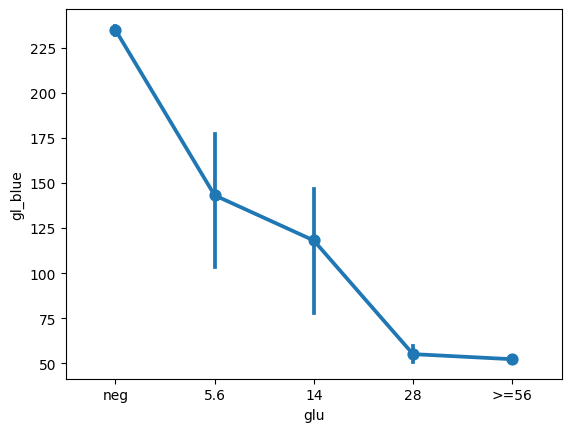

In [13]:
sns.pointplot(data=df, x="glu", y="gl_blue", order=['neg', '5.6', '14', '28', '>=56'])

Text(0, 0.5, 'RGB')

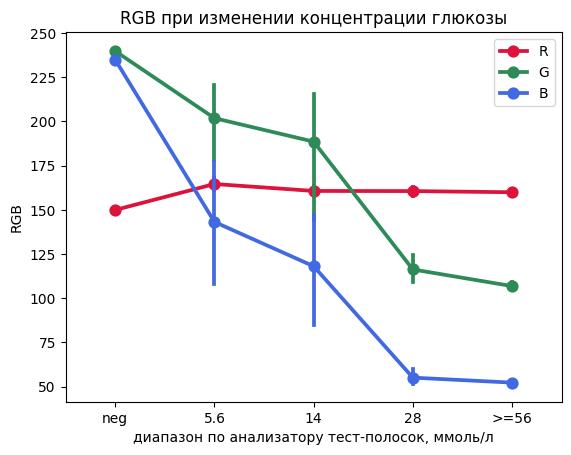

In [14]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="glu", y="gl_red", order=['neg', '5.6', '14', '28', '>=56'], color = 'crimson', label = 'R')
sns.pointplot(data=df, x="glu", y="gl_green", order=['neg', '5.6', '14', '28', '>=56'], color = 'seagreen', label = 'G')
sns.pointplot(data=df, x="glu", y="gl_blue", order=['neg', '5.6', '14', '28', '>=56'], color = 'royalblue', label = 'B')
ax.set_title('RGB при изменении концентрации глюкозы')
ax.set_xlabel('диапазон по анализатору тест-полосок, ммоль/л')
ax.set_ylabel('RGB')

Text(0, 0.5, 'HSV')

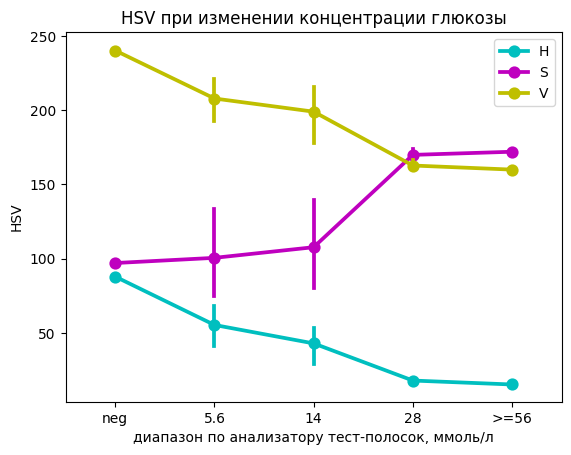

In [202]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="glu", y="gl_h", order=['neg', '5.6', '14', '28', '>=56'], color = 'c', label = 'H')
sns.pointplot(data=df, x="glu", y="gl_s", order=['neg', '5.6', '14', '28', '>=56'], color = 'm', label = 'S')
sns.pointplot(data=df, x="glu", y="gl_v", order=['neg', '5.6', '14', '28', '>=56'], color = 'y', label = 'V')
ax.set_title('HSV при изменении концентрации глюкозы')
ax.set_xlabel('диапазон по анализатору тест-полосок, ммоль/л')
ax.set_ylabel('HSV')

Text(0, 0.5, 'CIE Lab')

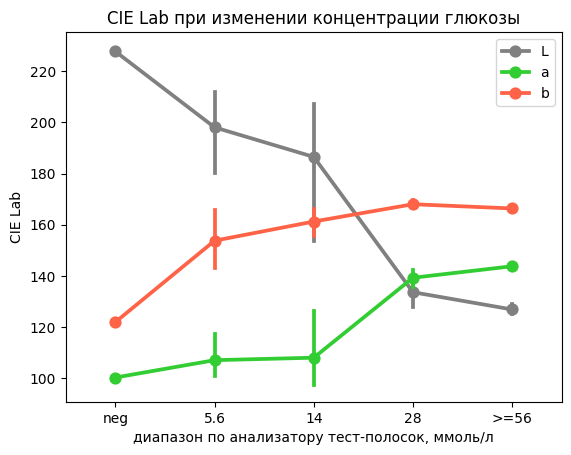

In [203]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="glu", y="gl_l", order=['neg', '5.6', '14', '28', '>=56'], color = 'gray', label = 'L')
sns.pointplot(data=df, x="glu", y="gl_a", order=['neg', '5.6', '14', '28', '>=56'], color = 'limegreen', label = 'a')
sns.pointplot(data=df, x="glu", y="gl_b", order=['neg', '5.6', '14', '28', '>=56'], color = 'tomato', label = 'b')
ax.set_title('CIE Lab при изменении концентрации глюкозы')
ax.set_xlabel('диапазон по анализатору тест-полосок, ммоль/л')
ax.set_ylabel('CIE Lab')

Text(0, 0.5, 'RGB Green')

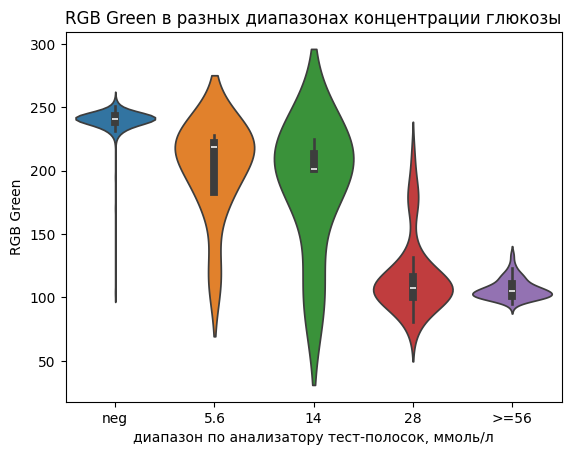

In [2253]:
fig, ax=plt.subplots()
sns.violinplot(data=df, x="glu", y="gl_green", order=['neg', '5.6', '14', '28', '>=56'], hue = 'glu')
ax.set_title('RGB Green в разных диапазонах концентрации глюкозы')
ax.set_xlabel('диапазон по анализатору тест-полосок, ммоль/л')
ax.set_ylabel('RGB Green')

Text(0, 0.5, 'HSV-h')

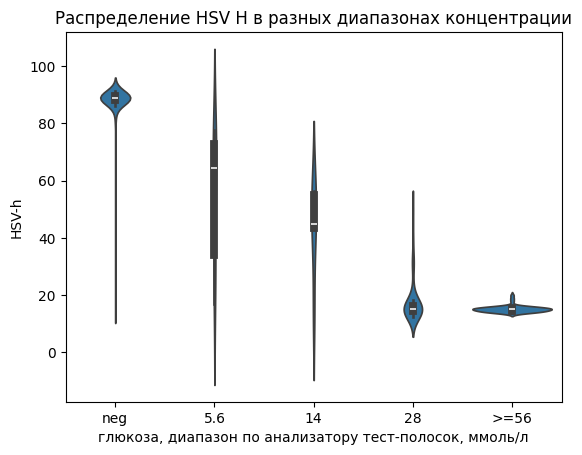

In [228]:
fig, ax=plt.subplots()
sns.violinplot(data=df, x="glu", y="gl_h", order=['neg', '5.6', '14', '28', '>=56'])
ax.set_title('Распределение HSV H в разных диапазонах концентрации')
ax.set_xlabel('глюкоза, диапазон по анализатору тест-полосок, ммоль/л')
ax.set_ylabel('HSV-h')

Text(0, 0.5, 'RGB Green')

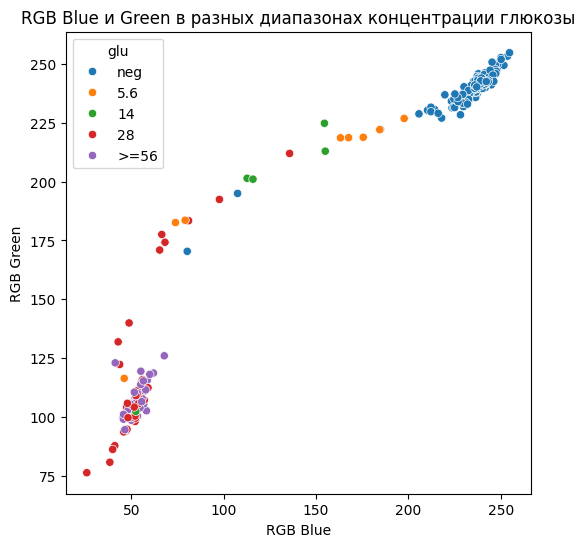

In [517]:
ax = plt.figure(figsize=(6, 6))
ax = sns.scatterplot(data=df,
                x='gl_blue', y='gl_green', hue='glu')
ax.set_title('RGB Blue и Green в разных диапазонах концентрации глюкозы')
ax.set_xlabel('RGB Blue')
ax.set_ylabel('RGB Green')

### Белок

Text(0.5, 1.0, 'RGB при изменении концентрации белка')

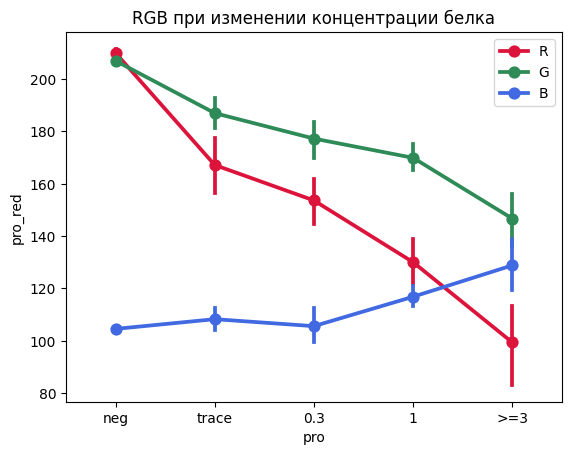

In [446]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="pro", y="pro_red", order=['neg', 'trace', '0.3', '1', '>=3'], color = 'crimson', label = 'R')
sns.pointplot(data=df, x="pro", y="pro_green", order=['neg', 'trace', '0.3', '1', '>=3'], color = 'seagreen', label = 'G')
sns.pointplot(data=df, x="pro", y="pro_blue", order=['neg', 'trace', '0.3', '1', '>=3'], color = 'royalblue', label = 'B')
ax.set_title('RGB при изменении концентрации белка')

Text(0.5, 1.0, 'HSV при изменении концентрации белка')

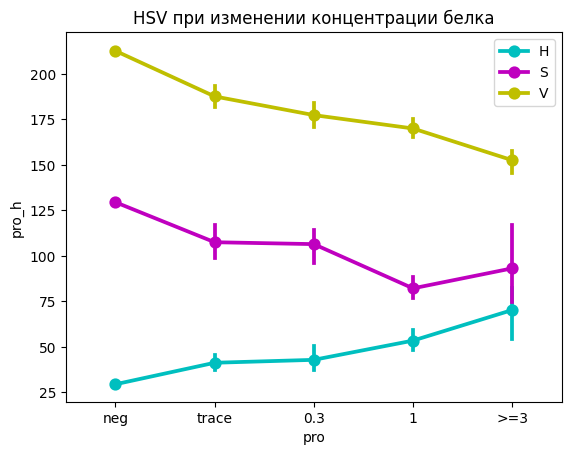

In [448]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="pro", y="pro_h", order=['neg', 'trace', '0.3', '1', '>=3'], color = 'c', label = 'H')
sns.pointplot(data=df, x="pro", y="pro_s", order=['neg', 'trace', '0.3', '1', '>=3'], color = 'm', label = 'S')
sns.pointplot(data=df, x="pro", y="pro_v", order=['neg', 'trace', '0.3', '1', '>=3'], color = 'y', label = 'V')
ax.set_title('HSV при изменении концентрации белка')

Text(0.5, 1.0, 'CIE Lab при разных концентрациях белка')

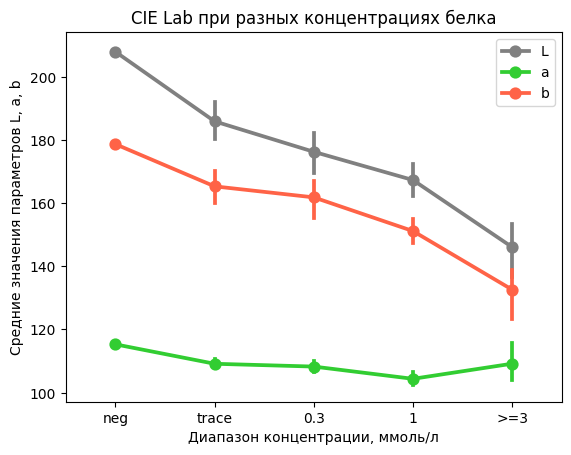

In [454]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="pro", y="pro_l", order=['neg', 'trace', '0.3', '1', '>=3'], color = 'gray', label = 'L')
sns.pointplot(data=df, x="pro", y="pro_a", order=['neg', 'trace', '0.3', '1', '>=3'], color = 'limegreen', label = 'a')
sns.pointplot(data=df, x="pro", y="pro_b", order=['neg', 'trace', '0.3', '1', '>=3'], color = 'tomato', label = 'b')
ax.set_xlabel('Диапазон концентрации, ммоль/л')
ax.set_ylabel('Средние значения параметров L, a, b')
ax.set_title('CIE Lab при разных концентрациях белка')

Text(0.5, 1.0, 'RGB-Red при разной концентрации белка')

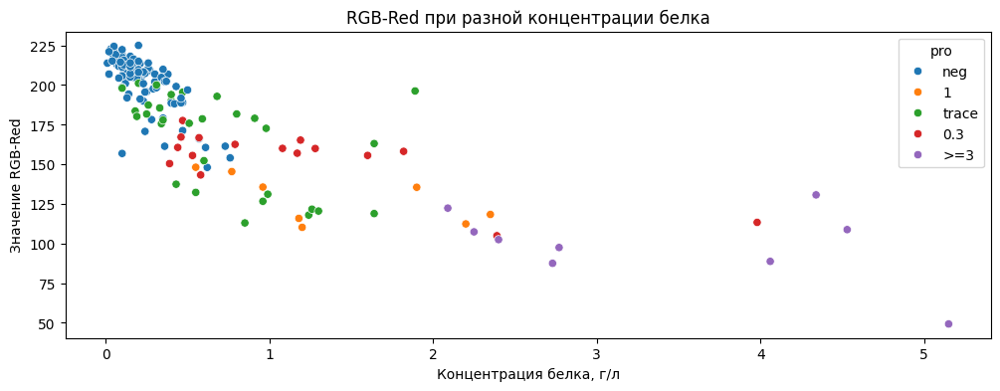

In [2264]:
fig, ax=plt.subplots(figsize=(12, 4))
#plt.figure(figsize=(12, 4))
sns.scatterplot(data=df,
                x='pro_m', y='pro_red', hue = 'pro')
ax.set_xlabel('Концентрация белка, г/л')
ax.set_ylabel('Значение RGB-Red')
ax.set_title('RGB-Red при разной концентрации белка')

Text(0, 0.5, 'RGB Green')

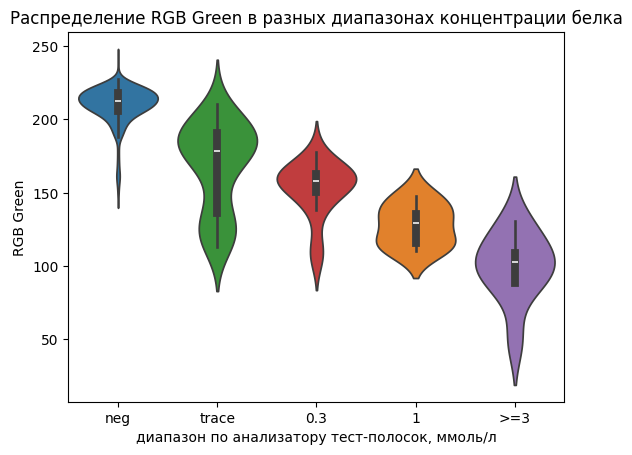

In [2260]:
fig, ax=plt.subplots()
sns.violinplot(data=df, x="pro", y="pro_red", order=['neg', 'trace', '0.3', '1', '>=3'], hue = 'pro')
ax.set_title('Распределение RGB Green в разных диапазонах концентрации белка')
ax.set_xlabel('диапазон по анализатору тест-полосок, ммоль/л')
ax.set_ylabel('RGB Green')

### Лейкоциты

In [237]:
df_leu = df.query('uwbc <=1000')

<Axes: xlabel='uwbc', ylabel='leu_b'>

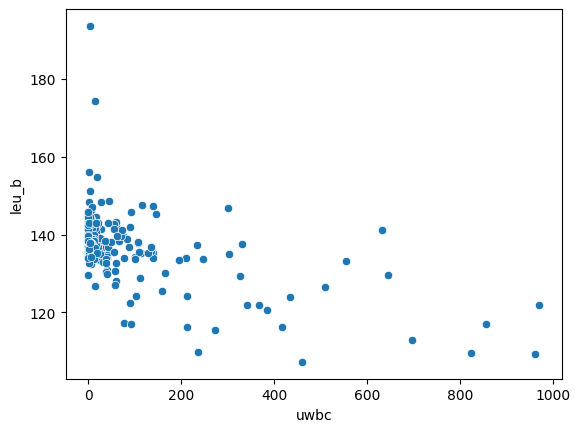

In [238]:
sns.scatterplot(data=df_leu, x="uwbc", y="leu_b") #, hue="pro")

<Axes: xlabel='leu', ylabel='leu_green'>

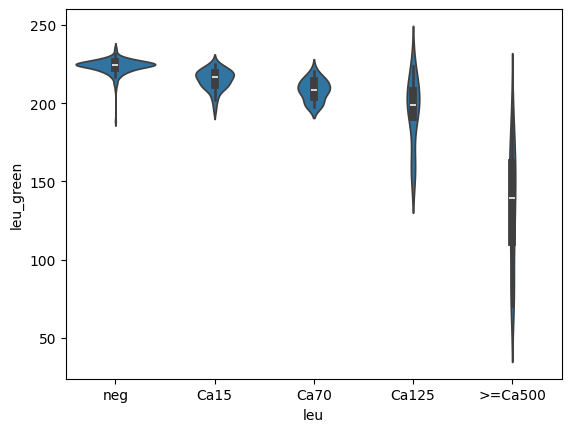

In [239]:
sns.violinplot(data=df, x="leu", y="leu_green", order=['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500'])

In [ ]:
data=df, x="pro", order=['neg', 'trace', '0.3', '1', '>=3']

### Распределения для pH

Text(0.5, 1.0, 'pH')

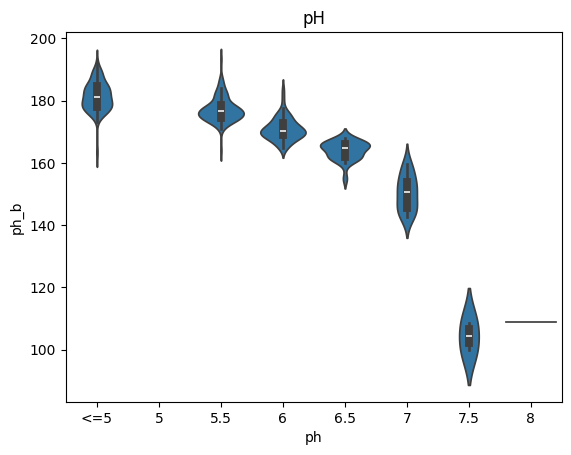

In [440]:
ax = sns.violinplot(data=df, x="ph", y="ph_b", order=['<=5', '5', '5.5', '6', '6.5', '7', '7.5', '8'])
ax.set_title('pH')

<Axes: xlabel='ph_h', ylabel='ph_s'>

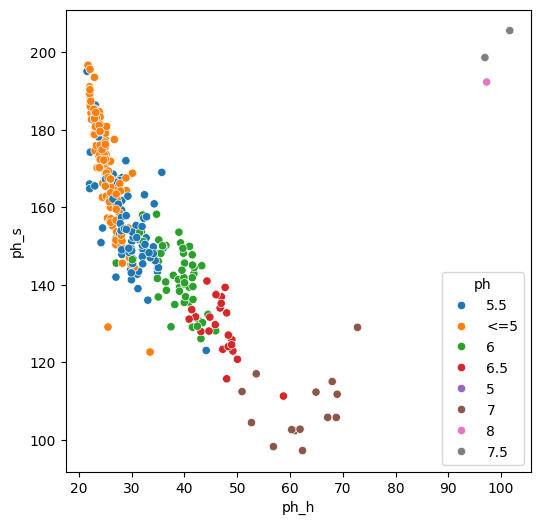

In [445]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df,
                x='ph_h', y='ph_s', hue='ph')

Text(0.5, 1.0, 'pH')

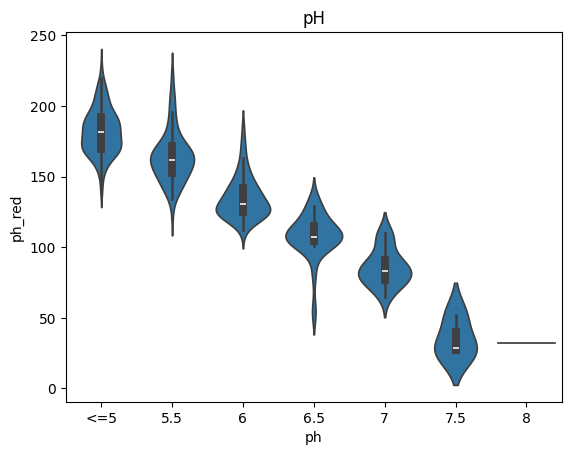

In [864]:
ax = sns.violinplot(data=df, x="ph", y="ph_red", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'])
ax.set_title('pH')

Text(0.5, 1.0, 'RGB при изменении pH')

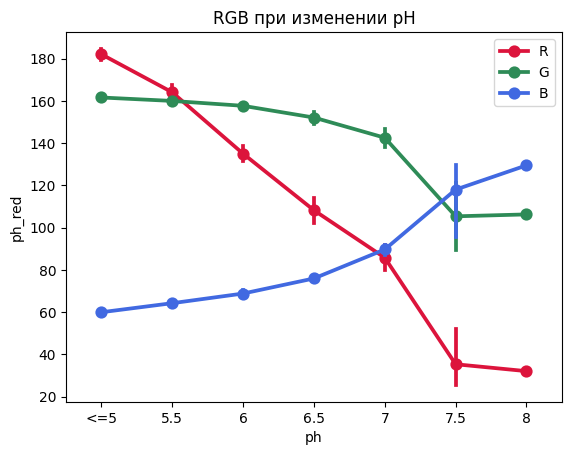

In [863]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="ph", y="ph_red", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'], color = 'crimson', label = 'R')
sns.pointplot(data=df, x="ph", y="ph_green", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'], color = 'seagreen', label = 'G')
sns.pointplot(data=df, x="ph", y="ph_blue", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'], color = 'royalblue', label = 'B')
ax.set_title('RGB при изменении pH')

Text(0.5, 1.0, 'HSV при изменении pH')

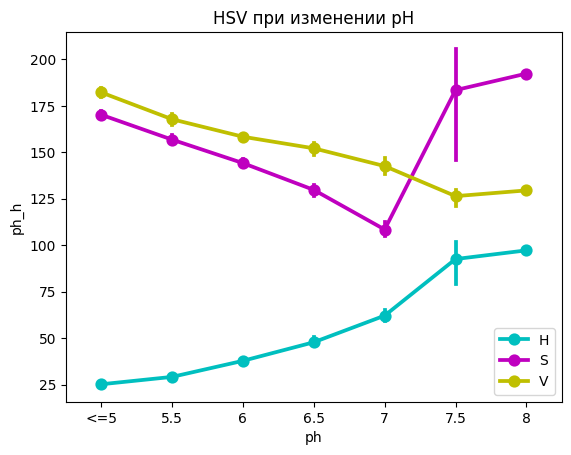

In [866]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="ph", y="ph_h", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'], color = 'c', label = 'H')
sns.pointplot(data=df, x="ph", y="ph_s", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'], color = 'm', label = 'S')
sns.pointplot(data=df, x="ph", y="ph_v", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'], color = 'y', label = 'V')
ax.set_title('HSV при изменении pH')

Text(0.5, 1.0, 'CIE Lab при разных значениях pH')

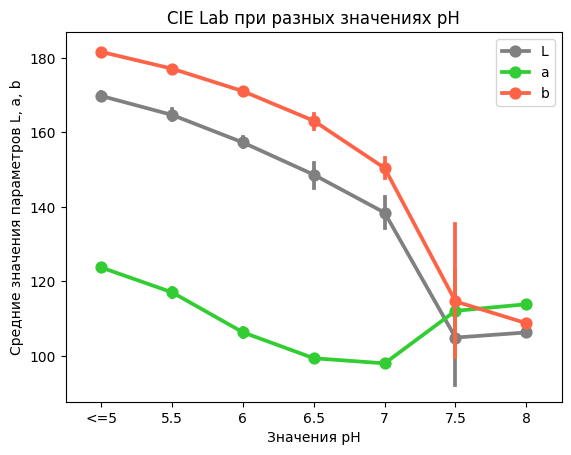

In [240]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="ph", y="ph_l", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'], color = 'gray', label = 'L')
sns.pointplot(data=df, x="ph", y="ph_a", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'], color = 'limegreen', label = 'a')
sns.pointplot(data=df, x="ph", y="ph_b", order=['<=5', '5.5', '6', '6.5', '7', '7.5', '8'], color = 'tomato', label = 'b')
ax.set_xlabel('Значения pH')
ax.set_ylabel('Средние значения параметров L, a, b')
ax.set_title('CIE Lab при разных значениях pH')

### Кровь (эритроциты)

In [2246]:
df.bld.value_counts()

bld
neg        259
>=Ca200     66
Ca25        42
Ca10        28
Ca80        23
Name: count, dtype: int64

Text(0, 0.5, 'RGB')

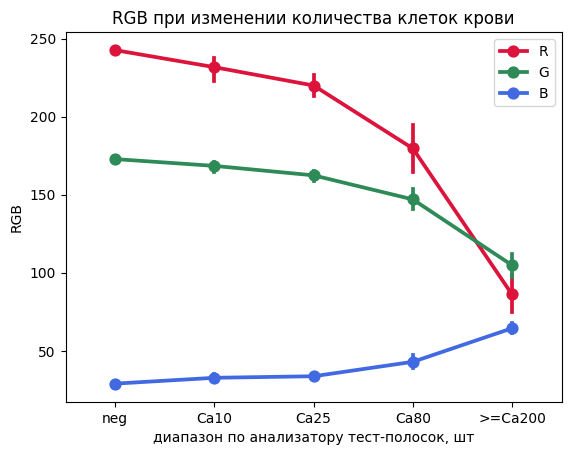

In [2251]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="bld", y="blood_red", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'crimson', label = 'R')
sns.pointplot(data=df, x="bld", y="blood_green", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'seagreen', label = 'G')
sns.pointplot(data=df, x="bld", y="blood_blue", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'royalblue', label = 'B')
ax.set_title('RGB при изменении количества клеток крови')
ax.set_xlabel('диапазон по анализатору тест-полосок, шт')
ax.set_ylabel('RGB')

Text(0, 0.5, 'HSV')

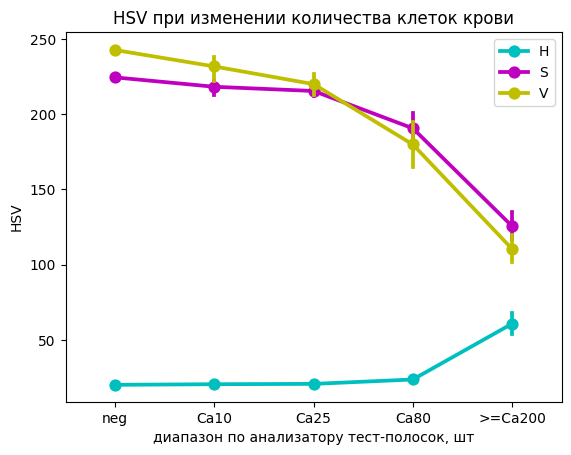

In [2249]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="bld", y="blood_h", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'c', label = 'H')
sns.pointplot(data=df, x="bld", y="blood_s", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'm', label = 'S')
sns.pointplot(data=df, x="bld", y="blood_v", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'y', label = 'V')
ax.set_title('HSV при изменении количества клеток крови')
ax.set_xlabel('диапазон по анализатору тест-полосок, шт')
ax.set_ylabel('HSV')

Text(0, 0.5, 'CIE Lab')

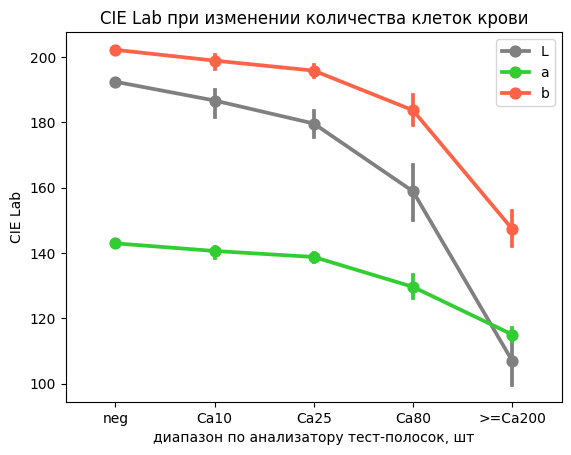

In [2250]:
fig, ax=plt.subplots()
sns.pointplot(data=df,  x="bld", y="blood_l", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'gray', label = 'L')
sns.pointplot(data=df,  x="bld", y="blood_a", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'limegreen', label = 'a')
sns.pointplot(data=df,  x="bld", y="blood_b", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'tomato', label = 'b')
ax.set_title('CIE Lab при изменении количества клеток крови')
ax.set_xlabel('диапазон по анализатору тест-полосок, шт')
ax.set_ylabel('CIE Lab')

### Нитриты

<Axes: xlabel='nit', ylabel='nit_x'>

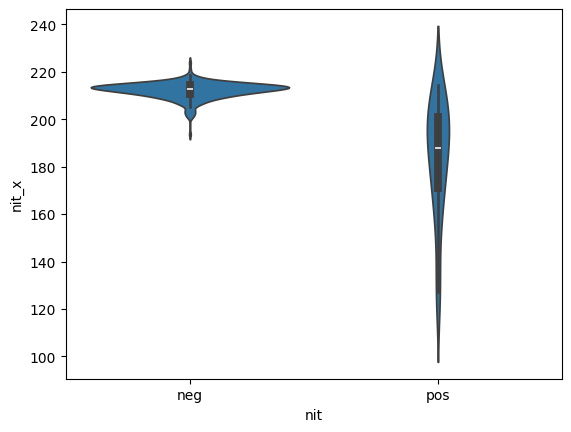

In [364]:
sns.violinplot(data=df, x="nit", y="nit_x") #, order=['neg', '5.6', '14', '28', '>=56'])

## Обучение моделей
### Классификация

In [43]:
from sklearn.utils import shuffle
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.dummy import DummyClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import precision_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix

In [90]:
from lightgbm import LGBMClassifier

In [44]:
from sklearn.metrics import mean_absolute_error 
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures

In [46]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV

#### Глюкоза

In [29]:
# все признаки для глюкозы и бланка
glucose_q = df[['id', 'glu', 'glu_m','gl_red', 'gl_green', 'gl_blue', 'gl_h',
              'gl_s', 'gl_v', 'gl_l', 'gl_a', 'gl_b', 'gl_x', 'gl_y', 'gl_z', 
              'blank_red', 'blank_green', 'blank_blue', 'blank_h', 'blank_s', 'blank_v', 
              'blank_l', 'blank_a', 'blank_b', 'blank_x', 'blank_y', 'blank_z']]

In [155]:
# все признаки для глюкозы и бланка без количественных данных
glucose = df[['id', 'glu', 'gl_red', 'gl_green', 'gl_blue', 'gl_h',
              'gl_s', 'gl_v', 'gl_l', 'gl_a', 'gl_b', 'gl_x', 'gl_y', 'gl_z', 
              'blank_red', 'blank_green', 'blank_blue', 'blank_h', 'blank_s', 'blank_v', 
              'blank_l', 'blank_a', 'blank_b', 'blank_x', 'blank_y', 'blank_z']]

In [156]:
# все признаки для глюкозы и бланка без количественных данных с цветом и прозрачностью
glucose_l = df[['id', 'glu', 'color', 'transparency', 'gl_red', 'gl_green', 'gl_blue', 'gl_h',
              'gl_s', 'gl_v', 'gl_l', 'gl_a', 'gl_b', 'gl_x', 'gl_y', 'gl_z', 
              'blank_red', 'blank_green', 'blank_blue', 'blank_h', 'blank_s', 'blank_v', 
              'blank_l', 'blank_a', 'blank_b', 'blank_x', 'blank_y', 'blank_z']]

In [399]:
# признаки без бланка
glucose = df[['id', 'glu', 'glu_m', 'gl_red', 'gl_green', 'gl_blue', 'gl_h',
              'gl_s', 'gl_v', 'gl_l', 'gl_a', 'gl_b', 'gl_x', 'gl_y', 'gl_z']]

In [157]:
glucose = glucose.dropna()
glucose_l = glucose_l.dropna()

In [158]:
len(glucose), len(glucose_l)

(360, 360)

In [138]:
glucose.head()

,id,glu,gl_red,gl_green,gl_blue,gl_h,gl_s,gl_v,gl_l,gl_a,...,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z,labels
0,401202991936,neg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,400902992051,5.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1
2,401202991933,neg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,406103971050,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2
4,402502991722,neg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [35]:
# выделим признаки
glucose_features = glucose.drop(columns = ['id','glu'], axis = 1)

In [36]:
glucose_features.head()

,gl_red,gl_green,gl_blue,gl_h,gl_s,gl_v,gl_l,gl_a,gl_b,gl_x,...,blank_blue,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z
60,147.297656,87.702969,41.050312,13.211875,184.187187,147.297656,110.267344,148.443906,164.609531,99.496250,...,209.975781,22.191562,24.479219,232.438437,230.007187,127.046875,137.136406,214.493125,226.474531,230.976562
61,160.829844,246.009531,245.370781,89.905625,88.482031,246.246563,234.103594,102.338125,120.042187,198.525937,...,217.131875,26.142813,18.958906,234.545781,234.479688,125.937344,136.105625,219.274531,231.536563,238.393750
62,158.413750,241.908594,239.427656,89.006094,88.051406,242.001875,230.483594,102.477344,121.073906,195.040938,...,199.597187,25.291250,37.075938,233.585156,230.550625,125.353906,142.711719,213.926719,227.055000,221.515781
63,161.170781,244.443750,242.195156,89.252656,86.948906,244.561250,232.795000,102.526094,120.992344,197.567500,...,217.797812,26.910312,19.597656,235.916250,236.075469,125.530312,136.408594,220.428438,233.388281,239.495625
64,153.485469,242.997500,241.900000,89.469531,94.125000,243.276875,230.907813,101.074219,120.074687,193.917344,...,215.515312,27.602031,21.529219,235.256406,235.262188,125.472344,137.207969,219.386094,232.383438,237.260625


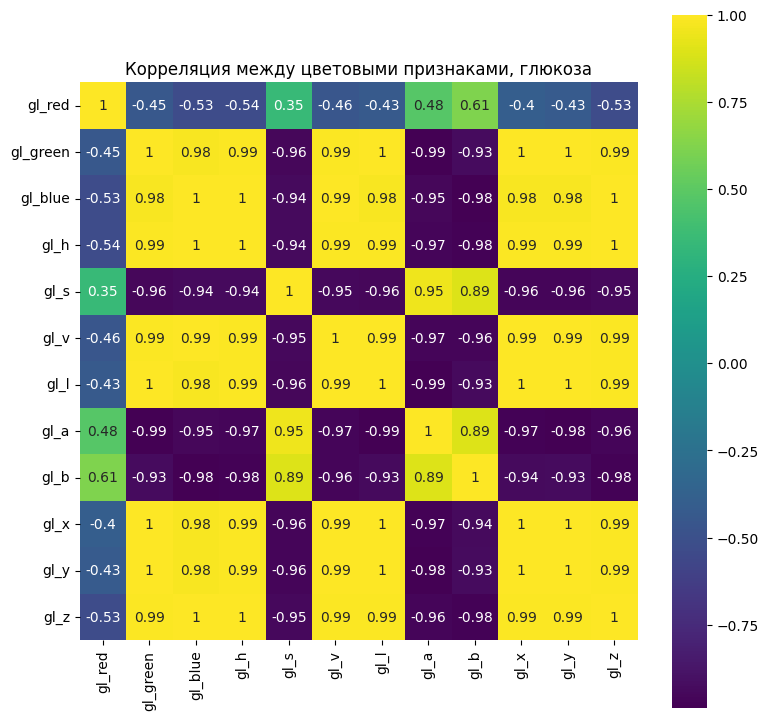

In [397]:
# построим тепловую карту для корреляции между признаками
plt.figure(figsize=(9,9))
corr_matrix = glucose_features.corr()
sns.heatmap(corr_matrix, annot = True, cmap='viridis', square=True)
plt.title('Корреляция между цветовыми признаками, глюкоза');

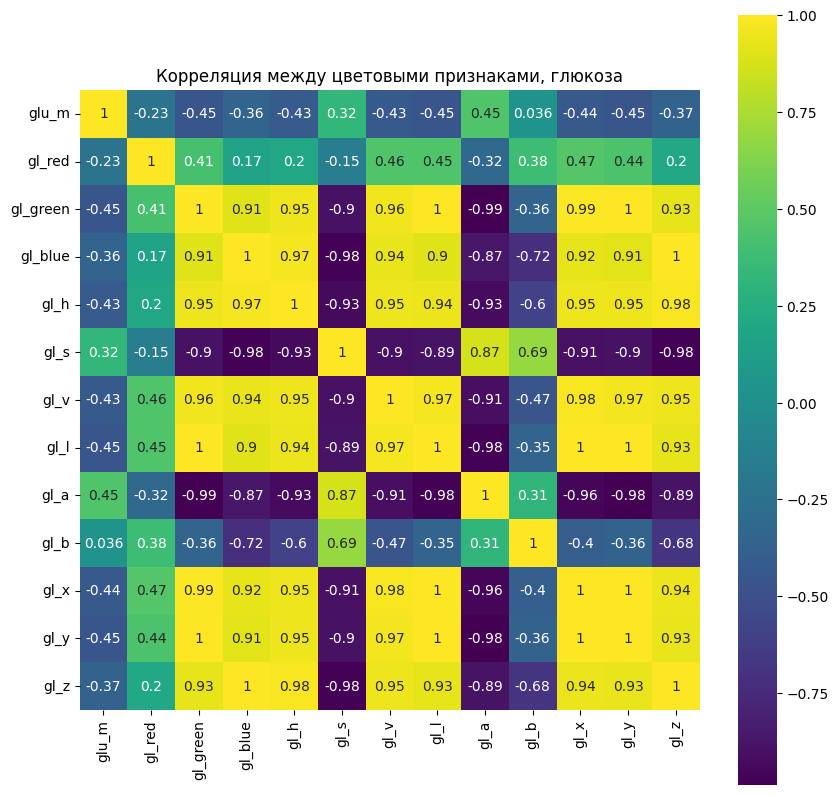

In [405]:
# построим тепловую карту для корреляции между признаками
plt.figure(figsize=(10,10))
corr_matrix = glucose_features.corr()
sns.heatmap(corr_matrix, annot = True, cmap='viridis', square=True)
plt.title('Корреляция между цветовыми признаками, глюкоза');

In [159]:
glucose.glu.unique()

array(['28', 'neg', '14', '5.6', '>=56'], dtype=object)

In [160]:
# метки, словарь
labels = {
    "neg" : 0,
    "5.6" : 1,
    "14" : 2,
    "28" : 3,
    ">=56": 4
}

In [161]:
# обратный словарь для меток
rev_labels = {
    0: "neg",
    1: "5.6",
    2: "14",
    3: "28",
    4: ">=56"
}

In [162]:
glucose['labels'] = glucose['glu'].map(labels)

In [163]:
glucose_l['labels'] = glucose_l['glu'].map(labels)

In [60]:
# выделим признаки для обучения и целевой признак (для признаков с бланками)
X = glucose.iloc[:,2:26]
y = glucose.iloc[:,26]
X.shape, y.shape

((360, 24), (360,))

In [61]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    stratify=y, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [62]:
X_train.shape, X_train.shape, y_train.shape, y_test.shape

((270, 24), (270, 24), (270,), (90,))

In [49]:
# переводим истинные значения в вероятности
y_t = np.array(y_test)
y_true = np.zeros((y_t.size, y_t.max() + 1))
y_true[np.arange(y_t.size), y_t] = 1

In [50]:
y_true[:3]

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.]])

In [51]:
gl_test = y_test.map(rev_labels)

##### Случайный лес

In [52]:
rf = RandomForestClassifier(n_estimators = 25, criterion = 'entropy', random_state = 42)

In [53]:
rf.fit(X_train, y_train)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


RandomForestClassifier(criterion='entropy', n_estimators=25, random_state=42)

In [54]:
y_pred = rf.predict(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [55]:
# вычисляем вероятности
y_prob = rf.predict_proba(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [56]:
y_prob[:3]

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.]])

In [187]:
gl_pred = pd.Series(y_pred).map(rev_labels)
gl_pred.index = gl_test.index
pd.crosstab(gl_test, gl_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', '5.6', '14', '28', '>=56'])[['neg', '5.6', '14', '28', '>=56']]

Predicted,neg,5.6,14,28,>=56
Actual,,,,,
neg,60,1,0,0,0
5.6,0,1,1,0,0
14,0,0,0,1,0
28,0,0,0,10,3
>=56,0,0,0,2,11


In [189]:
glucose['rf_pred'] = gl_pred

In [193]:
gls = glucose.dropna()

In [199]:
gls.head()

,id,glu,gl_red,gl_green,gl_blue,gl_h,gl_s,gl_v,gl_l,gl_a,...,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z,labels,rf_pred,pred_rf
64,403002992118,neg,153.485469,242.997500,241.900000,89.469531,94.125000,243.276875,230.907813,101.074219,...,235.256406,235.262188,125.472344,137.207969,219.386094,232.383438,237.260625,0,neg,0
65,403002992117,neg,151.604688,242.040625,239.658594,89.012031,95.292969,242.068437,229.849844,100.663438,...,235.287344,235.850469,125.361563,136.505781,219.984219,233.006250,239.001719,0,neg,0
77,407103971003,neg,169.391719,222.240469,184.899531,68.837031,60.618281,222.240469,214.709375,103.758906,...,233.334219,234.407187,125.836406,134.720000,218.744219,231.511562,240.495937,0,5.6,0
78,407103971036,28,143.530781,86.108125,39.912031,13.443437,185.460625,143.530781,107.949844,147.663437,...,233.061406,233.625625,125.674219,135.887188,218.004063,230.666875,237.357969,3,28,4
79,402602991927,14,161.147344,201.452812,112.675938,43.567188,112.391406,201.452812,195.338437,99.815313,...,232.997813,234.901875,126.064531,133.119844,219.732656,231.928438,243.706094,2,28,3


In [198]:
gls['pred_rf'] = y_pred

C:\Users\AE28\AppData\Local\Temp\ipykernel_9108\4202204128.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gls['pred_rf'] = y_pred


In [188]:
gl_pred = pd.Series(y_pred).map(rev_labels)
gl_pred.index = gl_test.index
pd.crosstab(gl_test, gl_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', '5.6', '14', '28', '>=56'])[['neg', '5.6', '14', '28', '>=56']]

Predicted,neg,5.6,14,28,>=56
Actual,,,,,
neg,60,1,0,0,0
5.6,0,1,1,0,0
14,0,0,0,1,0
28,0,0,0,10,3
>=56,0,0,0,2,11


In [201]:
cr = pd.crosstab(gl_test, gl_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', '5.6', '14', '28', '>=56'])[['neg', '5.6', '14', '28', '>=56']]

<Axes: xlabel='Predicted', ylabel='Actual'>

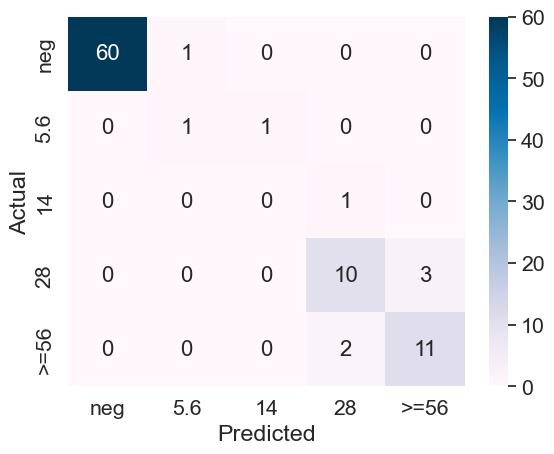

In [217]:
sns.set(font_scale=1.4) 
sns.heatmap(cr, annot=True, cmap='PuBu',annot_kws={"size": 16})

In [2309]:
precision_score(y_test, y_pred, average=None)

array([1.        , 0.5       , 0.        , 0.69230769, 0.71428571])

In [186]:
f1_score(y_test, y_pred, average='weighted')

0.9120940040131961

In [87]:
from sklearn.metrics import cohen_kappa_score
#y1 = ["negative", "positive", "negative", "neutral", "positive"]
#y2 = ["negative", "positive", "negative", "neutral", "negative"]
cohen_kappa_score(y_test, y_pred)

0.8237022526934378

In [716]:
def cross_entropy(predictions, targets, epsilon=1e-12):
    """
    Computes cross entropy between targets (encoded as one-hot vectors)
    and predictions. 
    Input: predictions (N, k) ndarray
           targets (N, k) ndarray        
    Returns: scalar
    """
    predictions = np.clip(predictions, epsilon, 1. - epsilon)
    N = predictions.shape[0]
    ce = -np.sum(targets*np.log(predictions+1e-9))/N
    return ce

In [718]:
cross_entropy(y_true, y_prob)

3.062290468892599

In [64]:
%%time
clf_ovrc = OneVsRestClassifier(SVC()).fit(X_train, y_train)

CPU times: total: 62.5 ms
Wall time: 63.7 ms


C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if no

In [65]:
ysvc_pred = clf_ovrc.predict(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if no

In [66]:
f1_score(y_test, ysvc_pred, average='weighted')

0.7578074074074075

In [67]:
svc = LinearSVC(dual=False, random_state=123)

In [68]:
params_grid = {"C": [10 ** k for k in range(-3, 4)]}
clf = GridSearchCV(svc, params_grid)
clf.fit(X_train, y_train)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anacon

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if no

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if no

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if no

GridSearchCV(estimator=LinearSVC(dual=False, random_state=123),
             param_grid={'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]})

In [69]:
print(
    "Accuracy on the test set with raw data: {:.3f}".format(clf.score(X_test, y_test))
)

Accuracy on the test set with raw data: 0.867


C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [72]:
ysvc_pred = clf.predict(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [73]:
f1_score(y_test, ysvc_pred, average='weighted')

0.865271427647058

##### LGBMClassifier

#### LGBMClassifmier

In [219]:
# выделим признаки для обучения и целевой признак
X_l = glucose_l.iloc[:,2:28]
y_l = glucose_l.iloc[:,28]
X_l.shape, y_l.shape

((360, 26), (360,))

In [220]:
X_l['color'] = X_l['color'].astype('category')
X_l['transparency'] = X_l['transparency'].astype('category')

In [221]:
Xl_train, Xl_test, yl_train, yl_test = train_test_split(X_l, y_l,
                                                    stratify=y_l, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [222]:
Xl_train.shape, Xl_test.shape, yl_train.shape, yl_test.shape

((270, 26), (90, 26), (270,), (90,))

In [223]:
# переводим истинные значения в вероятности
yl_t = np.array(yl_test)
yl_true = np.zeros((yl_t.size, yl_t.max() + 1))
yl_true[np.arange(yl_t.size), yl_t] = 1

In [224]:
train_data = lgb.Dataset(Xl_train, label=yl_train)
valid_data = lgb.Dataset(Xl_test, label=yl_test, reference=train_data)

In [225]:
params = {
    "early_stopping_rounds":10,
    'objective': 'multiclass',
    'num_class': 5,
    'metric': 'multi_logloss',
    'verbose': 20,
    'num_leaves': 15,
    'max_depth': 7
}

In [226]:
num_round = 100
LGBM_clf = lgb.train(params,
                  train_data,
                  num_round,
                  valid_sets=[valid_data])

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.036325
[LightGBM] [Debug] init for col-wise cost 0.000021 seconds, init for row-wise cost 0.000947 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2184
[LightGBM] [Info] Number of data points in the train set: 270, number of used features: 26
[LightGBM] [Info] Start training from score -0.383486
[LightGBM] [Info] Start training from score -3.652512
[LightGBM] [Info] Start training from score -4.212128
[LightGBM] [Info] Start training from score -2.014903
[LightGBM] [Info] Start training from score -1.934860
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 3

C:\Users\AE28\anaconda3\Lib\site-packages\lightgbm\basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
C:\Users\AE28\anaconda3\Lib\site-packages\lightgbm\basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


In [227]:
yl_prob = LGBM_clf.predict(Xl_test)

In [228]:
yl_pred = np.argmax(yl_prob, axis=1)
yl_pred

array([0, 0, 0, 3, 3, 0, 0, 0, 0, 0, 3, 0, 3, 0, 3, 0, 4, 3, 4, 4, 0, 0,
       0, 0, 0, 4, 3, 4, 4, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 4, 0, 0, 0,
       0, 0, 0, 3, 0, 0, 0, 0, 4, 0, 0, 1, 0, 0, 0, 0, 0, 4, 0, 1, 4, 0,
       0, 0, 0, 0, 4, 0, 4, 2, 3, 0, 0, 0, 0, 0, 4, 3, 4, 0, 0, 0, 0, 4,
       3, 0], dtype=int64)

In [229]:
f1_score(yl_test, yl_pred, average='weighted')

0.889162260008655

In [150]:
cohen_kappa_score(yl_test, yl_pred)

0.6253934942287513

In [766]:
cross_entropy(yl_true, yl_prob)

3.534843409019124

In [230]:
gll_test = yl_test.map(rev_labels)

In [231]:
gll_pred = pd.Series(yl_pred).map(rev_labels)
gll_pred.index = gll_test.index
pd.crosstab(gll_test, gll_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', '5.6', '14', '28', '>=56'])[['neg', '5.6', '14', '28', '>=56']]

Predicted,neg,5.6,14,28,>=56
Actual,,,,,
neg,60,1,0,0,0
5.6,0,1,1,0,0
14,0,0,0,1,0
28,0,0,0,8,5
>=56,0,0,0,2,11


In [232]:
cr_l = pd.crosstab(gll_test, gll_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', '5.6', '14', '28', '>=56'])[['neg', '5.6', '14', '28', '>=56']]

<Axes: xlabel='Predicted', ylabel='Actual'>

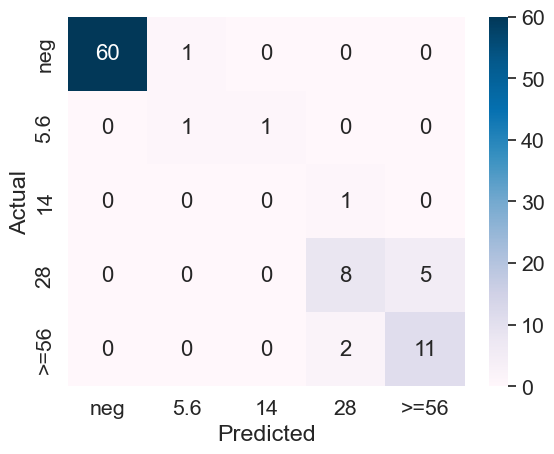

In [237]:
sns.set(font_scale=1.4) 
sns.heatmap(cr_l, annot=True, cmap='PuBu',annot_kws={"size": 16})

In [ ]:
%%time
clf_ovrc = OneVsRestClassifier(SVC()).fit(train_qt, y_train)

In [233]:
lg_clf = LGBMClassifier(objective = 'multiclass', num_class = 5, reg_alpha = 0.2,
                     random_state = 38)

In [234]:
# создадим список гиперпараметров
lgbm_parameters = {
    'num_leaves': [15, 20],
    'n_estimators': [10, 50, 100, 160],
    'learning_rate': [0.05, 0.1],
    'max_depth': [7, 9, 10],
    'metric': ['multi_logloss']
}

In [235]:
# передадим модель и гиперпараметры для обучения с кросс-валидацией и для подбора гиперпаматеров
lgbm_cv = GridSearchCV(lg_clf,
                    param_grid=lgbm_parameters,
                    scoring='f1_weighted',
                    cv=5)

In [236]:
%%time
# выполним обучение модели с подбором гиперпараметров
lgbm_cv.fit(Xl_train, yl_train)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\model_selection\_split.py:684: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


CPU times: total: 3min 9s
Wall time: 30.7 s


GridSearchCV(cv=5,
             estimator=LGBMClassifier(num_class=5, objective='multiclass',
                                      random_state=38, reg_alpha=0.2),
             param_grid={'learning_rate': [0.05, 0.1], 'max_depth': [7, 9, 10],
                         'metric': ['multi_logloss'],
                         'n_estimators': [10, 50, 100, 160],
                         'num_leaves': [15, 20]},
             scoring='f1_weighted')

In [179]:
yl1_pred = lgbm_cv.predict(Xl_test)

In [180]:
yl1_pred 

array([0, 0, 0, 4, 3, 0, 0, 0, 0, 0, 3, 0, 3, 0, 3, 0, 4, 3, 3, 4, 0, 0,
       0, 0, 0, 4, 3, 4, 4, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 3, 0, 0, 0,
       0, 0, 0, 3, 0, 0, 0, 0, 3, 0, 0, 1, 0, 0, 0, 0, 0, 4, 0, 1, 4, 0,
       0, 0, 0, 0, 3, 0, 3, 2, 3, 0, 0, 0, 0, 0, 4, 3, 4, 0, 0, 0, 0, 4,
       3, 0], dtype=int64)

In [181]:
f1_score(yl_test, yl1_pred, average='weighted')

0.8467159910796274

### Белок

In [305]:
protein = df[['id', 'pro', 'pro_red', 'pro_green', 'pro_blue', 'pro_h', 'pro_s', 
              'pro_v', 'pro_l', 'pro_a', 'pro_b', 'pro_x', 'pro_y', 'pro_z', 'blank_red', 'blank_green', 
              'blank_blue', 'blank_h', 'blank_s', 'blank_v', 'blank_l', 'blank_a', 'blank_b',
               'blank_x', 'blank_y', 'blank_z']]

In [306]:
len(protein)

420

In [307]:
protein = protein.dropna()

In [308]:
protein.head()

,id,pro,pro_red,pro_green,pro_blue,pro_h,pro_s,pro_v,pro_l,pro_a,...,blank_blue,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z
60,403002992122,trace,131.076562,163.521562,113.450937,49.307500,78.115469,163.521562,162.503125,107.404062,...,209.975781,22.191562,24.479219,232.438437,230.007187,127.046875,137.136406,214.493125,226.474531,230.976562
61,403002992121,trace,132.211094,170.837344,118.230156,52.036563,78.606406,170.837344,168.368281,104.943438,...,217.131875,26.142813,18.958906,234.545781,234.479688,125.937344,136.105625,219.274531,231.536563,238.393750
62,403002992120,neg,204.097187,199.946094,98.688906,28.938906,131.733281,204.097187,201.772500,115.699531,...,199.597187,25.291250,37.075938,233.585156,230.550625,125.353906,142.711719,213.926719,227.055000,221.515781
63,403002992119,trace,137.373125,173.300156,117.905000,49.707500,81.617656,173.300156,171.132969,105.388750,...,217.797812,26.910312,19.597656,235.916250,236.075469,125.530312,136.408594,220.428438,233.388281,239.495625
64,403002992118,neg,216.081094,208.897031,104.364063,28.045156,131.842187,216.081094,210.458125,116.835000,...,215.515312,27.602031,21.529219,235.256406,235.262188,125.472344,137.207969,219.386094,232.383438,237.260625


In [309]:
protein.shape

(360, 26)

In [310]:
protein['pro'].value_counts()

pro
neg      293
trace     32
0.3       17
1          9
>=3        9
Name: count, dtype: int64

In [311]:
labels = {
    "neg" : 0,
    "trace" : 1,
    "0.3" : 2,
    "1" : 3,
    ">=3": 4
}

In [312]:
rev_labels = {
    0: "neg",
    1: "trace",
    2: "0.3",
    3: "1",
    4: ">=3"
}

In [313]:
protein['labels'] = protein['pro'].map(labels)

In [314]:
# выделим признаки для обучения и целевой признак
X = protein.iloc[:,2:26]
y = protein.iloc[:,26]
X.shape, y.shape

((360, 24), (360,))

In [315]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    stratify=y, 
                                                    test_size=0.25, 
                                                   random_state = 14)

In [316]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((270, 24), (90, 24), (270,), (90,))

##### Random Forest

In [317]:
rf = RandomForestClassifier(n_estimators = 20, criterion = 'entropy', random_state = 42)

In [318]:
rf.fit(X_train, y_train)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


RandomForestClassifier(criterion='entropy', n_estimators=20, random_state=42)

In [319]:
y_pred = rf.predict(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [320]:
pro_pred = pd.Series(y_pred).map(rev_labels)

In [321]:
pro_pred.index = y_test.index

In [322]:
pro_test = y_test.map(rev_labels)

In [323]:
f1_score(y_test, y_pred, average='weighted')

0.8613887216536222

In [324]:
pd.crosstab(pro_test, pro_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'trace', '0.3', '1', '>=3'])[['neg', 'trace', '0.3', '1', '>=3']]

Predicted,neg,trace,0.3,1,>=3
Actual,,,,,
neg,72,1,0,0,0
trace,5,2,0,0,1
0.3,1,0,2,1,0
1,0,0,0,1,1
>=3,0,0,1,0,2


In [325]:
cr_p = pd.crosstab(pro_test, pro_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'trace', '0.3', '1', '>=3'])[['neg', 'trace', '0.3', '1', '>=3']]

<Axes: xlabel='Predicted', ylabel='Actual'>

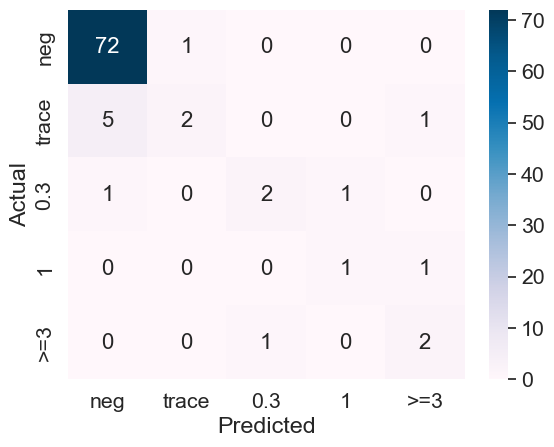

In [326]:
sns.set(font_scale=1.4) 
sns.heatmap(cr_p, annot=True, cmap='PuBu',annot_kws={"size": 16})

#### LGBMClassifier

In [327]:
# выделим признаки для обучения и целевой признак
X_l = protein.iloc[:,2:26]
y_l = protein.iloc[:,26]
X_l.shape, y_l.shape

((360, 24), (360,))

In [328]:
Xl_train, Xl_test, yl_train, yl_test = train_test_split(X_l, y_l,
                                                    stratify=y_l, 
                                                    test_size=0.25, 
                                                    random_state = 14)

In [300]:
Xl_train.shape, Xl_test.shape, yl_train.shape, yl_test.shape

((270, 24), (90, 24), (270,), (90,))

In [301]:
# переводим истинные значения в вероятности
yl_t = np.array(yl_test)
yl_true = np.zeros((yl_t.size, yl_t.max() + 1))
yl_true[np.arange(yl_t.size), yl_t] = 1

In [302]:
train_data = lgb.Dataset(Xl_train, label=yl_train)
valid_data = lgb.Dataset(Xl_test, label=yl_test, reference=train_data)

In [329]:
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test, reference=train_data)

In [330]:
params = {
    "early_stopping_rounds":10,
    'objective': 'multiclass',
    'num_class': 5,
    'metric': 'multi_logloss',
    'verbose': 20,
    'num_leaves': 15,
    'max_depth': 7
}

In [331]:
num_round = 100
LGBM_clf = lgb.train(params,
                  train_data,
                  num_round,
                  valid_sets=[valid_data])

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.000000
[LightGBM] [Debug] init for col-wise cost 0.000017 seconds, init for row-wise cost 0.000578 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2184
[LightGBM] [Info] Number of data points in the train set: 270, number of used features: 24
[LightGBM] [Info] Start training from score -0.204794
[LightGBM] [Info] Start training from score -2.420368
[LightGBM] [Info] Start training from score -3.033473
[LightGBM] [Info] Start training from score -3.652512
[LightGBM] [Info] Start training from score -3.806662
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6 and depth = 4
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7

In [335]:
yl_prob = LGBM_clf.predict(X_test)

In [336]:
yl_pred = np.argmax(yl_prob, axis=1)
yl_pred

array([0, 4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 0,
       0, 0, 4, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 4,
       2, 0], dtype=int64)

In [337]:
f1_score(y_test, yl_pred, average='weighted')

0.8577691930340937

In [338]:
cohen_kappa_score(y_test, yl_pred)

0.578544061302682

In [766]:
cross_entropy(yl_true, yl_prob)

3.534843409019124

In [340]:
prol_test = y_test.map(rev_labels)

In [341]:
prol_pred = pd.Series(yl_pred).map(rev_labels)
prol_pred.index = prol_test.index
pd.crosstab(prol_test, prol_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'trace', '0.3', '1', '>=3'])[['neg', 'trace', '0.3', '1', '>=3']]

Predicted,neg,trace,0.3,1,>=3
Actual,,,,,
neg,72,1,0,0,0
trace,5,2,0,0,1
0.3,1,0,2,1,0
1,0,1,0,0,1
>=3,0,0,0,0,3


In [342]:
cr_l = pd.crosstab(prol_test, prol_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'trace', '0.3', '1', '>=3'])[['neg', 'trace', '0.3', '1', '>=3']]

<Axes: xlabel='Predicted', ylabel='Actual'>

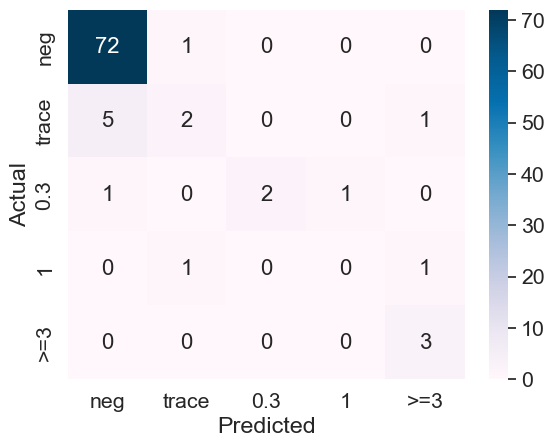

In [343]:
sns.set(font_scale=1.4) 
sns.heatmap(cr_l, annot=True, cmap='PuBu',annot_kws={"size": 16})

In [258]:
cohen_kappa_score(y_test, y_pred)

0.6462882096069869

In [259]:
precision_score(y_test, y_pred, average=None)

array([0.92405063, 1.        , 1.        , 0.5       , 0.6       ])

### pH

In [344]:
# цветовые признаки индикаторной зоны pH и бланка
ph = df[['id', 'ph', 'color', 'transparency', 'ph_red', 'ph_green', 'ph_blue', 'ph_h', 'ph_s', 
              'ph_v', 'ph_l', 'ph_a', 'ph_b', 'ph_x', 'ph_y', 'ph_z', 'blank_red', 'blank_green', 
              'blank_blue', 'blank_h', 'blank_s', 'blank_v', 'blank_l', 'blank_a', 'blank_b',
              'blank_x', 'blank_y', 'blank_z']]

In [377]:
# цветовые признаки всех индкаторных зон
ph_full = df.drop(columns = ['id', 'date', 'day_id', '60_sec', '90_sec', 'color', 'transparency',
       'sg','pro', 'pro_m', 'glu', 'glu_m', 'ket', 'bil', 'ubg', 'nit',
       'uwbc', 'bld', 'leu', 'erhy', 'gender', 'age', 'division'], axis = 1)

In [345]:
len(ph)

420

In [346]:
ph = ph.dropna()

In [378]:
ph_full = ph_full.dropna()

In [347]:
ph.head()

,id,ph,color,transparency,ph_red,ph_green,ph_blue,ph_h,ph_s,ph_v,...,blank_blue,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z
60,403002992122,<=5,red,transparent,154.806094,149.694219,58.763594,28.000000,158.393281,154.806094,...,209.975781,22.191562,24.479219,232.438437,230.007187,127.046875,137.136406,214.493125,226.474531,230.976562
61,403002992121,5.5,bright_yellow,transparent,176.010312,156.982500,54.242344,25.000000,176.606406,176.010312,...,217.131875,26.142813,18.958906,234.545781,234.479688,125.937344,136.105625,219.274531,231.536563,238.393750
62,403002992120,5.5,bright_yellow,transparent,174.299062,155.399531,51.364688,25.100469,180.101719,174.299062,...,199.597187,25.291250,37.075938,233.585156,230.550625,125.353906,142.711719,213.926719,227.055000,221.515781
63,403002992119,6,bright_yellow,transparent,147.412187,153.810313,58.529688,32.051719,158.015156,153.810313,...,217.797812,26.910312,19.597656,235.916250,236.075469,125.530312,136.408594,220.428438,233.388281,239.495625
64,403002992118,5.5,bright_yellow,transparent,180.010781,160.339687,57.772031,24.899219,173.212656,180.010781,...,215.515312,27.602031,21.529219,235.256406,235.262188,125.472344,137.207969,219.386094,232.383438,237.260625


In [348]:
ph['ph'].value_counts()

ph
<=5    152
5.5     99
6       64
6.5     25
7       16
7.5      3
8        1
Name: count, dtype: int64

In [349]:
# метки. Объединяем три категории в одну (pH 7 и выше)
labels = {
    "<=5" : 0,
    "5.5" : 1,
    "6" : 2,
    "6.5" : 3,
    "7": 4,
    "7.5":4,
    "8":4
}

In [350]:
# обратный словарь с метками
rev_labels = {
    0: "<=5",
    1: "5.5",
    2: "6",
    3: "6.5",
    4: ">=7"
}

In [351]:
ph['labels'] = ph['ph'].map(labels)

In [379]:
ph_full['labels'] = ph_full['ph'].map(labels)

In [357]:
ph['labels'].value_counts()

labels
0    152
1     99
2     64
3     25
4     20
Name: count, dtype: int64

In [358]:
categories = [0,1,2,3,4,5]

In [380]:
# выделим признаки для обучения и целевой признак
X_full = ph_full.iloc[:,1:133]
y_full = ph_full.iloc[:,133]
X_full.shape, y_full.shape

((360, 132), (360,))

In [360]:
# выделим признаки для обучения и целевой признак
X = ph.iloc[:,4:28]
y = ph.iloc[:,28]
X.shape, y.shape

((360, 24), (360,))

In [361]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    stratify=y, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [381]:
X_tr, X_tst, y_tr, y_tst = train_test_split(X_full, y_full,
                                                    stratify=y_full, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [362]:
# переводим истинные значения в вероятности
y_t = np.array(y_test)
y_true = np.zeros((y_t.size, y_t.max() + 1))
y_true[np.arange(y_t.size), y_t] = 1

In [382]:
# переводим истинные значения в вероятности
yfull_t = np.array(y_tst)
yfull_true = np.zeros((yfull_t.size, yfull_t.max() + 1))
yfull_true[np.arange(yfull_t.size), yfull_t] = 1

In [134]:
y_true[:3]

array([[0., 1., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.]])

In [135]:
yfull_true[:3]

array([[0., 1., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.]])

In [363]:
X_train.shape, X_train.shape, y_train.shape, y_test.shape

((270, 24), (270, 24), (270,), (90,))

In [383]:
X_tr.shape, X_tst.shape, y_tr.shape, y_tst.shape

((270, 132), (90, 132), (270,), (90,))

In [364]:
ph_test = y_test.map(rev_labels)

In [384]:
phfull_test = y_tst.map(rev_labels)

In [365]:
rf = RandomForestClassifier(n_estimators = 35, criterion = 'entropy', random_state = 42)

In [385]:
rffull = RandomForestClassifier(n_estimators = 50, criterion = 'entropy', random_state = 42)

In [367]:
rf.fit(X_train, y_train)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


RandomForestClassifier(criterion='entropy', n_estimators=35, random_state=42)

In [386]:
rffull.fit(X_tr, y_tr)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


RandomForestClassifier(criterion='entropy', n_estimators=50, random_state=42)

In [368]:
y_pred = rf.predict(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [387]:
yfull_pred = rffull.predict(X_tst)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [369]:
# вычисляем вероятности
y_prob = rf.predict_proba(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [388]:
# вычисляем вероятности
yfull_prob = rffull.predict_proba(X_tst)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [370]:
y_prob[:3]

array([[0.25714286, 0.68571429, 0.05714286, 0.        , 0.        ],
       [0.85714286, 0.14285714, 0.        , 0.        , 0.        ],
       [0.77142857, 0.22857143, 0.        , 0.        , 0.        ]])

In [389]:
yfull_prob[:3]

array([[0.34, 0.62, 0.04, 0.  , 0.  ],
       [0.84, 0.16, 0.  , 0.  , 0.  ],
       [0.46, 0.48, 0.06, 0.  , 0.  ]])

In [371]:
ph_pred = pd.Series(y_pred).map(rev_labels)
ph_pred.index = ph_test.index
pd.crosstab(ph_test, ph_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['<=5', '5.5', '6', '6.5', '>=7'])[['<=5', '5.5', '6', '6.5', '>=7']]

Predicted,<=5,5.5,6,6.5,>=7
Actual,,,,,
<=5,34,4,0,0,0
5.5,12,11,2,0,0
6,0,4,12,0,0
6.5,0,0,2,4,0
>=7,0,0,0,2,3


In [390]:
phfull_pred = pd.Series(yfull_pred).map(rev_labels)
phfull_pred.index = phfull_test.index
pd.crosstab(phfull_test, phfull_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['<=5', '5.5', '6', '6.5', '>=7'])[['<=5', '5.5', '6', '6.5', '>=7']]

Predicted,<=5,5.5,6,6.5,>=7
Actual,,,,,
<=5,33,5,0,0,0
5.5,8,16,1,0,0
6,0,4,12,0,0
6.5,0,0,3,3,0
>=7,0,0,0,2,3


In [152]:
precision_score(y_test, y_pred, average=None)

array([0.74468085, 0.61111111, 0.75      , 0.66666667, 1.        ])

In [372]:
f1_score(y_test, y_pred, average='weighted')

0.700132275132275

In [154]:
from sklearn.metrics import cohen_kappa_score
#y1 = ["negative", "positive", "negative", "neutral", "positive"]
#y2 = ["negative", "positive", "negative", "neutral", "negative"]
cohen_kappa_score(y_test, y_pred)

0.5951052726291164

In [155]:
precision_score(y_tst, yfull_pred, average=None)

array([0.80487805, 0.64      , 0.75      , 0.6       , 1.        ])

In [391]:
f1_score(y_tst, yfull_pred, average='weighted')

0.7418840301751695

In [157]:
cohen_kappa_score(y_tst, yfull_pred)

0.6314102564102564

In [392]:
cr_p = pd.crosstab(phfull_test, phfull_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['<=5', '5.5', '6', '6.5', '>=7'])[['<=5', '5.5', '6', '6.5', '>=7']]

<Axes: xlabel='Predicted', ylabel='Actual'>

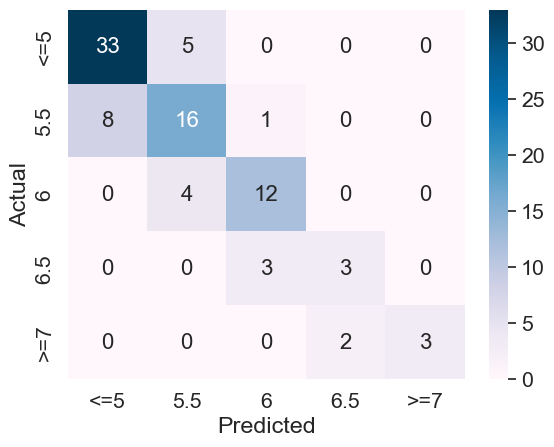

In [393]:
sns.set(font_scale=1.4) 
sns.heatmap(cr_p, annot=True, cmap='PuBu',annot_kws={"size": 16})

In [838]:
def cross_entropy(predictions, targets, epsilon=1e-12):
    """
    Computes cross entropy between targets (encoded as one-hot vectors)
    and predictions. 
    Input: predictions (N, k) ndarray
           targets (N, k) ndarray        
    Returns: scalar
    """
    predictions = np.clip(predictions, epsilon, 1. - epsilon)
    N = predictions.shape[0]
    ce = -np.sum(targets*np.log(predictions+1e-9))/N
    return ce

In [839]:
cross_entropy(y_true, y_prob)

7.413966399791189

#### LGBMClassifmier

In [375]:
# выделим признаки для обучения и целевой признак
X_l = ph.iloc[:,4:28]
y_l = ph.iloc[:,28]
X_l.shape, y_l.shape

((360, 24), (360,))

In [395]:
# выделим признаки для обучения и целевой признак
X_l = ph_full.iloc[:,1:133]
y_l = ph_full.iloc[:,133]
X_l.shape, y_l.shape

((360, 132), (360,))

In [841]:
X_l['color'] = X_l['color'].astype('category')
X_l['transparency'] = X_l['transparency'].astype('category')

In [396]:
Xl_train, Xl_test, yl_train, yl_test = train_test_split(X_l, y_l,
                                                    stratify=y_l, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [397]:
Xl_train.shape, Xl_test.shape, yl_train.shape, yl_test.shape

((270, 132), (90, 132), (270,), (90,))

In [398]:
# переводим истинные значения в вероятности
yl_t = np.array(yl_test)
yl_true = np.zeros((yl_t.size, yl_t.max() + 1))
yl_true[np.arange(yl_t.size), yl_t] = 1

In [399]:
train_data = lgb.Dataset(Xl_train, label=yl_train)
valid_data = lgb.Dataset(Xl_test, label=yl_test, reference=train_data)

In [400]:
params = {
    "early_stopping_rounds":10,
    'objective': 'multiclass',
    'num_class': 5,
    'metric': 'multi_logloss',
    'verbose': 20,
    'num_leaves': 15,
    'max_depth': 7
}

In [401]:
num_round = 100
LGBM_clf = lgb.train(params,
                  train_data,
                  num_round,
                  valid_sets=[valid_data])

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.000000
[LightGBM] [Debug] init for col-wise cost 0.000014 seconds, init for row-wise cost 0.000936 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001529 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 11993
[LightGBM] [Info] Number of data points in the train set: 270, number of used features: 132
[LightGBM] [Info] Start training from score -0.862224
[LightGBM] [Info] Start training from score -1.294357
[LightGBM] [Info] Start training from score -1.727221
[LightGBM] [Info] Start training from score -2.653983
[LightGBM] [Info] Start training from score -2.890372
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves =

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 13 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 14 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 8 and depth = 7
[41]	valid_0's multi_logloss: 0.622651
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 12 and depth = 7
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 

In [402]:
yl_prob = LGBM_clf.predict(Xl_test)

In [403]:
yl_pred = np.argmax(yl_prob, axis=1)
yl_pred

array([1, 0, 1, 0, 0, 0, 0, 2, 1, 0, 0, 1, 2, 0, 0, 3, 1, 0, 4, 1, 1, 2,
       3, 3, 1, 0, 2, 4, 0, 0, 2, 1, 3, 0, 0, 1, 0, 0, 2, 3, 0, 0, 0, 0,
       2, 1, 0, 4, 1, 0, 2, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       2, 0, 1, 1, 2, 1, 0, 0, 0, 0, 3, 1, 2, 0, 0, 1, 4, 2, 2, 0, 1, 1,
       0, 2], dtype=int64)

In [404]:
f1_score(yl_test, yl_pred, average='weighted')

0.7644923154446965

In [189]:
f1_score(yl_test, yl_pred, average='weighted')

0.7644923154446965

In [170]:
cohen_kappa_score(yl_test, yl_pred)

0.6611688777339548

In [171]:
cross_entropy(yl_true, yl_prob)

NameError: name 'cross_entropy' is not defined

In [405]:
phl_test = yl_test.map(rev_labels)

In [406]:
phl_pred = pd.Series(yl_pred).map(rev_labels)
phl_pred.index = phl_test.index
pd.crosstab(phl_test, phl_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['<=5', '5.5', '6', '6.5', '>=7'])[['<=5', '5.5', '6', '6.5', '>=7']]

Predicted,<=5,5.5,6,6.5,>=7
Actual,,,,,
<=5,34,4,0,0,0
5.5,8,16,1,0,0
6,0,4,11,1,0
6.5,0,0,2,4,0
>=7,0,0,0,1,4


In [407]:
cr_p = pd.crosstab(phl_test, phl_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['<=5', '5.5', '6', '6.5', '>=7'])[['<=5', '5.5', '6', '6.5', '>=7']]

<Axes: xlabel='Predicted', ylabel='Actual'>

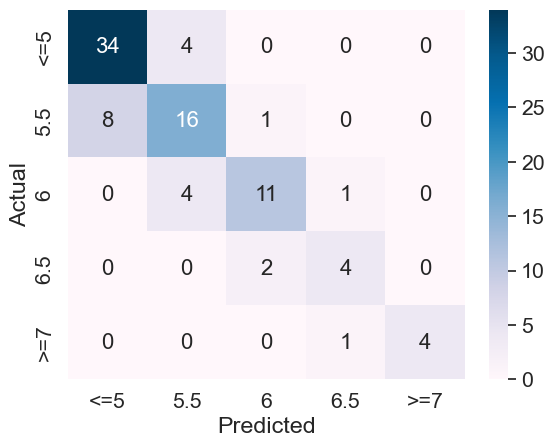

In [408]:
sns.set(font_scale=1.4) 
sns.heatmap(cr_p, annot=True, cmap='PuBu',annot_kws={"size": 16})

In [190]:
phl_pred = pd.Series(yl_pred).map(rev_labels)
phl_pred.index = phl_test.index
pd.crosstab(phl_test, phl_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['<=5', '5.5', '6', '6.5', '>=7'])[['<=5', '5.5', '6', '6.5', '>=7']]

Predicted,<=5,5.5,6,6.5,>=7
Actual,,,,,
<=5,34,4,0,0,0
5.5,8,16,1,0,0
6,0,4,11,1,0
6.5,0,0,2,4,0
>=7,0,0,0,1,4


#### Ordered  Regression

In [37]:
from statsmodels.miscmodels.ordinal_model import OrderedModel

In [69]:
# выделим признаки для обучения и целевой признак
X = ph.iloc[:,4:28]
y = ph.iloc[:,29]
X.shape, y.shape

((360, 24), (360,))

In [70]:
scaler_ph = StandardScaler()
X_sc = scaler_ph.fit_transform(X)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if no

In [71]:
X_train, X_test, y_train, y_test = train_test_split(X_sc, y,
                                                    stratify=y, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [72]:
ordered = OrderedModel(y_train, X_train, distr="probit")  
res_prob = ordered.fit(method='bfgs')
print(res_prob.summary())

Optimization terminated successfully.
         Current function value: 0.577143
         Iterations: 199
         Function evaluations: 206
         Gradient evaluations: 206
                             OrderedModel Results                             
Dep. Variable:                labels2   Log-Likelihood:                -155.83
Model:                   OrderedModel   AIC:                             369.7
Method:            Maximum Likelihood   BIC:                             474.0
Date:                Sat, 11 May 2024                                         
Time:                        23:23:30                                         
No. Observations:                 270                                         
Df Residuals:                     241                                         
Df Model:                          24                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------

In [73]:
predicted = ordered.predict(ordered.start_params, exog=X_train)
predicted

array([[0.42222222, 0.27407407, 0.17777778, 0.07037037, 0.04444444,
        0.01111111],
       [0.42222222, 0.27407407, 0.17777778, 0.07037037, 0.04444444,
        0.01111111],
       [0.42222222, 0.27407407, 0.17777778, 0.07037037, 0.04444444,
        0.01111111],
       ...,
       [0.42222222, 0.27407407, 0.17777778, 0.07037037, 0.04444444,
        0.01111111],
       [0.42222222, 0.27407407, 0.17777778, 0.07037037, 0.04444444,
        0.01111111],
       [0.42222222, 0.27407407, 0.17777778, 0.07037037, 0.04444444,
        0.01111111]])

In [51]:
ph['ph'].value_counts()

ph
<=5    152
5.5     99
6       64
6.5     25
7       16
7.5      3
8        1
Name: count, dtype: int64

In [53]:
ph['labels2'].dtype

CategoricalDtype(categories=[0, 1, 2, 3, 4, 5], ordered=True, categories_dtype=int64)

In [58]:
test = OrderedModel(y, X, distr="logit")  
res_log = test.fit_regularized(method='bfgs')
print(res_log.summary())

AttributeError: 'OrderedModel' object has no attribute 'fit_regularized'

In [261]:
pip install ordinalgbt --user

  Obtaining dependency information for ordinalgbt from https://files.pythonhosted.org/packages/d8/2a/6bdd43a3b81faabd1c4074881b258e436ec91fd6585c11aaa952f22350d7/ordinalgbt-0.1.2-py3-none-any.whl.metadata
  Using cached ordinalgbt-0.1.2-py3-none-any.whl.metadata (2.6 kB)
Using cached ordinalgbt-0.1.2-py3-none-any.whl (8.7 kB)
Note: you may need to restart the kernel to use updated packages.


#### Кровь, модель классификации

In [409]:
blood = df[['id', 'bld', 'color', 'transparency','blood_red', 'blood_green', 'blood_blue', 'blood_h',
              'blood_s', 'blood_v', 'blood_l', 'blood_a', 'blood_b', 'blood_x', 'blood_y', 'blood_z', 
              'blank_red', 'blank_green', 'blank_blue', 'blank_h', 'blank_s', 'blank_v', 
              'blank_l', 'blank_a', 'blank_b', 'blank_x', 'blank_y', 'blank_z']]

In [410]:
blood = blood.dropna()

In [411]:
len(blood)

358

In [412]:
blood.head()

,id,bld,color,transparency,blood_red,blood_green,blood_blue,blood_h,blood_s,blood_v,...,blank_blue,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z
60,403002992122,>=Ca200,red,transparent,56.487031,58.889844,71.374687,115.597813,57.023906,71.374687,...,209.975781,22.191562,24.479219,232.438437,230.007187,127.046875,137.136406,214.493125,226.474531,230.976562
61,403002992121,>=Ca200,bright_yellow,transparent,119.372500,123.954063,50.336562,31.938906,153.512812,125.163594,...,217.131875,26.142813,18.958906,234.545781,234.479688,125.937344,136.105625,219.274531,231.536563,238.393750
62,403002992120,neg,bright_yellow,transparent,243.794062,172.443437,26.933594,20.007344,226.989219,243.794062,...,199.597187,25.291250,37.075938,233.585156,230.550625,125.353906,142.711719,213.926719,227.055000,221.515781
63,403002992119,>=Ca200,bright_yellow,transparent,44.544375,86.869531,84.072187,88.019531,126.816719,86.886250,...,217.797812,26.910312,19.597656,235.916250,236.075469,125.530312,136.408594,220.428438,233.388281,239.495625
64,403002992118,Ca80,bright_yellow,transparent,128.812656,121.350000,36.940625,27.521406,184.528594,128.812656,...,215.515312,27.602031,21.529219,235.256406,235.262188,125.472344,137.207969,219.386094,232.383438,237.260625


In [413]:
# выделим таблицу с признаками
blood_features = blood.drop(columns = ['id','bld', 'color', 'transparency'], axis = 1)

In [2400]:
blood_features.head()

,blood_red,blood_green,blood_blue,blood_h,blood_s,blood_v,blood_l,blood_a,blood_b,blood_x,...,blank_blue,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z
60,56.487031,58.889844,71.374687,115.597813,57.023906,71.374687,63.542812,130.178281,120.003594,57.223281,...,209.975781,22.191562,24.479219,232.438437,230.007187,127.046875,137.136406,214.493125,226.474531,230.976562
61,119.372500,123.954063,50.336562,31.938906,153.512812,125.163594,128.055469,115.517813,166.752969,102.645781,...,217.131875,26.142813,18.958906,234.545781,234.479688,125.937344,136.105625,219.274531,231.536563,238.393750
62,243.794062,172.443437,26.933594,20.007344,226.989219,243.794062,192.437031,143.571875,202.762812,167.155313,...,199.597187,25.291250,37.075938,233.585156,230.550625,125.353906,142.711719,213.926719,227.055000,221.515781
63,44.544375,86.869531,84.072187,88.019531,126.816719,86.886250,86.526406,112.557656,125.144063,64.618281,...,217.797812,26.910312,19.597656,235.916250,236.075469,125.530312,136.408594,220.428438,233.388281,239.495625
64,128.812656,121.350000,36.940625,27.521406,184.528594,128.812656,127.775781,120.373750,172.826719,103.191563,...,215.515312,27.602031,21.529219,235.256406,235.262188,125.472344,137.207969,219.386094,232.383438,237.260625


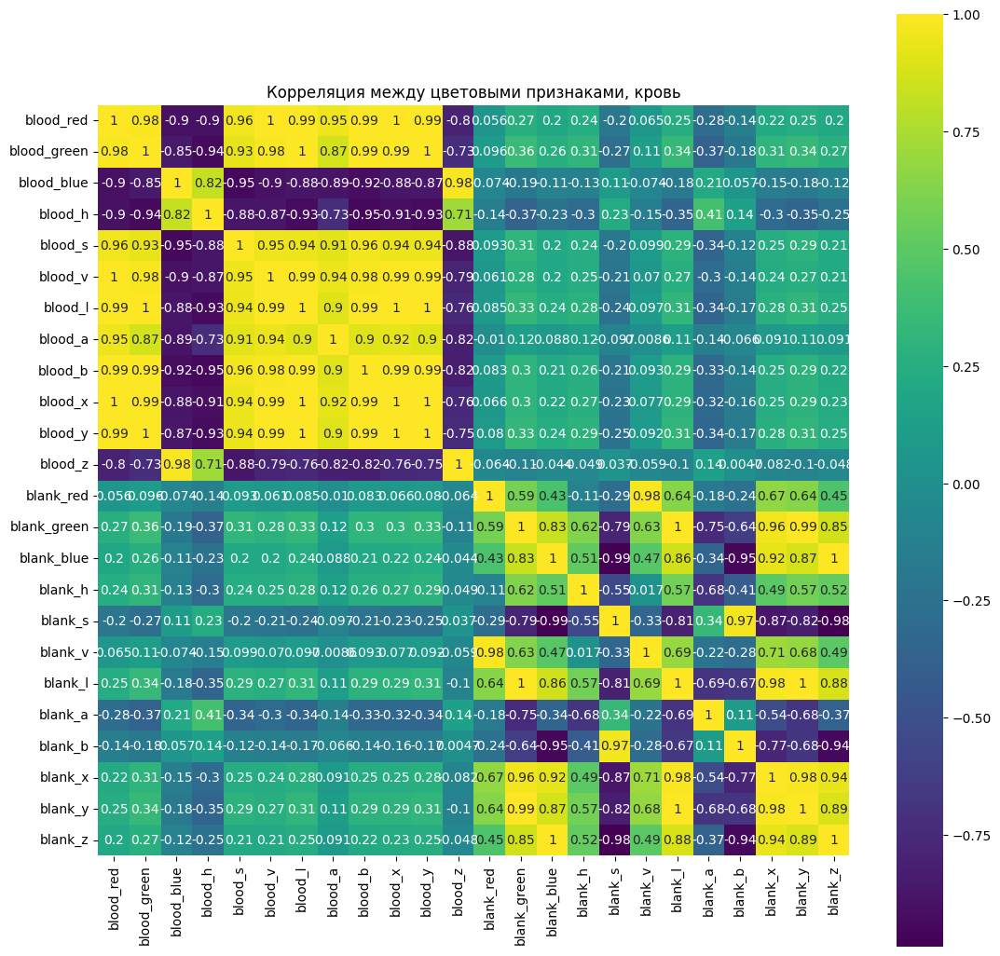

In [775]:
# построим тепловую карту для корреляции между признаками
plt.figure(figsize=(13,13))
corr_matrix = blood_features.corr()
sns.heatmap(corr_matrix, annot = True, cmap='viridis', square=True)
plt.title('Корреляция между цветовыми признаками, кровь');

In [414]:
blood.bld.unique()

array(['>=Ca200', 'neg', 'Ca80', 'Ca25', 'Ca10'], dtype=object)

In [415]:
labels = {
    "neg" : 0,
    "Ca10" : 1,
    "Ca25" : 2,
    "Ca80" : 3,
    ">=Ca200": 4
}

In [416]:
rev_labels = {
    0: "neg",
    1: "Ca10",
    2: "Ca25",
    3: "Ca80",
    4: ">=Ca200"
}

In [417]:
blood['labels'] = blood['bld'].map(labels)

In [418]:
# выделим признаки для обучения и целевой признак
X = blood.iloc[:,4:28]
y = blood.iloc[:,28]
X.shape, y.shape

((358, 24), (358,))

In [419]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    stratify=y, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [420]:
# переводим истинные значения в вероятности
y_t = np.array(y_test)
y_true = np.zeros((y_t.size, y_t.max() + 1))
y_true[np.arange(y_t.size), y_t] = 1

In [421]:
y_true[:3]

array([[0., 1., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1.]])

In [422]:
X_train.shape, X_train.shape, y_train.shape, y_test.shape

((268, 24), (268, 24), (268,), (90,))

In [423]:
bld_test = y_test.map(rev_labels)

In [424]:
rf = RandomForestClassifier(n_estimators = 40, criterion = 'entropy', random_state = 42)

In [425]:
rf.fit(X_train, y_train)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


RandomForestClassifier(criterion='entropy', n_estimators=40, random_state=42)

In [426]:
y_pred = rf.predict(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [427]:
# вычисляем вероятности
y_prob = rf.predict_proba(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [790]:
y_prob[:3]

array([[0.2, 0.6, 0.2, 0. , 0. ],
       [1. , 0. , 0. , 0. , 0. ],
       [0. , 0. , 0. , 0. , 1. ]])

In [428]:
bld_pred = pd.Series(y_pred).map(rev_labels)
bld_pred.index = bld_test.index
pd.crosstab(bld_test, bld_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'])[['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200']]

Predicted,neg,Ca10,Ca25,Ca80,>=Ca200
Actual,,,,,
neg,54,1,1,0,0
Ca10,4,2,0,0,0
Ca25,4,1,3,1,0
Ca80,0,0,1,1,3
>=Ca200,0,0,1,0,13


In [713]:
precision_score(y_test, y_pred, average=None)

array([1.        , 0.5       , 0.5       , 0.75      , 0.71428571])

In [429]:
f1_score(y_test, y_pred, average='weighted')

0.7868460227782261

In [430]:
cr = pd.crosstab(bld_test, bld_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'])[['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200']]

<Axes: xlabel='Predicted', ylabel='Actual'>

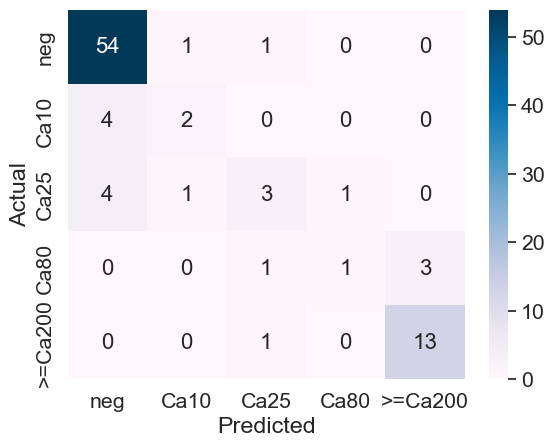

In [431]:
sns.set(font_scale=1.4) 
sns.heatmap(cr, annot=True, cmap='PuBu',annot_kws={"size": 16})

In [794]:
from sklearn.metrics import cohen_kappa_score
#y1 = ["negative", "positive", "negative", "neutral", "positive"]
#y2 = ["negative", "positive", "negative", "neutral", "negative"]
cohen_kappa_score(y_test, y_pred)

0.6458333333333333

In [716]:
def cross_entropy(predictions, targets, epsilon=1e-12):
    """
    Computes cross entropy between targets (encoded as one-hot vectors)
    and predictions. 
    Input: predictions (N, k) ndarray
           targets (N, k) ndarray        
    Returns: scalar
    """
    predictions = np.clip(predictions, epsilon, 1. - epsilon)
    N = predictions.shape[0]
    ce = -np.sum(targets*np.log(predictions+1e-9))/N
    return ce

In [718]:
cross_entropy(y_true, y_prob)

3.062290468892599

In [591]:
from scipy.stats import entropy

In [592]:
epsilon=1e-12
y_pr = np.clip(y_prob, epsilon, 1. - epsilon)

In [593]:
H = entropy(y_true, y_pr)
H

array([0.03370967, 0.83396374, 2.30258509, 0.87381559, 4.47830471])

#### LGBMClassifmier

In [432]:
# выделим признаки для обучения и целевой признак
X_l = blood.iloc[:,2:28]
y_l = blood.iloc[:,28]
X_l.shape, y_l.shape

((358, 26), (358,))

In [433]:
X_l['color'] = X_l['color'].astype('category')
X_l['transparency'] = X_l['transparency'].astype('category')

In [434]:
Xl_train, Xl_test, yl_train, yl_test = train_test_split(X_l, y_l,
                                                    stratify=y_l, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [435]:
Xl_train.shape, Xl_test.shape, yl_train.shape, yl_test.shape

((268, 26), (90, 26), (268,), (90,))

In [436]:
# переводим истинные значения в вероятности
yl_t = np.array(yl_test)
yl_true = np.zeros((yl_t.size, yl_t.max() + 1))
yl_true[np.arange(yl_t.size), yl_t] = 1

In [437]:
train_data = lgb.Dataset(Xl_train, label=yl_train)
valid_data = lgb.Dataset(Xl_test, label=yl_test, reference=train_data)

In [438]:
params = {
    "early_stopping_rounds":10,
    'objective': 'multiclass',
    'num_class': 5,
    'metric': 'multi_logloss',
    'verbose': 20,
    'num_leaves': 15,
    'max_depth': 7
}

In [439]:
num_round = 100
LGBM_clf = lgb.train(params,
                  train_data,
                  num_round,
                  valid_sets=[valid_data])

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.035304
[LightGBM] [Debug] init for col-wise cost 0.000014 seconds, init for row-wise cost 0.000408 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000514 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2161
[LightGBM] [Info] Number of data points in the train set: 268, number of used features: 26
[LightGBM] [Info] Start training from score -0.485042
[LightGBM] [Info] Start training from score -2.700615
[LightGBM] [Info] Start training from score -2.295150
[LightGBM] [Info] Start training from score -2.882937
[LightGBM] [Info] Start training from score -1.829787
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 9 and depth = 6
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7

C:\Users\AE28\anaconda3\Lib\site-packages\lightgbm\basic.py:1780: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
C:\Users\AE28\anaconda3\Lib\site-packages\lightgbm\basic.py:1513: UserWarning: categorical_column in param dict is overridden.
  _log_warning(f'{cat_alias} in param dict is overridden.')


In [440]:
yl_prob = LGBM_clf.predict(Xl_test)

In [441]:
yl_pred = np.argmax(yl_prob, axis=1)
yl_pred

array([1, 0, 4, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 4, 4, 0, 0, 0,
       4, 0, 1, 0, 4, 0, 0, 0, 0, 0, 3, 1, 4, 0, 4, 0, 2, 0, 0, 1, 0, 4,
       0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 4, 2, 1, 0, 1, 1, 0, 0,
       0, 4, 0, 0, 0, 2, 0, 0, 0, 0, 4, 0, 4, 0, 2, 0, 0, 0, 0, 4, 0, 0,
       0, 1], dtype=int64)

In [442]:
f1_score(yl_test, yl_pred, average='weighted')

0.7786407635128436

In [806]:
cohen_kappa_score(yl_test, yl_pred)

0.6532970768184908

In [766]:
cross_entropy(yl_true, yl_prob)

3.534843409019124

In [443]:
bll_test = yl_test.map(rev_labels)

In [444]:
bll_pred = pd.Series(yl_pred).map(rev_labels)
bll_pred.index = bld_test.index
pd.crosstab(bll_test, bll_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'])[['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200']]

Predicted,neg,Ca10,Ca25,Ca80,>=Ca200
Actual,,,,,
neg,54,2,0,0,0
Ca10,2,4,0,0,0
Ca25,4,2,2,1,0
Ca80,0,0,1,0,4
>=Ca200,0,0,1,0,13


In [445]:
cr = pd.crosstab(bll_test, bll_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'])[['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200']]

<Axes: xlabel='Predicted', ylabel='Actual'>

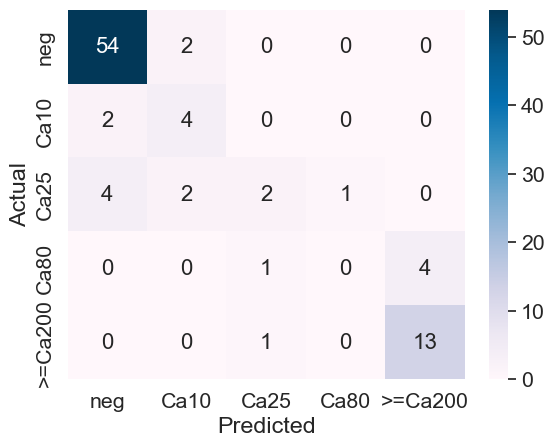

In [446]:
sns.set(font_scale=1.4) 
sns.heatmap(cr, annot=True, cmap='PuBu',annot_kws={"size": 16})

#### Кетоны, модель классификации

In [483]:
ketons = df[['ket', 'ket_red', 'ket_green', 'ket_blue', 'ket_h',
              'ket_s', 'ket_v', 'ket_l', 'ket_a', 'ket_b', 'ket_x', 'ket_y', 'ket_z', 
              'blank_red', 'blank_green', 'blank_blue', 'blank_h', 'blank_s', 'blank_v', 
              'blank_l', 'blank_a', 'blank_b', 'blank_x', 'blank_y', 'blank_z']]

In [484]:
ketons = ketons.dropna()

In [485]:
len(ketons)

359

In [486]:
ketons.head()

,ket,ket_red,ket_green,ket_blue,ket_h,ket_s,ket_v,ket_l,ket_a,ket_b,...,blank_blue,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z
60,0.5,220.036094,185.793906,147.943906,16.019531,83.547969,220.036094,197.756875,134.866719,151.743594,...,209.975781,22.191562,24.479219,232.438437,230.007187,127.046875,137.136406,214.493125,226.474531,230.976562
61,neg,219.305156,184.552656,146.813437,15.931719,84.304219,219.305156,196.730938,135.014531,151.779375,...,217.131875,26.142813,18.958906,234.545781,234.479688,125.937344,136.105625,219.274531,231.536563,238.393750
62,neg,221.725781,185.240781,148.337813,15.265625,84.447187,221.725781,197.879219,135.837656,151.640625,...,199.597187,25.291250,37.075938,233.585156,230.550625,125.353906,142.711719,213.926719,227.055000,221.515781
63,neg,219.995156,188.798281,154.028594,15.611719,76.531250,219.995156,200.137188,133.912500,149.582656,...,217.797812,26.910312,19.597656,235.916250,236.075469,125.530312,136.408594,220.428438,233.388281,239.495625
64,neg,222.993594,190.278281,156.070312,15.255625,76.565313,222.993594,201.876563,134.767344,149.511562,...,215.515312,27.602031,21.529219,235.256406,235.262188,125.472344,137.207969,219.386094,232.383438,237.260625


In [452]:
# выделим таблицу с признаками
#ketons_features = ketons.drop(columns = ['id','ket', 'color', 'transparency'], axis = 1)

In [463]:
ketons_features.head()

NameError: name 'ketons_features' is not defined

In [487]:
ketons.ket.unique()

array(['0.5', 'neg', '3.9', '1.5'], dtype=object)

In [489]:
labels = {
    "neg" : 0,
    "0.5" : 1,
    "1.5" : 2,
    "3.9" : 3
    }

In [490]:
rev_labels = {
    0: "neg",
    1: "0.5",
    2: "1.5",
    3: "3.9"
}

In [491]:
ketons['labels'] = ketons['ket'].map(labels)

In [482]:
# выделим таблицу с признаками
#ketons = ketons.drop(columns = ['ket'], axis = 1)

In [492]:
ketons.head(3)

,ket,ket_red,ket_green,ket_blue,ket_h,ket_s,ket_v,ket_l,ket_a,ket_b,...,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z,labels
60,0.5,220.036094,185.793906,147.943906,16.019531,83.547969,220.036094,197.756875,134.866719,151.743594,...,22.191562,24.479219,232.438437,230.007187,127.046875,137.136406,214.493125,226.474531,230.976562,1
61,neg,219.305156,184.552656,146.813437,15.931719,84.304219,219.305156,196.730938,135.014531,151.779375,...,26.142813,18.958906,234.545781,234.479688,125.937344,136.105625,219.274531,231.536563,238.393750,0
62,neg,221.725781,185.240781,148.337813,15.265625,84.447187,221.725781,197.879219,135.837656,151.640625,...,25.291250,37.075938,233.585156,230.550625,125.353906,142.711719,213.926719,227.055000,221.515781,0


In [493]:
# выделим признаки для обучения и целевой признак
X = ketons.iloc[:,1:25]
y = ketons.iloc[:,25]
X.shape, y.shape

((359, 24), (359,))

In [494]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    stratify=y, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [495]:
# переводим истинные значения в вероятности
y_t = np.array(y_test)
y_true = np.zeros((y_t.size, y_t.max() + 1))
y_true[np.arange(y_t.size), y_t] = 1

In [2455]:
y_true[:3]

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.]])

In [496]:
X_train.shape, X_train.shape, y_train.shape, y_test.shape

((269, 24), (269, 24), (269,), (90,))

In [497]:
ket_test = y_test.map(rev_labels)

In [498]:
rf = RandomForestClassifier(n_estimators = 15, criterion = 'entropy', random_state = 42)

In [499]:
rf.fit(X_train, y_train)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


RandomForestClassifier(criterion='entropy', n_estimators=15, random_state=42)

In [500]:
y_pred = rf.predict(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [501]:
# вычисляем вероятности
y_prob = rf.predict_proba(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [2112]:
y_prob[:3]

array([[1., 0., 0., 0.],
       [1., 0., 0., 0.],
       [1., 0., 0., 0.]])

In [502]:
ket_pred = pd.Series(y_pred).map(rev_labels)
ket_pred.index = ket_test.index
pd.crosstab(ket_test, ket_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', '0.5', '1.5', '3.9'])[['neg', '0.5', '1.5', '3.9']]

Predicted,neg,0.5,1.5,3.9
Actual,,,,
neg,75,1,0,0
0.5,3,4,0,0
1.5,1,0,4,0
3.9,0,0,1,1


In [504]:
cr = pd.crosstab(ket_test, ket_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', '0.5', '1.5', '3.9'])[['neg', '0.5', '1.5', '3.9']]

<Axes: xlabel='Predicted', ylabel='Actual'>

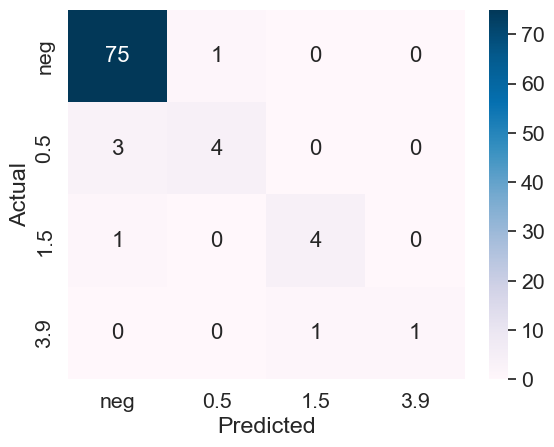

In [505]:
sns.set(font_scale=1.4) 
sns.heatmap(cr, annot=True, cmap='PuBu',annot_kws={"size": 16})

In [713]:
precision_score(y_test, y_pred, average=None)

array([1.        , 0.5       , 0.5       , 0.75      , 0.71428571])

In [503]:
f1_score(y_test, y_pred, average='weighted')

0.9283154121863799

In [2484]:
from sklearn.metrics import cohen_kappa_score
#y1 = ["negative", "positive", "negative", "neutral", "positive"]
#y2 = ["negative", "positive", "negative", "neutral", "negative"]
cohen_kappa_score(y_test, y_pred)

0.7345132743362832

#### LGBM кетоны

In [434]:
Xl_train, Xl_test, yl_train, yl_test = train_test_split(X_l, y_l,
                                                    stratify=y_l, 
                                                    test_size=0.25, 
                                                    random_state = 12)

In [435]:
Xl_train.shape, Xl_test.shape, yl_train.shape, yl_test.shape

((268, 26), (90, 26), (268,), (90,))

In [436]:
# переводим истинные значения в вероятности
yl_t = np.array(yl_test)
yl_true = np.zeros((yl_t.size, yl_t.max() + 1))
yl_true[np.arange(yl_t.size), yl_t] = 1

In [507]:
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test, reference=train_data)

In [508]:
params = {
    "early_stopping_rounds":10,
    'objective': 'multiclass',
    'num_class': 5,
    'metric': 'multi_logloss',
    'verbose': 20,
    'num_leaves': 15,
    'max_depth': 7
}

In [509]:
num_round = 100
LGBM_clf = lgb.train(params,
                  train_data,
                  num_round,
                  valid_sets=[valid_data])

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.000000
[LightGBM] [Debug] init for col-wise cost 0.000011 seconds, init for row-wise cost 0.000325 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2160
[LightGBM] [Info] Number of data points in the train set: 269, number of used features: 24
[LightGBM] [Info] Start training from score -0.169761
[LightGBM] [Info] Start training from score -2.598979
[LightGBM] [Info] Start training from score -2.886661
[LightGBM] [Info] Start training from score -3.648801
[LightGBM] [Info] Start training from score -34.538776
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 3 and depth = 2
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 

In [510]:
yl_prob = LGBM_clf.predict(X_test)

In [511]:
yl_pred = np.argmax(yl_prob, axis=1)
yl_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 3, 0, 2, 0, 3, 0,
       0, 0], dtype=int64)

In [513]:
f1_score(y_test, yl_pred, average='weighted')

0.9172043010752688

In [514]:
cohen_kappa_score(y_test, yl_pred)

0.6907216494845361

In [515]:
cross_entropy(y_true, yl_prob)

NameError: name 'cross_entropy' is not defined

In [516]:
ketl_test = y_test.map(rev_labels)

In [517]:
ketl_pred = pd.Series(yl_pred).map(rev_labels)
ketl_pred.index = ketl_test.index
pd.crosstab(ketl_test, ketl_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', '0.5', '1.5', '3.9'])[['neg', '0.5', '1.5', '3.9']]

Predicted,neg,0.5,1.5,3.9
Actual,,,,
neg,75,1,0,0
0.5,3,4,0,0
1.5,1,0,3,1
3.9,0,0,1,1


In [518]:
cr = pd.crosstab(ketl_test, ketl_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', '0.5', '1.5', '3.9'])[['neg', '0.5', '1.5', '3.9']]

<Axes: xlabel='Predicted', ylabel='Actual'>

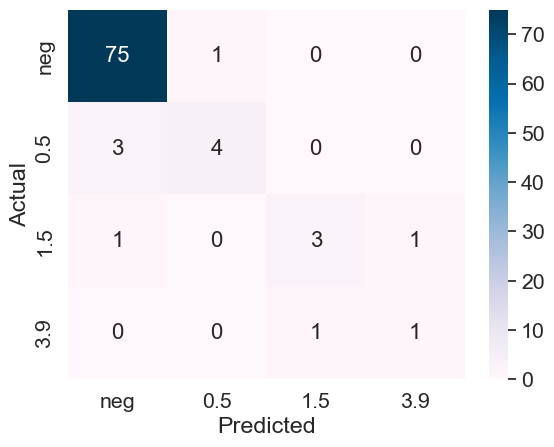

In [519]:
sns.set(font_scale=1.4) 
sns.heatmap(cr, annot=True, cmap='PuBu',annot_kws={"size": 16})

#### Лейкоциты, модель классификации

In [520]:
leuco = df[['leu', 'leu_red', 'leu_green', 'leu_blue', 'leu_h',
              'leu_s', 'leu_v', 'leu_l', 'leu_a', 'leu_b', 'leu_x', 'leu_y', 'leu_z', 
              'blank_red', 'blank_green', 'blank_blue', 'blank_h', 'blank_s', 'blank_v', 
              'blank_l', 'blank_a', 'blank_b', 'blank_x', 'blank_y', 'blank_z']]

In [521]:
leuco = leuco.dropna()

In [522]:
len(leuco)

357

In [523]:
leuco.head()

,leu,leu_red,leu_green,leu_blue,leu_h,leu_s,leu_v,leu_l,leu_a,leu_b,...,blank_blue,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z
60,Ca70,224.004375,214.031719,189.547500,20.967813,39.236875,224.004375,219.051562,127.115469,141.630781,...,209.975781,22.191562,24.479219,232.438437,230.007187,127.046875,137.136406,214.493125,226.474531,230.976562
61,Ca70,227.971406,215.644844,203.280937,14.932969,27.656250,227.971406,221.738594,130.134062,135.279375,...,217.131875,26.142813,18.958906,234.545781,234.479688,125.937344,136.105625,219.274531,231.536563,238.393750
62,neg,227.961406,222.292500,191.997656,25.400625,40.140469,227.961406,225.407969,125.141875,143.289844,...,199.597187,25.291250,37.075938,233.585156,230.550625,125.353906,142.711719,213.926719,227.055000,221.515781
63,Ca125,227.454688,216.722813,207.288125,14.015000,22.485000,227.454688,222.558594,130.219844,133.984688,...,217.797812,26.910312,19.597656,235.916250,236.075469,125.530312,136.408594,220.428438,233.388281,239.495625
64,Ca70,225.799688,214.750313,206.143594,13.099687,22.234687,225.799688,220.919688,130.403281,133.870156,...,215.515312,27.602031,21.529219,235.256406,235.262188,125.472344,137.207969,219.386094,232.383438,237.260625


In [524]:
leuco.leu.unique()

array(['Ca70', 'neg', 'Ca125', '>=Ca500', 'Ca15'], dtype=object)

In [525]:
labels = {
    "neg" : 0,
    "Ca15" : 1,
    "Ca70" : 2,
    "Ca125" : 3,
    ">=Ca500": 4
    }

In [526]:
rev_labels = {
    0: "neg",
    1: "Ca15",
    2: "Ca70",
    3: "Ca125",
    4: ">=Ca500"
}

In [527]:
leuco['labels'] = leuco['leu'].map(labels)

In [529]:
leuco.head(3)

,leu,leu_red,leu_green,leu_blue,leu_h,leu_s,leu_v,leu_l,leu_a,leu_b,...,blank_h,blank_s,blank_v,blank_l,blank_a,blank_b,blank_x,blank_y,blank_z,labels
60,Ca70,224.004375,214.031719,189.547500,20.967813,39.236875,224.004375,219.051562,127.115469,141.630781,...,22.191562,24.479219,232.438437,230.007187,127.046875,137.136406,214.493125,226.474531,230.976562,2
61,Ca70,227.971406,215.644844,203.280937,14.932969,27.656250,227.971406,221.738594,130.134062,135.279375,...,26.142813,18.958906,234.545781,234.479688,125.937344,136.105625,219.274531,231.536563,238.393750,2
62,neg,227.961406,222.292500,191.997656,25.400625,40.140469,227.961406,225.407969,125.141875,143.289844,...,25.291250,37.075938,233.585156,230.550625,125.353906,142.711719,213.926719,227.055000,221.515781,0


In [530]:
# выделим признаки для обучения и целевой признак
X = leuco.iloc[:,1:25]
y = leuco.iloc[:,25]
X.shape, y.shape

((357, 24), (357,))

In [531]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    stratify=y, 
                                                    test_size=0.25, 
                                                    random_state = 38)

In [532]:
# переводим истинные значения в вероятности
y_t = np.array(y_test)
y_true = np.zeros((y_t.size, y_t.max() + 1))
y_true[np.arange(y_t.size), y_t] = 1

In [533]:
y_true[:3]

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [0., 1., 0., 0., 0.]])

In [534]:
X_train.shape, X_train.shape, y_train.shape, y_test.shape

((267, 24), (267, 24), (267,), (90,))

In [535]:
leu_test = y_test.map(rev_labels)

In [536]:
rf = RandomForestClassifier(n_estimators = 20, criterion = 'entropy', random_state = 42)

In [537]:
rf.fit(X_train, y_train)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


RandomForestClassifier(criterion='entropy', n_estimators=20, random_state=42)

In [538]:
y_pred = rf.predict(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [539]:
# вычисляем вероятности
y_prob = rf.predict_proba(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [2514]:
y_prob[:3]

array([[0.8 , 0.15, 0.  , 0.05, 0.  ],
       [0.85, 0.15, 0.  , 0.  , 0.  ],
       [0.65, 0.2 , 0.1 , 0.05, 0.  ]])

In [540]:
leu_pred = pd.Series(y_pred).map(rev_labels)
leu_pred.index = leu_test.index
pd.crosstab(leu_test, leu_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500'])[['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500']]

Predicted,neg,Ca15,Ca70,Ca125,>=Ca500
Actual,,,,,
neg,61,1,0,0,0
Ca15,6,3,0,0,0
Ca70,0,2,1,2,0
Ca125,0,2,1,1,0
>=Ca500,0,0,0,0,10


In [542]:
cr = pd.crosstab(leu_test, leu_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500'])[['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500']]

<Axes: xlabel='Predicted', ylabel='Actual'>

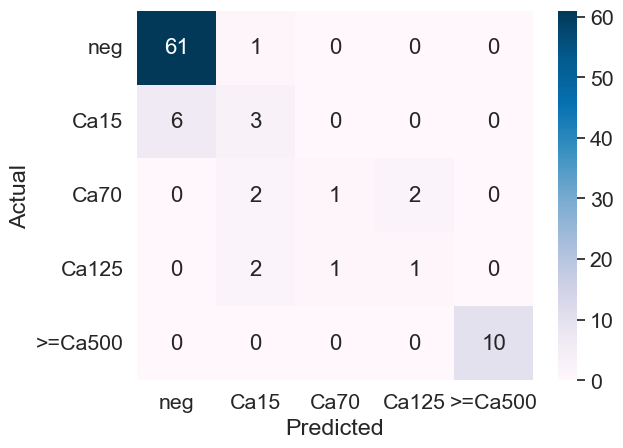

In [543]:
sns.set(font_scale=1.4) 
sns.heatmap(cr, annot=True, cmap='PuBu',annot_kws={"size": 16})

In [713]:
precision_score(y_test, y_pred, average=None)

array([1.        , 0.5       , 0.5       , 0.75      , 0.71428571])

In [541]:
f1_score(y_test, y_pred, average='weighted')

0.8264839786043617

In [2192]:
from sklearn.metrics import cohen_kappa_score
#y1 = ["negative", "positive", "negative", "neutral", "positive"]
#y2 = ["negative", "positive", "negative", "neutral", "negative"]
cohen_kappa_score(y_test, y_pred)

0.6

#### LGBM лейкоциты

In [544]:
train_data = lgb.Dataset(X_train, label=y_train)
valid_data = lgb.Dataset(X_test, label=y_test, reference=train_data)

In [545]:
params = {
    "early_stopping_rounds":10,
    'objective': 'multiclass',
    'num_class': 5,
    'metric': 'multi_logloss',
    'verbose': 20,
    'num_leaves': 15,
    'max_depth': 7
}

In [546]:
num_round = 100
LGBM_clf = lgb.train(params,
                  train_data,
                  num_round,
                  valid_sets=[valid_data])

[LightGBM] [Debug] Dataset::GetMultiBinFromAllFeatures: sparse rate 0.000000
[LightGBM] [Debug] init for col-wise cost 0.000009 seconds, init for row-wise cost 0.000282 seconds
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2160
[LightGBM] [Info] Number of data points in the train set: 267, number of used features: 24
[LightGBM] [Info] Start training from score -0.361502
[LightGBM] [Info] Start training from score -2.291412
[LightGBM] [Info] Start training from score -2.879198
[LightGBM] [Info] Start training from score -3.284664
[LightGBM] [Info] Start training from score -2.219953
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 7 and depth = 3
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Debug] Trained a tree with leaves = 6

In [547]:
yl_prob = LGBM_clf.predict(X_test)

In [548]:
yl_pred = np.argmax(yl_prob, axis=1)
yl_pred

array([0, 0, 0, 0, 3, 0, 0, 0, 4, 1, 0, 4, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 2, 1, 0, 4, 0, 0, 2, 0, 0, 0, 0, 0, 4, 2,
       0, 0, 4, 0, 0, 4, 0, 0, 0, 0, 0, 4, 0, 0, 1, 2, 0, 0, 0, 0, 0, 4,
       0, 3], dtype=int64)

In [549]:
f1_score(y_test, yl_pred, average='weighted')

0.8396246052253804

In [514]:
cohen_kappa_score(y_test, yl_pred)

0.6907216494845361

In [515]:
cross_entropy(y_true, yl_prob)

NameError: name 'cross_entropy' is not defined

In [550]:
leul_test = y_test.map(rev_labels)

In [551]:
leul_pred = pd.Series(yl_pred).map(rev_labels)
leul_pred.index = leul_test.index
pd.crosstab(leul_test, leul_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500'])[['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500']]

Predicted,neg,Ca15,Ca70,Ca125,>=Ca500
Actual,,,,,
neg,61,1,0,0,0
Ca15,6,3,0,0,0
Ca70,0,2,2,1,0
Ca125,0,1,2,1,0
>=Ca500,0,0,0,0,10


In [552]:
cr = pd.crosstab(leul_test, leul_pred, rownames=['Actual'], colnames=['Predicted']).reindex(['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500'])[['neg', 'Ca15', 'Ca70', 'Ca125', '>=Ca500']]

<Axes: xlabel='Predicted', ylabel='Actual'>

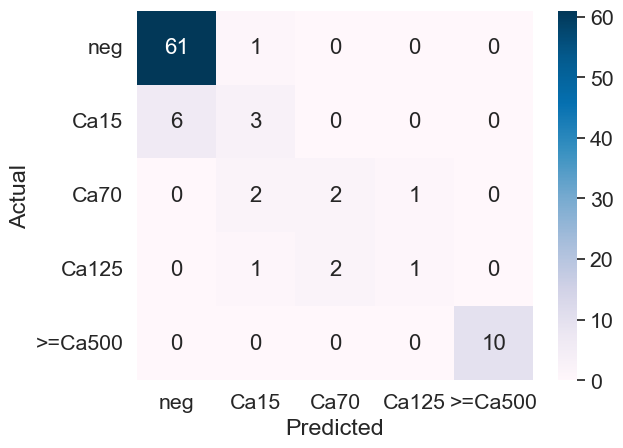

In [553]:
sns.set(font_scale=1.4) 
sns.heatmap(cr, annot=True, cmap='PuBu',annot_kws={"size": 16})

## Количественная калибровка, глюкоза и альбумин

In [13]:
from lightgbm import LGBMRegressor
from lightgbm import plot_importance
from catboost import CatBoostRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression

In [14]:
from sklearn.metrics import mean_absolute_error 
from sklearn.metrics import mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate
from sklearn.model_selection import train_test_split

### Извлечение цветовых характеристик калибровки глюкозы

In [307]:
# загружаем файл с разметкой для калибраторов
gluc = pd.read_excel('glucose_calib.xlsx')

In [308]:
gluc.head()

,date,file,path,repeat,concentration
0,2024-03-10,001.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,0.0
1,2024-03-10,002.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,0.5
2,2024-03-10,003.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,1.0
3,2024-03-10,004.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,1.5
4,2024-03-10,005.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,2.0


In [309]:
gluc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 333 entries, 0 to 332
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           333 non-null    datetime64[ns]
 1   file           333 non-null    object        
 2   path           333 non-null    object        
 3   repeat         333 non-null    int64         
 4   concentration  333 non-null    float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 13.1+ KB


In [317]:
# извлекаем цветовые характеристики и записываем в датафрейм
for i in range(len(gluc)):
    file = gluc.loc[i]['file']
    path = gluc.loc[i]['path']
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    gluc.loc[i, ['gl_red', 'gl_green', 'gl_blue']] = rgb_values
    gluc.loc[i, ['gl_h', 'gl_s', 'gl_v']] = hsv_values
    gluc.loc[i, ['gl_l', 'gl_a', 'gl_b']] = lab_values
    gluc.loc[i, ['gl_x', 'gl_y', 'gl_z']] = xyz_values

In [2517]:
gluc.head()

,date,file,path,repeat,concentration,gl_red,gl_green,gl_blue,gl_h,gl_s,gl_v,gl_l,gl_a,gl_b,gl_x,gl_y,gl_z
0,2024-03-10,001.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,0.0,156.500156,241.468125,233.713906,87.264219,89.733281,241.468125,229.622813,100.686562,123.660000,193.059531,222.744531,253.202188
1,2024-03-10,002.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,0.5,157.870625,238.007812,231.267812,87.452812,85.849375,238.007812,227.167969,102.325312,123.611250,191.974375,220.412187,251.202500
2,2024-03-10,003.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,1.0,155.179375,238.495937,230.741719,87.336406,89.090312,238.495937,227.130937,101.079063,123.733906,190.965625,220.109688,250.717500
3,2024-03-10,004.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,1.5,160.601719,235.744687,225.542344,85.838437,81.260000,235.744687,225.576562,102.611250,125.377813,191.189219,218.995469,245.531563
4,2024-03-10,005.jpg,imgs/glucose_calibration/10032024/60_pads_1/,1,2.0,165.501875,236.741406,223.793281,84.475469,76.670312,236.741406,226.757500,103.113281,127.408750,193.143125,220.799375,243.880625


In [2682]:
gluc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 333 entries, 0 to 332
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           333 non-null    datetime64[ns]
 1   file           333 non-null    object        
 2   path           333 non-null    object        
 3   repeat         333 non-null    int64         
 4   concentration  333 non-null    float64       
 5   gl_red         333 non-null    float64       
 6   gl_green       333 non-null    float64       
 7   gl_blue        333 non-null    float64       
 8   gl_h           333 non-null    float64       
 9   gl_s           333 non-null    float64       
 10  gl_v           333 non-null    float64       
 11  gl_l           333 non-null    float64       
 12  gl_a           333 non-null    float64       
 13  gl_b           333 non-null    float64       
 14  gl_x           333 non-null    float64       
 15  gl_y           333 non-

In [900]:
gluc.to_csv('glucose_calibration.csv', index=False)  

In [2683]:
# сохраняем датафрейм с цветовыми признаками
gluc.to_csv('glucose_calibration_02052024.csv', index=False)  

In [232]:
# загружаем датафрейм с цветовыми признаками
gluc = pd.read_csv('glucose_calibration_02052024.csv')

#### Распределения признаков для калибраторов глюкозы

<Axes: xlabel='concentration', ylabel='gl_h'>

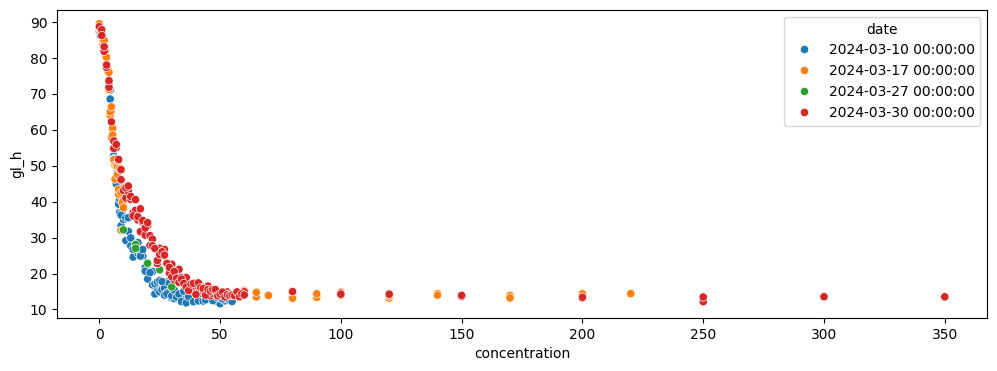

In [319]:
plt.figure(figsize=(12, 4))
sns.scatterplot(data=gluc,
                x='concentration', y='gl_h', hue='date')

### Извлечение цветовых характеристик калибровки альбумин

In [98]:
alb = pd.read_excel('albumin_calib.xlsx')

In [99]:
alb.head()

,date,file,path,repeat,concentration
0,2024-05-01,IMG_20240501_094205.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.00
1,2024-05-01,IMG_20240501_094420.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.05
2,2024-05-01,IMG_20240501_094633.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.30
3,2024-05-01,IMG_20240501_095052.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.10
4,2024-05-01,IMG_20240501_095302.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.35


In [100]:
alb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104 entries, 0 to 103
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           104 non-null    datetime64[ns]
 1   file           104 non-null    object        
 2   path           104 non-null    object        
 3   repeat         104 non-null    int64         
 4   concentration  104 non-null    float64       
dtypes: datetime64[ns](1), float64(1), int64(1), object(2)
memory usage: 4.2+ KB


In [101]:
# извлекаем цветовые характеристики и записываем в датафрейм
for i in range(len(alb)):
    file = alb.loc[i]['file']
    path = alb.loc[i]['path']
    pad = cv2.imread(path + file)
    x_cnt = int(pad.shape[1]/2)
    y_cnt = int(pad.shape[0]/2)
    block = pad[y_cnt-40:y_cnt+40, x_cnt-40:x_cnt+40, :]
    pad_rgb = cv2.cvtColor(block, cv2.COLOR_BGR2RGB)
    pad_hsv = cv2.cvtColor(block, cv2.COLOR_BGR2HSV)
    pad_lab = cv2.cvtColor(block, cv2.COLOR_BGR2LAB)
    pad_xyz = cv2.cvtColor(block, cv2.COLOR_BGR2XYZ)
    rgb_values = np.mean(pad_rgb, axis=(1, 0))
    hsv_values = np.mean(pad_hsv, axis=(1, 0))
    lab_values = np.mean(pad_lab, axis=(1, 0))
    xyz_values = np.mean(pad_xyz, axis=(1, 0))
    alb.loc[i, ['pro_red', 'pro_green', 'pro_blue']] = rgb_values
    alb.loc[i, ['pro_h', 'pro_s', 'pro_v']] = hsv_values
    alb.loc[i, ['pro_l', 'pro_a', 'pro_b']] = lab_values
    alb.loc[i, ['pro_x', 'pro_y', 'pro_z']] = xyz_values

In [102]:
alb.head()

,date,file,path,repeat,concentration,pro_red,pro_green,pro_blue,pro_h,pro_s,pro_v,pro_l,pro_a,pro_b,pro_x,pro_y,pro_z
0,2024-05-01,IMG_20240501_094205.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.00,225.730938,216.899844,120.511719,27.350781,118.866250,225.730938,218.311563,117.852344,176.384688,192.490000,211.808906,144.572812
1,2024-05-01,IMG_20240501_094420.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.05,217.367969,212.205625,114.893438,28.534375,120.207344,217.367969,213.297344,116.641094,176.407187,186.204062,206.385625,138.764062
2,2024-05-01,IMG_20240501_094633.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.30,171.306719,188.706094,121.740313,37.539844,90.505156,188.706094,188.371875,111.009844,159.857969,159.952188,179.862656,141.560625
3,2024-05-01,IMG_20240501_095052.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.10,206.795312,206.177812,112.020938,29.897500,116.974688,206.927656,206.873125,115.002813,174.444531,179.093906,199.375937,135.019375
4,2024-05-01,IMG_20240501_095302.jpg,imgs/albumin_calibration/01052024/60_pads_1/,1,0.35,158.985312,186.017812,113.669687,41.064844,99.153281,186.017812,183.867031,106.662813,161.650937,152.662344,175.097969,133.229219


In [103]:
alb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 104 entries, 0 to 103
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   date           104 non-null    datetime64[ns]
 1   file           104 non-null    object        
 2   path           104 non-null    object        
 3   repeat         104 non-null    int64         
 4   concentration  104 non-null    float64       
 5   pro_red        104 non-null    float64       
 6   pro_green      104 non-null    float64       
 7   pro_blue       104 non-null    float64       
 8   pro_h          104 non-null    float64       
 9   pro_s          104 non-null    float64       
 10  pro_v          104 non-null    float64       
 11  pro_l          104 non-null    float64       
 12  pro_a          104 non-null    float64       
 13  pro_b          104 non-null    float64       
 14  pro_x          104 non-null    float64       
 15  pro_y          104 non-

In [105]:
# записываем датафрейм с цветовыми признаками
alb.to_csv('albumin_calibration_11052024.csv', index=False)  

In [263]:
# загружаем датафрейм с цветовыми признаками
alb = pd.read_csv('albumin_calibration_11052024.csv')

<Axes: xlabel='concentration', ylabel='pro_b'>

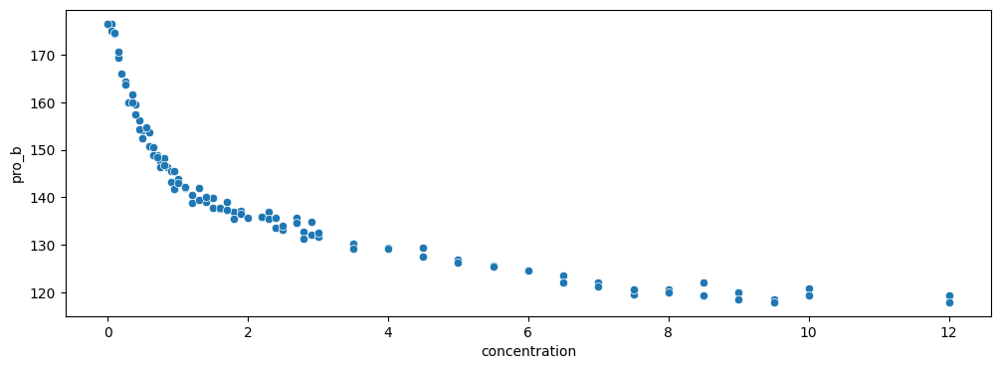

In [264]:
plt.figure(figsize=(12, 4))
sns.scatterplot(data=alb,
                x='concentration', y='pro_b')

<Axes: xlabel='pro_m', ylabel='pro_b'>

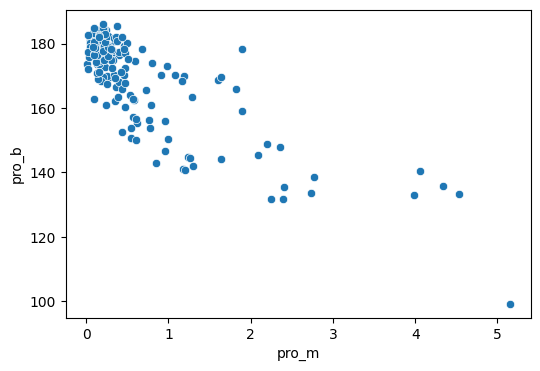

In [262]:
fig= plt.figure(figsize=(6, 4))
sns.scatterplot(data=df,
                x='pro_m', y='pro_b')

In [107]:
prot = df[~df['pro_m'].isna()]

In [108]:
df['pro_m'].isna().sum()

242

In [109]:
prot[['id', 'pro_m']].head()

,id,pro_m
1,400902992051,0.27
3,406103971050,0.14
4,402502991722,0.23
5,404402992385,0.39
6,404402992389,2.26


In [110]:
len(prot)

178

<Axes: xlabel='pro_m', ylabel='pro_b'>

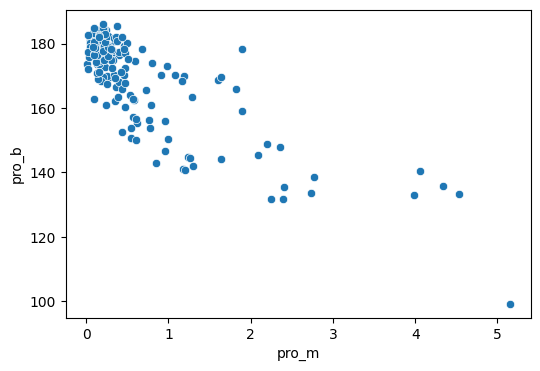

In [111]:
fig= plt.figure(figsize=(6, 4))
sns.scatterplot(data=prot,
                x='pro_m', y='pro_b')

### Модели для количественной оценки глюкозы

In [1324]:
gluc1 = gluc[198:]
gluc1.head()

,date,file,path,repeat,concentration,gl_red,gl_green,gl_blue,gl_h,gl_s,gl_v,gl_l,gl_a,gl_b,gl_x,gl_y,gl_z
198,2024-03-30,001.jpg,imgs/glucose_calibration/30032024/60_pads_1/,1,0.0,149.004531,244.608906,240.327969,88.619062,99.698437,244.608906,231.408281,98.818281,121.097813,192.370156,223.861719,254.937031
199,2024-03-30,002.jpg,imgs/glucose_calibration/30032024/60_pads_1/,1,1.0,155.733438,236.958125,230.582969,87.759375,87.418906,236.958125,226.084375,102.001875,123.241875,190.788125,219.031875,250.527656
200,2024-03-30,003.jpg,imgs/glucose_calibration/30032024/60_pads_1/,1,2.0,161.194063,235.196562,214.544062,81.777031,80.194063,235.196562,224.456250,100.713281,130.788437,189.536875,218.221875,234.947500
201,2024-03-30,004.jpg,imgs/glucose_calibration/30032024/60_pads_1/,1,3.0,170.267031,232.955469,206.517969,77.279531,68.672344,232.955469,223.804375,102.980156,134.719375,190.898438,217.953750,227.459531
202,2024-03-30,005.jpg,imgs/glucose_calibration/30032024/60_pads_1/,1,4.0,165.019219,224.515312,188.435156,71.798750,67.597500,224.515312,215.813594,102.120312,139.806875,182.525313,209.512500,208.971875


In [1325]:
gluc1.shape

(135, 17)

In [2518]:
selected_features = ['concentration','gl_red', 'gl_green', 'gl_h', 'gl_v', 'gl_b','gl_x','gl_y','gl_z']

In [1937]:
selected_features2 = ['concentration','gl_red', 'gl_blue', 'gl_green', 'gl_h', 'gl_v', 'gl_l', 'gl_b','gl_x','gl_y','gl_z']

In [2519]:
# выбранные признаки
features = gluc[selected_features]
features.shape

(333, 9)

In [1938]:
# выбранные признаки
features = gluc[selected_features2]
features.shape

(333, 11)

In [1444]:
# только RGB
features = gluc[['concentration', 'gl_red', 'gl_blue', 'gl_green']]
features.shape

(333, 4)

In [1422]:
# только HSV
features = gluc[['concentration', 'gl_h', 'gl_s', 'gl_v']]
features.shape

(333, 4)

In [1453]:
# только CIE Lab
features = gluc[['concentration', 'gl_l', 'gl_a', 'gl_b']]
features.shape

(333, 4)

In [1464]:
# только XYZ
features = gluc[['concentration', 'gl_x', 'gl_y', 'gl_z']]
features.shape

(333, 4)

In [1990]:
# все признаки
features = gluc.drop(columns= ['date', 'file', 'path', 'repeat'] , axis = 1)
features.shape

(333, 13)

In [2522]:
features = features.loc[features['concentration'] <=50]
features.shape, features['concentration'].max()

((266, 9), 50.0)

In [1234]:
features = features.loc[features['concentration'] <=30]
features.shape, features['concentration'].max()

((188, 12), 30.0)

In [2521]:
X = features.drop(columns = ['concentration'], axis = 1)
y = features['concentration']

In [2528]:
# Разделим выборку на обучающую и тестовую 
X_train, X_test, y_train, y_test = (train_test_split(X, y, train_size = 0.8,
                                                                    random_state = 26))

In [2533]:
train, test = (train_test_split(features, train_size = 0.8,
                                                                    random_state = 26))
train.shape, test.shape

((212, 9), (54, 9))

In [2563]:
test3 = test.query('concentration <=4')

In [2564]:
test5 = test.query('4< concentration <10')

In [2565]:
test14 = test.query('10<= concentration <20')

In [2566]:
test28 = test.query('20<= concentration <32')

In [2567]:
test56 = test.query('32<=concentration')

In [2568]:
X_3 = test3.drop(columns = ['concentration'], axis = 1)
y_3 = test3['concentration']

In [2569]:
X_5 = test5.drop(columns = ['concentration'], axis = 1)
y_5 = test5['concentration']

In [2570]:
X_14 = test14.drop(columns = ['concentration'], axis = 1)
y_14 = test14['concentration']

In [2571]:
X_28 = test28.drop(columns = ['concentration'], axis = 1)
y_28 = test28['concentration']

In [2572]:
X_56 = test56.drop(columns = ['concentration'], axis = 1)
y_56 = test56['concentration']

In [2532]:
train.head()

,concentration,gl_red,gl_green,gl_h,gl_v,gl_b,gl_x,gl_y,gl_z
136,4.5,165.074375,217.100469,63.985000,217.100469,144.662187,176.782656,202.901875,192.600156
212,14.0,163.139688,186.796719,36.941719,186.796719,176.424375,149.266562,174.346875,105.324531
53,43.0,142.821875,88.191719,13.410156,142.821875,162.560156,98.314844,96.565469,54.747656
243,45.0,160.389844,113.506875,16.502969,160.389844,166.961094,116.697812,119.227812,69.035625
42,32.0,150.727500,92.122500,13.729688,150.727500,164.947812,103.028281,101.175469,55.567656


In [2529]:
X_train.head()

,gl_red,gl_green,gl_h,gl_v,gl_b,gl_x,gl_y,gl_z
136,165.074375,217.100469,63.985000,217.100469,144.662187,176.782656,202.901875,192.600156
212,163.139688,186.796719,36.941719,186.796719,176.424375,149.266562,174.346875,105.324531
53,142.821875,88.191719,13.410156,142.821875,162.560156,98.314844,96.565469,54.747656
243,160.389844,113.506875,16.502969,160.389844,166.961094,116.697812,119.227812,69.035625
42,150.727500,92.122500,13.729688,150.727500,164.947812,103.028281,101.175469,55.567656


In [2573]:
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((212, 8), (54, 8), (212,), (54,))

In [2574]:
# инициализируем стандартизатор StandardScaler
scaler = StandardScaler()
# стандартизируем значения в обучаюшей выборке
XS_train = scaler.fit_transform(X_train)
# используя обученный scaler, стандартизируем значения  в тестовой выборке
XS_test = scaler.transform(X_test)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if no

In [2575]:
XS_test_3 = scaler.transform(X_3)
XS_test_5 = scaler.transform(X_5)
XS_test_14 = scaler.transform(X_14)
XS_test_28 = scaler.transform(X_28)
XS_test_56 = scaler.transform(X_56)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if no

In [2576]:
# генерируем полиномиальные признаки на основе стандартизированных
# инициализируем полиномиальные признаки
poly = PolynomialFeatures(degree=2, include_bias=False)
# преобразуем признаки в обучающей выборке
PS_train = poly.fit_transform(XS_train)
# преобразуем признаки в тестовой выборке
PS_test = poly.transform(XS_test)
PS_train.shape

(212, 44)

In [2577]:
PS_test_3 = poly.transform(XS_test_3)
PS_test_5 = poly.transform(XS_test_5)
PS_test_14 = poly.transform(XS_test_14)
PS_test_28 = poly.transform(XS_test_28)
PS_test_56 = poly.transform(XS_test_56)

In [1831]:
results_50 = {'model': [],
           '12 features, MAE on validation': [],
            '10 features, MAE on validation': [],
            '8 features, MAE on validation': []
           }

In [1004]:
results_30 = {'model': [],
           '10 features, MAE on validation': []
           }

In [1832]:
# предсказания на полной выборке
lr = LinearRegression()
cv_results = cross_validate(lr, XS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results['test_score'].mean()))

MAE на тренировочных фолдах: 2.75
MAE на валидационных фолдах: 3.02


In [1833]:
# предсказания на выборке до 50 ммоль/л
lr = LinearRegression()
cv_results = cross_validate(lr, XS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results['test_score'].mean()))

MAE на тренировочных фолдах: 2.75
MAE на валидационных фолдах: 3.02


In [1869]:
# предсказания на 10 признаках, выборке до 50 ммоль/л
lr = LinearRegression()
cv_results = cross_validate(lr, XS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results['test_score'].mean()))

MAE на тренировочных фолдах: 2.93
MAE на валидационных фолдах: 3.08


In [1904]:
# предсказания на 8 признаках, выборке до 50 ммоль/л
lr = LinearRegression()
cv_results = cross_validate(lr, XS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results['test_score'].mean()))

MAE на тренировочных фолдах: 3.24
MAE на валидационных фолдах: 3.41


In [1767]:
# 8 признаков, предсказания на выборке до 50 ммоль/л
lr = LinearRegression()
cv_results = cross_validate(lr, XS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results['test_score'].mean()))

MAE на тренировочных фолдах: 3.24
MAE на валидационных фолдах: 3.41


In [1006]:
# предсказания на выборке до 30 ммоль/л
lr = LinearRegression()
cv_results = cross_validate(lr, XS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results['test_score'].mean()))

MAE на тренировочных фолдах: 2.02
MAE на валидационных фолдах: 2.28


In [1834]:
# предсказания на выборке до 50 ммоль/л
lr_poly = LinearRegression()
cv_results_poly = cross_validate(lr_poly, PS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results_poly['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results_poly['test_score'].mean()))

MAE на тренировочных фолдах: 1.74
MAE на валидационных фолдах: 13.74


In [1870]:
# предсказания на 10 признаках выборке до 50 ммоль/л
lr_poly = LinearRegression()
cv_results_poly = cross_validate(lr_poly, PS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results_poly['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results_poly['test_score'].mean()))

MAE на тренировочных фолдах: 1.97
MAE на валидационных фолдах: 9.01


In [1905]:
# 8 признаков, предсказания на выборке до 50 ммоль/л
lr_poly = LinearRegression()
cv_results_poly = cross_validate(lr_poly, PS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results_poly['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results_poly['test_score'].mean()))

MAE на тренировочных фолдах: 2.05
MAE на валидационных фолдах: 3.52


In [1007]:
# предсказания на выборке до 30 ммоль/л
lr_poly = LinearRegression()
cv_results_poly = cross_validate(lr_poly, PS_train, y_train, scoring='neg_mean_absolute_error',
                            cv=5, return_train_score=True, return_estimator=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results_poly['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results_poly['test_score'].mean()))

MAE на тренировочных фолдах: 1.02
MAE на валидационных фолдах: 8.93


In [1835]:
results_50['model'].append('LinearRegression')
results_50['12 features, MAE on validation'].append(-cv_results['test_score'].mean())

In [1871]:
results_50['10 features, MAE on validation'].append(-cv_results['test_score'].mean())

In [1906]:
results_50['8 features, MAE on validation'].append(-cv_results['test_score'].mean())

In [1836]:
results_50['model'].append('LinearRegression polynomial')
results_50['12 features, MAE on validation'].append(-cv_results_poly['test_score'].mean())

In [1872]:
results_50['10 features, MAE on validation'].append(-cv_results_poly['test_score'].mean())

In [1907]:
results_50['8 features, MAE on validation'].append(-cv_results_poly['test_score'].mean())

In [1584]:
-cv_results_poly['test_score'].mean()

13.742857349778252

In [1008]:
results_30['model'].append('LinearRegression')
results_30['MAE for validation'].append(-cv_results['test_score'].mean())

In [1009]:
results_30['model'].append('LinearRegression polynomial')
results_30['MAE for validation'].append(-cv_results['test_score'].mean())

In [1908]:
lasso = Lasso(max_iter = 1000)
lasso_poly= Lasso(max_iter = 1000)

In [1909]:
# задаем сетку с диапазонам гиперпараметров для подбора с помощью GridSearchCV
lasso_grid = {'alpha': [0.15, 0.2, 0.5, 1]}
# создадим модель для обучения с кросс-валидацией
lasso_cv = GridSearchCV(lasso, param_grid = lasso_grid, scoring='neg_mean_absolute_error', cv=5)
# создадим модель для обучения с кросс-валидацией
lasso_poly_cv = GridSearchCV(lasso_poly, param_grid = lasso_grid, scoring='neg_mean_absolute_error', cv=5)

In [1910]:
%%time
# обучаем и проверяем модели с использованием GridSearchCV
lasso_cv.fit(XS_train, y_train) 

CPU times: total: 31.2 ms
Wall time: 33.9 ms


GridSearchCV(cv=5, estimator=Lasso(), param_grid={'alpha': [0.15, 0.2, 0.5, 1]},
             scoring='neg_mean_absolute_error')

In [1911]:
%%time
# обучаем и проверяем модели с использованием GridSearchCV
lasso_poly_cv.fit(PS_train, y_train) 

CPU times: total: 62.5 ms
Wall time: 62.7 ms


C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.358e+00, tolerance: 4.175e+00
  model = cd_fast.enet_coordinate_descent(
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.888e+00, tolerance: 4.144e+00
  model = cd_fast.enet_coordinate_descent(
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.303e+00, tolerance: 

GridSearchCV(cv=5, estimator=Lasso(), param_grid={'alpha': [0.15, 0.2, 0.5, 1]},
             scoring='neg_mean_absolute_error')

In [1842]:
# все признаки
print("Наилучшие подобранные значения гиперпараметров :", lasso_cv.best_params_)
print("Наилучшее MAE : {:.2f}".format(-lasso_cv.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 0.15}
Наилучшее MAE : 3.54


In [1878]:
# 10 признаков
print("Наилучшие подобранные значения гиперпараметров :", lasso_cv.best_params_)
print("Наилучшее MAE : {:.2f}".format(-lasso_cv.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 0.15}
Наилучшее MAE : 3.63


In [1912]:
# 8 признаков
print("Наилучшие подобранные значения гиперпараметров :", lasso_cv.best_params_)
print("Наилучшее MAE : {:.2f}".format(-lasso_cv.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 0.15}
Наилучшее MAE : 3.63


In [1843]:
# все признаки
print("Наилучшие подобранные значения гиперпараметров :", lasso_poly_cv.best_params_)
print("Наилучшее MAE : {:.2f}".format(-lasso_poly_cv.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 0.15}
Наилучшее MAE : 2.96


In [1879]:
# 10 признаков
print("Наилучшие подобранные значения гиперпараметров :", lasso_poly_cv.best_params_)
print("Наилучшее MAE : {:.2f}".format(-lasso_poly_cv.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 0.15}
Наилучшее MAE : 3.07


In [1913]:
# 8 признаков
print("Наилучшие подобранные значения гиперпараметров :", lasso_poly_cv.best_params_)
print("Наилучшее MAE : {:.2f}".format(-lasso_poly_cv.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 0.15}
Наилучшее MAE : 3.07


In [1844]:
results_50['model'].append('Lasso')
results_50['12 features, MAE on validation'].append(-lasso_cv.best_score_)
results_50['model'].append('Lasso polynomial')
results_50['12 features, MAE on validation'].append(-lasso_poly_cv.best_score_)

In [1880]:
results_50['10 features, MAE on validation'].append(-lasso_cv.best_score_)
results_50['10 features, MAE on validation'].append(-lasso_poly_cv.best_score_)

In [1914]:
results_50['8 features, MAE on validation'].append(-lasso_cv.best_score_)
results_50['8 features, MAE on validation'].append(-lasso_poly_cv.best_score_)

In [1274]:
# сохраняем модель с наилучшими гиперпараметрами
lasso_best = lasso_cv.best_estimator_

In [1348]:
# сохраняем модель с наилучшими гиперпараметрами
lasso_best_poly = lasso_poly_cv.best_estimator_

In [1023]:
# сохраняем модель с наилучшими гиперпараметрами
lasso_best = lasso_cv.best_estimator_

results_30['model'].append('Lasso')
results_30['MAE for validation'].append(-lasso_cv.best_score_)
results_30['model'].append('Lasso polynomial')
results_30['MAE for validation'].append(-lasso_poly_cv.best_score_)

In [2553]:
ridge = Ridge(random_state = 38)
ridge_poly = Ridge(random_state = 38)

In [2554]:
cv_results = cross_validate(ridge, XS_train, y_train, scoring='neg_mean_absolute_error', cv=5, return_train_score=True)
print('MAE на тренировочных фолдах: {:.2f}'.format(-cv_results['train_score'].mean()))
print('MAE на валидационных фолдах: {:.2f}'.format(-cv_results['test_score'].mean()))

MAE на тренировочных фолдах: 3.36
MAE на валидационных фолдах: 3.51


In [2555]:
# задаем сетку с диапазонам гиперпараметров для подбора с помощью GridSearchCV
ridge_grid = {'alpha': [1, 10, 50, 100, 200]}
# создадим модель для обучения с кросс-валидацией
ridge_cv = GridSearchCV(ridge, param_grid = ridge_grid, scoring='neg_mean_absolute_error', cv=5)

In [2556]:
%%time
# обучаем и проверяем модели с использованием GridSearchCV
ridge_cv.fit(XS_train, y_train) 

CPU times: total: 62.5 ms
Wall time: 46.7 ms


GridSearchCV(cv=5, estimator=Ridge(random_state=38),
             param_grid={'alpha': [1, 10, 50, 100, 200]},
             scoring='neg_mean_absolute_error')

In [2557]:
# все признаки
print("Наилучшие подобранные значения гиперпараметров :", ridge_cv.best_params_)
print("Наилучшее MAE : {:.2f}".format(-ridge_cv.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 1}
Наилучшее MAE : 3.51


In [1850]:
results_50['model'].append('Ridge')
results_50['12 features, MAE on validation'].append(-cv_results['test_score'].mean())

In [1886]:
results_50['10 features, MAE on validation'].append(-cv_results['test_score'].mean())

In [1922]:
results_50['8 features, MAE on validation'].append(-cv_results['test_score'].mean())

In [1026]:
results_30['model'].append('Ridge')
results_30['MAE for validation'].append(-cv_results['test_score'].mean())

In [2558]:
# задаем сетку с диапазонам гиперпараметров для подбора с помощью GridSearchCV
ridge_grid = {'alpha': [1, 10, 50, 100, 200]}
# создадим модель для обучения с кросс-валидацией
ridge_cv_poly = GridSearchCV(ridge_poly, param_grid = ridge_grid, scoring='neg_mean_absolute_error', cv=5)

In [2559]:
%%time
# обучаем и проверяем модели с использованием GridSearchCV
ridge_cv_poly.fit(PS_train, y_train) 

CPU times: total: 46.9 ms
Wall time: 62 ms


GridSearchCV(cv=5, estimator=Ridge(random_state=38),
             param_grid={'alpha': [1, 10, 50, 100, 200]},
             scoring='neg_mean_absolute_error')

In [2560]:
# все признаки
print("Наилучшие подобранные значения гиперпараметров :", ridge_cv_poly.best_params_)
print("Наилучшее MAE : {:.8f}".format(-ridge_cv_poly.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 1}
Наилучшее MAE : 2.50479328


In [2579]:
-ridge_cv_poly.best_score_

2.5047932802546207

In [1951]:
# 10 признаков
print("Наилучшие подобранные значения гиперпараметров :", ridge_cv_poly.best_params_)
print("Наилучшее MAE : {:.8f}".format(-ridge_cv_poly.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 1}
Наилучшее MAE : 2.49861393


In [1979]:
# 8 признаков
print("Наилучшие подобранные значения гиперпараметров :", ridge_cv_poly.best_params_)
print("Наилучшее MAE : {:.8f}".format(-ridge_cv_poly.best_score_))

Наилучшие подобранные значения гиперпараметров : {'alpha': 1}
Наилучшее MAE : 2.50479328


In [1855]:
results_50['model'].append('Ridge Polynomial')
results_50['12 features, MAE on validation'].append(-ridge_cv_poly.best_score_)

In [1890]:
results_50['10 features, MAE on validation'].append(-ridge_cv_poly.best_score_)

In [1924]:
results_50['8 features, MAE on validation'].append(-ridge_cv_poly.best_score_)

In [1030]:
results_30['model'].append('Ridge Poly')
results_30['MAE for validation'].append(-ridge_cv.best_score_)

In [2580]:
# сохраняем модель с наилучшими гиперпараметрами
ridge_best = ridge_cv_poly.best_estimator_

In [1925]:
# создадим модель LGBMRegressor
lgbm = LGBMRegressor(random_state=38)

# создадим список гиперпараметров
lgbm_parameters = {
    'num_leaves': [15, 20, 30],
    'n_estimators': [160, 200],
    'learning_rate': [0.05, 0.1],
    'max_depth': [9, 10]
}

# передадим модель и гиперпараметры для обучения с кросс-валидацией и для подбора гиперпаматеров
lgbm_cv = GridSearchCV(lgbm,
                    param_grid=lgbm_parameters,
                    scoring='neg_mean_absolute_error',
                    cv=5)

In [1926]:
X_train.shape

(212, 8)

In [1755]:
X_train.head()

,gl_red,gl_green,gl_blue,gl_h,gl_s,gl_v,gl_l,gl_a,gl_b,gl_x,gl_y,gl_z
136,165.074375,217.100469,172.120781,63.985000,61.109219,217.100469,209.762812,102.278906,144.662187,176.782656,202.901875,192.600156
212,163.139688,186.796719,84.135781,36.941719,140.225313,186.796719,184.164062,104.607969,176.424375,149.266562,174.346875,105.324531
53,142.821875,88.191719,43.660938,13.410156,178.260312,142.821875,109.179844,146.349687,162.560156,98.314844,96.565469,54.747656
243,160.389844,113.506875,55.160156,16.502969,167.541094,160.389844,131.492500,140.384844,166.961094,116.697812,119.227812,69.035625
42,150.727500,92.122500,43.882656,13.729688,181.476875,150.727500,114.341719,147.645000,164.947812,103.028281,101.175469,55.567656


In [1927]:
%%time
# выполним обучение модели с подбором гиперпараметров
lgbm_cv.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 463
[LightGBM] [Info] Number of data points in the train set: 169, number of used features: 8
[LightGBM] [Info] Start training from score 19.911243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000045 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 464
[LightGBM] [Info] Number of data points in the train set: 170, number of used features: 8
[LightGBM] [Info] Start training from score 19.944118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000036 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 464
[LightGBM] [Info] Number of data points in the train set: 169, number of used features: 8
[LightGBM] [Info] Start training from score 20.254438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 464
[LightGBM] [Info] Number of data points in the train set: 170, number of used features: 8
[LightGBM] [Info] Start training from score 19.944118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 464
[LightGBM] [Info] Number of data points in the train set: 169, number of used features: 8
[LightGBM] [Info] Start training from score 20.254438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 464
[LightGBM] [Info] Number of data points in the train set: 170, number of used features: 8
[LightGBM] [Info] Start training from score 19.944118
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 464
[LightGBM] [Info] Number of data points in the train set: 169, number of used features: 8
[LightGBM] [Info] Start training from score 20.254438
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Start training from score 19.208824
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with po

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000039 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 463
[LightGBM] [Info] Number of data points in the train set: 169, number of used features: 8
[LightGBM] [Info] Start training from score 19.911243
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

GridSearchCV(cv=5, estimator=LGBMRegressor(random_state=38),
             param_grid={'learning_rate': [0.05, 0.1], 'max_depth': [9, 10],
                         'n_estimators': [160, 200],
                         'num_leaves': [15, 20, 30]},
             scoring='neg_mean_absolute_error')

In [1859]:
# для 12 признаков
print("Подобранные значения гиперпараметров для LGBMRegressor :", lgbm_cv.best_params_)
print("Значение MAE для подобранных гиперпараметров LGBMRegressor:",-lgbm_cv.best_score_)

Подобранные значения гиперпараметров для LGBMRegressor : {'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 160, 'num_leaves': 15}
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.6494949787940465


In [1894]:
# для 10 признаков
print("Подобранные значения гиперпараметров для LGBMRegressor :", lgbm_cv.best_params_)
print("Значение MAE для подобранных гиперпараметров LGBMRegressor:",-lgbm_cv.best_score_)

Подобранные значения гиперпараметров для LGBMRegressor : {'learning_rate': 0.05, 'max_depth': 9, 'n_estimators': 160, 'num_leaves': 15}
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.5581052904798662


In [1928]:
# для 8 признаков
print("Подобранные значения гиперпараметров для LGBMRegressor :", lgbm_cv.best_params_)
print("Значение MAE для подобранных гиперпараметров LGBMRegressor:",-lgbm_cv.best_score_)

Подобранные значения гиперпараметров для LGBMRegressor : {'learning_rate': 0.05, 'max_depth': 9, 'n_estimators': 160, 'num_leaves': 15}
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.565955121829198


In [1473]:
# сохраним модель LGBMRegressor
lgbm_best = lgbm_cv.best_estimator_

In [1099]:
results_30['model'].append('LGBMRegressor')
results_30['MAE for validation'].append(-lgbm_cv.best_score_)

In [1860]:
results_50['model'].append('LGBMRegressor')
results_50['12 features, MAE on validation'].append(-lgbm_cv.best_score_)

In [1895]:
results_50['10 features, MAE on validation'].append(-lgbm_cv.best_score_)

In [1929]:
results_50['8 features, MAE on validation'].append(-lgbm_cv.best_score_)

In [1934]:
results_50['model'] = ['LinearRegression', 'LinearRegression polynomial',
                        'Lasso',   'Lasso polynomial',
                         'Ridge','Ridge Polynomial', 'LGBMRegressor']

In [1935]:
results_50

{'model': ['LinearRegression',
  'LinearRegression polynomial',
  'Lasso',
  'Lasso polynomial',
  'Ridge',
  'Ridge Polynomial',
  'LGBMRegressor'],
 '12 features, MAE on validation': [3.02127995517879,
  13.742857349778252,
  3.5444629896630397,
  2.9606454041800045,
  3.02127995517879,
  2.50582754355721,
  2.6494949787940465],
 '10 features, MAE on validation': [3.0827067432327615,
  9.006940336148864,
  3.6264174723781353,
  3.0688373397437516,
  3.5136665293324585,
  2.498613932335875,
  2.5581052904798662],
 '8 features, MAE on validation': [3.410047731641813,
  3.521743242186003,
  3.626418891520931,
  3.0689629754583274,
  3.512268079401534,
  2.5047932802546207,
  2.565955121829198]}

In [1936]:
# для диапазона до 50 ммоль/л
models = pd.DataFrame(results_50)
models

,model,"12 features, MAE on validation","10 features, MAE on validation","8 features, MAE on validation"
0,LinearRegression,3.021280,3.082707,3.410048
1,LinearRegression polynomial,13.742857,9.006940,3.521743
2,Lasso,3.544463,3.626417,3.626419
3,Lasso polynomial,2.960645,3.068837,3.068963
4,Ridge,3.021280,3.513667,3.512268
5,Ridge Polynomial,2.505828,2.498614,2.504793
6,LGBMRegressor,2.649495,2.558105,2.565955


In [1430]:
# для обучения по трем признакам: HSV
print("Подобранные значения гиперпараметров для LGBMRegressor :", lgbm_cv.best_params_)
print("Значение MAE для подобранных гиперпараметров LGBMRegressor:",-lgbm_cv.best_score_)

Подобранные значения гиперпараметров для LGBMRegressor : {'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 200, 'num_leaves': 15}
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.6485328125608474


In [1452]:
# для обучения по трем признакам RGB
print("Подобранные значения гиперпараметров для LGBMRegressor :", lgbm_cv.best_params_)
print("Значение MAE для подобранных гиперпараметров LGBMRegressor:",-lgbm_cv.best_score_)

Подобранные значения гиперпараметров для LGBMRegressor : {'learning_rate': 0.05, 'max_depth': 9, 'n_estimators': 160, 'num_leaves': 15}
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.872662793408962


In [1461]:
# для обучения по трем признакам CIE Lab
print("Подобранные значения гиперпараметров для LGBMRegressor :", lgbm_cv.best_params_)
print("Значение MAE для подобранных гиперпараметров LGBMRegressor:",-lgbm_cv.best_score_)

Подобранные значения гиперпараметров для LGBMRegressor : {'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 160, 'num_leaves': 15}
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.73836146835741


In [1472]:
# для обучения по трем признакам XYZ
print("Подобранные значения гиперпараметров для LGBMRegressor :", lgbm_cv.best_params_)
print("Значение MAE для подобранных гиперпараметров LGBMRegressor:",-lgbm_cv.best_score_)

Подобранные значения гиперпараметров для LGBMRegressor : {'learning_rate': 0.05, 'max_depth': 9, 'n_estimators': 200, 'num_leaves': 15}
Значение MAE для подобранных гиперпараметров LGBMRegressor: 3.058606394309551


In [1757]:
# для обучения по всем признакам
print("Подобранные значения гиперпараметров для LGBMRegressor :", lgbm_cv.best_params_)
print("Значение MAE для подобранных гиперпараметров LGBMRegressor:",-lgbm_cv.best_score_)

Подобранные значения гиперпараметров для LGBMRegressor : {'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 160, 'num_leaves': 15}
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.6494949787940465


In [1523]:
def feature_delete(feature_list):
    for feature in feature_list:
        X_minusone = X_train.drop(columns = [feature], axis = 1)
        
        # создадим модель LGBMRegressor
        lgbm = LGBMRegressor(random_state=38)

# создадим список гиперпараметров
        lgbm_parameters = {
            'num_leaves': [15, 20, 30],
            'n_estimators': [160, 200],
            'learning_rate': [0.05, 0.1],
            'max_depth': [9, 10],
            'verbose':[-1]
           }

# передадим модель и гиперпараметры для обучения с кросс-валидацией и для подбора гиперпаматеров
        lgbm_cv = GridSearchCV(lgbm,
                    param_grid=lgbm_parameters,
                    scoring='neg_mean_absolute_error',
                    cv=5)
        lgbm_cv.fit(X_minusone, y_train)
        
        print("удаленный признак", feature)
        print("Значение MAE для подобранных гиперпараметров LGBMRegressor:",-lgbm_cv.best_score_)

In [1505]:
feature_list = ['gl_red', 'gl_blue', 'gl_green', 'gl_h', 'gl_s', 'gl_v', 'gl_l', 'gl_a','gl_b','gl_x','gl_y','gl_z']

In [1509]:
feature_delete(feature_list)

удаленный признак gl_red
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.6788056927256862
удаленный признак gl_blue
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.602205611142364
удаленный признак gl_green
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.653799676617604
удаленный признак gl_h
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.720314298919718
удаленный признак gl_s
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.5980022422079587
удаленный признак gl_v
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.665800879935958
удаленный признак gl_l
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.642890757930023
удаленный признак gl_a
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.6270988971871203
удаленный признак gl_b
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.68528643566082
удаленный признак gl_x
Значение MAE для подобранных гиперпараметров LGBMRegresso

In [1510]:
feature_list2 = ['gl_red', 'gl_blue', 'gl_green', 'gl_h', 'gl_v', 'gl_l', 'gl_a','gl_b','gl_x','gl_y','gl_z']

In [1519]:
X_train = X_train.drop(columns = ['gl_s'], axis = 1)
X_train.shape

(212, 11)

In [1524]:
feature_delete(feature_list2)

удаленный признак gl_red
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.6421638527836064
удаленный признак gl_blue
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.602182444965511
удаленный признак gl_green
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.596577598383753
удаленный признак gl_h
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.6258894600298603
удаленный признак gl_v
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.62759257469808
удаленный признак gl_l
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.5973060732509894
удаленный признак gl_a
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.583531412513209
удаленный признак gl_b
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.7013984404690308
удаленный признак gl_x
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.601712677352705
удаленный признак gl_y
Значение MAE для подобранных гиперпараметров LGBMRegress

In [1525]:
X_train = X_train.drop(columns = ['gl_a'], axis = 1)
X_train.shape

(212, 10)

In [1526]:
feature_list3 = ['gl_red', 'gl_blue', 'gl_green', 'gl_h', 'gl_v', 'gl_l', 'gl_b','gl_x','gl_y','gl_z']

In [1527]:
feature_delete(feature_list3)

удаленный признак gl_red
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.628370131337629
удаленный признак gl_blue
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.5683039548320123
удаленный признак gl_green
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.582301022186652
удаленный признак gl_h
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.655699657994096
удаленный признак gl_v
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.618412857292015
удаленный признак gl_l
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.585121900033037
удаленный признак gl_b
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.7229247609585987
удаленный признак gl_x
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.58337253501233
удаленный признак gl_y
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.587263474439058
удаленный признак gl_z
Значение MAE для подобранных гиперпараметров LGBMRegressor

In [1528]:
X_train = X_train.drop(columns = ['gl_blue'], axis = 1)
X_train.shape

(212, 9)

In [1529]:
feature_list4 = ['gl_red', 'gl_green', 'gl_h', 'gl_v', 'gl_l', 'gl_b','gl_x','gl_y','gl_z']

In [1530]:
feature_delete(feature_list4)

удаленный признак gl_red
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.5863460239179368
удаленный признак gl_green
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.5778368836571035
удаленный признак gl_h
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.6022474582043116
удаленный признак gl_v
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.5961483748350944
удаленный признак gl_l
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.565955121829198
удаленный признак gl_b
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.7706691813221065
удаленный признак gl_x
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.572889572038148
удаленный признак gl_y
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.572325266463168
удаленный признак gl_z
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.688473580225133


In [1531]:
X_train = X_train.drop(columns = ['gl_l'], axis = 1)
X_train.shape

(212, 8)

In [1532]:
feature_list5 = ['gl_red', 'gl_green', 'gl_h', 'gl_v', 'gl_b','gl_x','gl_y','gl_z']

In [1533]:
feature_delete(feature_list5)

удаленный признак gl_red
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.586857808981761
удаленный признак gl_green
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.580256582529946
удаленный признак gl_h
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.597428878868288
удаленный признак gl_v
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.595386745280423
удаленный признак gl_b
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.779277318618353
удаленный признак gl_x
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.566912118633111
удаленный признак gl_y
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.569642891475484
удаленный признак gl_z
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.6941881505192624


In [1534]:
X_train = X_train.drop(columns = ['gl_x'], axis = 1)
X_train.shape

(212, 7)

In [1535]:
feature_list6 = ['gl_red', 'gl_green', 'gl_h', 'gl_v', 'gl_b','gl_y','gl_z']

In [1536]:
feature_delete(feature_list6)

удаленный признак gl_red
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.590658442887835
удаленный признак gl_green
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.579405210838179
удаленный признак gl_h
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.602627011023721
удаленный признак gl_v
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.5902054100295913
удаленный признак gl_b
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.7732709525725765
удаленный признак gl_y
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.5782270233238607
удаленный признак gl_z
Значение MAE для подобранных гиперпараметров LGBMRegressor: 2.703222006536276


In [1037]:
# для диапазона до 30 ммоль/л
models = pd.DataFrame(results_30)
models

,model,MAE for validation
0,LinearRegression,2.283866
1,LinearRegression polynomial,2.283866
2,Lasso,2.112838
3,Lasso polynomial,2.137721
4,Lasso,2.112838
5,Lasso polynomial,2.137721
6,Ridge,2.145104
7,Ridge Poly,2.196211
8,LGBMRegressor,2.270835


Проверка на тесте

In [1966]:
#для 10 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_test = ridge_best.predict(PS_test)

    # вычисляем mae
mae_ridge_test = mean_absolute_error(y_test, ridge_pred_test)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE на тестовой выборке:  {mae_ridge_test:.2f}')

Модель Ridge с полиномиальными признаками
MAE на тестовой выборке:  3.36


In [2581]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_test = ridge_best.predict(PS_test)

    # вычисляем mae
mae_ridge_test = mean_absolute_error(y_test, ridge_pred_test)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE на тестовой выборке:  {mae_ridge_test:.2f}')

Модель Ridge с полиномиальными признаками
MAE на тестовой выборке:  3.37


Для бинов

In [2582]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_test = ridge_best.predict(PS_test_3)

    # вычисляем mae
mae_ridge_test = mean_absolute_error(y_3, ridge_pred_test)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE на тестовой выборке:  {mae_ridge_test:.2f}')

Модель Ridge с полиномиальными признаками
MAE на тестовой выборке:  1.32


In [2583]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_test = ridge_best.predict(PS_test_5)

    # вычисляем mae
mae_ridge_test = mean_absolute_error(y_5, ridge_pred_test)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE на тестовой выборке:  {mae_ridge_test:.2f}')

Модель Ridge с полиномиальными признаками
MAE на тестовой выборке:  2.74


In [2584]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_test = ridge_best.predict(PS_test_14)

    # вычисляем mae
mae_ridge_test = mean_absolute_error(y_14, ridge_pred_test)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE на тестовой выборке:  {mae_ridge_test:.2f}')

Модель Ridge с полиномиальными признаками
MAE на тестовой выборке:  4.44


In [2585]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_test = ridge_best.predict(PS_test_28)

    # вычисляем mae
mae_ridge_test = mean_absolute_error(y_28, ridge_pred_test)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE на тестовой выборке:  {mae_ridge_test:.2f}')

Модель Ridge с полиномиальными признаками
MAE на тестовой выборке:  3.93


In [2586]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_test = ridge_best.predict(PS_test_56)

    # вычисляем mae
mae_ridge_test = mean_absolute_error(y_56, ridge_pred_test)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE на тестовой выборке:  {mae_ridge_test:.2f}')

Модель Ridge с полиномиальными признаками
MAE на тестовой выборке:  2.80


In [2587]:
y_56

108    34.0
58     49.0
110    36.0
48     38.0
302    38.0
45     35.0
312    48.0
299    35.0
50     40.0
121    49.0
230    32.0
245    47.0
116    43.0
297    33.0
Name: concentration, dtype: float64

In [2002]:
#для 12 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_test = ridge_best.predict(PS_test)

    # вычисляем mae
mae_ridge_test = mean_absolute_error(y_test, ridge_pred_test)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE на тестовой выборке:  {mae_ridge_test:.2f}')

Модель Ridge с полиномиальными признаками
MAE на тестовой выборке:  3.24


In [2667]:
Pa = df[['glu', 'glu_m','gl_red', 'gl_green', 'gl_blue', 'gl_h',
              'gl_s', 'gl_v', 'gl_l', 'gl_a', 'gl_b', 'gl_x', 'gl_y', 'gl_z']]
Pa = Pa.dropna() 
Pa = Pa.loc[Pa['glu_m']<=50]
Pa = Pa.loc[~((Pa['glu_m']<25)&(Pa['gl_h']<20))]
Pa.shape

(29, 14)

In [2669]:
Pa[['glu', 'glu_m']]

,glu,glu_m
76,28,9.71
94,28,49.03
98,14,7.01
102,5.6,8.25
116,28,18.27
124,>=56,36.91
144,28,32.50
162,28,49.56
190,28,36.50
194,28,40.16


Проверка на выборке пациентов

In [2588]:
P = df[['glu_m','gl_red', 'gl_green', 'gl_blue', 'gl_h',
              'gl_s', 'gl_v', 'gl_l', 'gl_a', 'gl_b', 'gl_x', 'gl_y', 'gl_z']]
P.shape

(420, 13)

In [2594]:
P= df[['glu_m','gl_red', 'gl_blue', 'gl_green', 'gl_h', 'gl_v', 'gl_l', 'gl_b','gl_x','gl_y','gl_z']]
P.shape

(420, 11)

In [2604]:
P= df[['glu_m','gl_red', 'gl_green', 'gl_h', 'gl_v', 'gl_b','gl_x','gl_y','gl_z']]
P.shape

(420, 9)

In [2607]:
P['glu_m'].fillna(0, inplace=True)

In [2608]:
P.shape

(112, 9)

In [2606]:
P = P.dropna()
P.shape

(112, 9)

In [2612]:
P = P.loc[P['glu_m']<=50]
P.shape

(52, 9)

In [2626]:
P.shape

(29, 9)

In [2627]:
P3 = P.query('glu_m <=4')

In [2629]:
P5 = P.query('4< glu_m <10')

In [2630]:
P14 = P.query('10<= glu_m <20')

In [2631]:
P28 = P.query('20<= glu_m <32')

In [2632]:
P56 = P.query('32<=glu_m')

In [2633]:
Pf_3 = P3.drop(columns = ['glu_m'], axis = 1)
py_3 = P3['glu_m']

In [2634]:
Pf_5 = P5.drop(columns = ['glu_m'], axis = 1)
py_5 = P5['glu_m']

In [2635]:
Pf_14 = P14.drop(columns = ['glu_m'], axis = 1)
py_14 = P14['glu_m']

In [2636]:
Pf_28 = P28.drop(columns = ['glu_m'], axis = 1)
py_28 = P28['glu_m']

In [2637]:
Pf_56 = P56.drop(columns = ['glu_m'], axis = 1)
py_56 = P56['glu_m']

In [2621]:
P_features = P.drop(columns = 'glu_m', axis = 1)
P_target = P['glu_m']
P_features.shape, P_target.shape

((29, 8), (29,))

<Axes: xlabel='glu_m', ylabel='gl_h'>

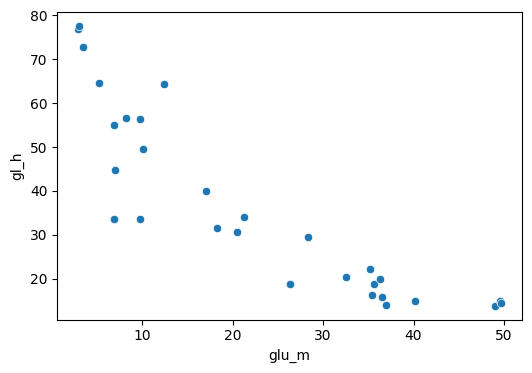

In [1961]:
fig.ax = plt.figure(figsize=(6, 4))
sns.scatterplot(data=P,
                x='glu_m', y='gl_h')

In [2614]:
Pn = P.loc[~((P['glu_m']<10)&(P['gl_h']<20))]
Pn.shape

(50, 9)

In [2615]:
P = P.loc[~((P['glu_m']<25)&(P['gl_h']<20))]
P.shape

(29, 9)

<Axes: xlabel='glu_m', ylabel='gl_h'>

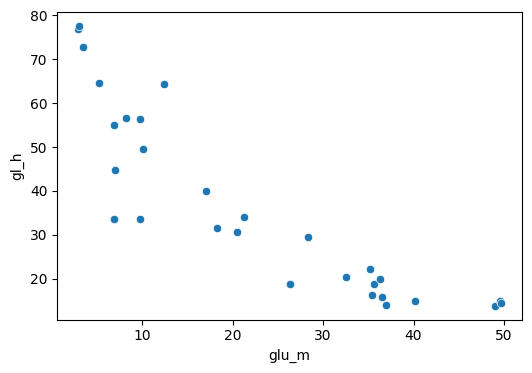

In [1130]:
fig.ax = plt.figure(figsize=(6, 4))
sns.scatterplot(data=P,
                x='glu_m', y='gl_h')

In [2622]:
# стандартизируем значения в обучаюшей выборке
#P_s = scaler.fit_transform(P_features)
# используя обученный scaler, стандартизируем значения  в тестовой выборке
P_scaled = scaler.transform(P_features)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):


In [2639]:
P_scaled_3 = scaler.transform(Pf_3)
P_scaled_5 = scaler.transform(Pf_5)
P_scaled_14 = scaler.transform(Pf_14)
P_scaled_28 = scaler.transform(Pf_28)
P_scaled_56 = scaler.transform(Pf_56)

C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if not hasattr(array, "sparse") and array.dtypes.apply(is_sparse).any():
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:595: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:604: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(pd_dtype) or not is_extension_array_dtype(pd_dtype):
C:\Users\AE28\anaconda3\Lib\site-packages\sklearn\utils\validation.py:757: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if no

In [2623]:
P_poly = poly.transform(P_scaled)
P_poly.shape

(29, 44)

In [ ]:
P_scaled_3 = scaler.transform(Pf_3)
P_scaled_5 = scaler.transform(Pf_5)
P_scaled_14 = scaler.transform(Pf_14)
P_scaled_28 = scaler.transform(Pf_28)
P_scaled_56 = scaler.transform(Pf_56)

In [2640]:
P_poly_3 = poly.transform(P_scaled_3)
P_poly_5 = poly.transform(P_scaled_5)
P_poly_14 = poly.transform(P_scaled_14)
P_poly_28 = poly.transform(P_scaled_28)
P_poly_56 = poly.transform(P_scaled_56)

In [1964]:
#для 10 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_samples = ridge_best.predict(P_poly)

    # вычисляем mae
mae_ridge_samples = mean_absolute_error(P_target, ridge_pred_samples)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE для результатов пациентов:  {mae_ridge_samples:.2f}')

Модель Ridge с полиномиальными признаками
MAE для результатов пациентов:  4.53


In [2648]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_samples = ridge_best.predict(P_poly)

    # вычисляем mae
mae_ridge_samples = mean_absolute_error(P_target, ridge_pred_samples)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE для результатов пациентов:  {mae_ridge_samples:.2f}')

Модель Ridge с полиномиальными признаками
MAE для результатов пациентов:  4.52


Для бинов

In [2641]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_samples = ridge_best.predict(P_poly_3)

    # вычисляем mae
mae_ridge_samples = mean_absolute_error(py_3, ridge_pred_samples)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE для результатов пациентов:  {mae_ridge_samples:.2f}')

Модель Ridge с полиномиальными признаками
MAE для результатов пациентов:  2.48


In [2642]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_samples = ridge_best.predict(P_poly_5)

    # вычисляем mae
mae_ridge_samples = mean_absolute_error(py_5, ridge_pred_samples)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE для результатов пациентов:  {mae_ridge_samples:.2f}')

Модель Ridge с полиномиальными признаками
MAE для результатов пациентов:  3.24


In [2643]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_samples = ridge_best.predict(P_poly_14)

    # вычисляем mae
mae_ridge_samples = mean_absolute_error(py_14, ridge_pred_samples)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE для результатов пациентов:  {mae_ridge_samples:.2f}')

Модель Ridge с полиномиальными признаками
MAE для результатов пациентов:  3.68


Для бинов

In [2644]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_samples = ridge_best.predict(P_poly_28)

    # вычисляем mae
mae_ridge_samples = mean_absolute_error(py_28, ridge_pred_samples)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE для результатов пациентов:  {mae_ridge_samples:.2f}')

Модель Ridge с полиномиальными признаками
MAE для результатов пациентов:  4.67


In [2645]:
#для 8 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_samples = ridge_best.predict(P_poly_56)

    # вычисляем mae
mae_ridge_samples = mean_absolute_error(py_56, ridge_pred_samples)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE для результатов пациентов:  {mae_ridge_samples:.2f}')

Модель Ridge с полиномиальными признаками
MAE для результатов пациентов:  6.13


In [ ]:
plt.figure(figsize=(6, 6))
sns.scatterplot(data=df,
                x='ph_h', y='ph_s', hue='ph')

In [2652]:
preds = P_target.to_frame(name = 'actual')

In [2653]:
preds['predicted'] = ridge_pred_samples

In [ ]:
fig, ax=plt.subplots()
sns.pointplot(data=df, x="bld", y="blood_h", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'c', label = 'H')
sns.pointplot(data=df, x="bld", y="blood_s", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'm', label = 'S')
sns.pointplot(data=df, x="bld", y="blood_v", order=['neg', 'Ca10', 'Ca25', 'Ca80', '>=Ca200'], color = 'y', label = 'V')
ax.set_title('HSV при изменении количества клеток крови')
ax.set_xlabel('диапазон по анализатору тест-полосок, шт')
ax.set_ylabel('HSV')

Text(0, 0.5, 'Предсказанное значение концентрации, ммоль/л')

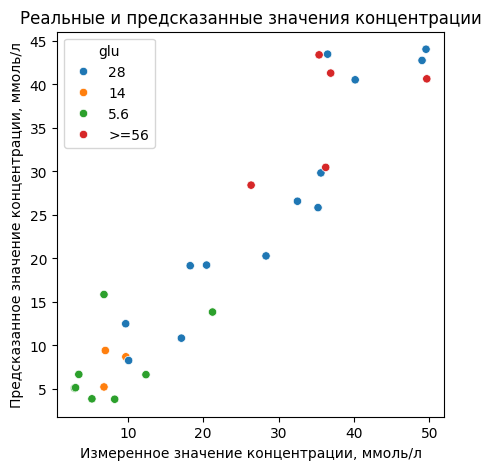

In [2675]:
fig, ax=plt.subplots(figsize=(5, 5))
#plt.figure(figsize=(5, 5))
sns.scatterplot(data=preds,
                x='actual', y='predicted', hue = 'glu')
ax.set_title('Реальные и предсказанные значения концентрации')
ax.set_xlabel('Измеренное значение концентрации, ммоль/л')
ax.set_ylabel('Предсказанное значение концентрации, ммоль/л')

In [2658]:
preds['actual'].corr(preds['predicted'])

0.9422699688298681

In [2671]:
preds['glu'] = Pa['glu']

In [2672]:
preds

,actual,predicted,glu
76,9.71,12.500471,28
94,49.03,42.763625,28
98,7.01,9.423426,14
102,8.25,3.822838,5.6
116,18.27,19.169950,28
124,36.91,41.306919,>=56
144,32.50,26.579205,28
162,49.56,44.050441,28
190,36.50,43.482889,28
194,40.16,40.535107,28


In [2647]:
P_target

76      9.71
94     49.03
98      7.01
102     8.25
116    18.27
124    36.91
144    32.50
162    49.56
190    36.50
194    40.16
195    12.40
207     3.49
220    35.61
229    17.10
242    26.35
256    35.23
262    49.66
284     9.73
311     5.23
314     6.83
315     6.83
323    35.37
338     2.92
341    10.10
343    20.44
354    21.23
360    28.33
382     3.06
415    36.25
Name: glu_m, dtype: float64

In [2649]:
ridge_pred_samples

array([12.50047145, 42.7636251 ,  9.4234261 ,  3.82283835, 19.16994971,
       41.30691857, 26.57920451, 44.05044122, 43.48288879, 40.53510655,
        6.64943488,  6.6752522 , 29.83410291, 10.8433841 , 28.42828784,
       25.84618978, 40.6469847 ,  8.69968262,  3.86850943, 15.85983519,
        5.23312128, 43.40383758,  5.09983319,  8.27467391, 19.24110366,
       13.8431316 , 20.29441455,  5.14791813, 30.47118508])

In [2047]:
#для 12 признаков
# для диапазона до 50 ммоль/л
# модель Ridge
    # рассчитываем предсказания для тестовой выборки
ridge_pred_samples = ridge_best.predict(P_poly)

    # вычисляем mae
mae_ridge_samples = mean_absolute_error(P_target, ridge_pred_samples)

print('Модель Ridge с полиномиальными признаками')
print(f'MAE для результатов пациентов:  {mae_ridge_samples:.2f}')

Модель Ridge с полиномиальными признаками
MAE для результатов пациентов:  4.53


In [2048]:
ridge_pred_samples

array([12.04267837, 43.1261613 ,  9.51281843,  4.45456607, 20.17761889,
       40.61218423, 26.29314427, 44.22039645, 43.98899338, 40.48436756,
        5.27778005,  5.42724822, 29.69975082, 11.18805602, 27.75549012,
       26.28354132, 40.6212227 ,  6.2189325 ,  3.89379341, 16.36145194,
        5.55566398, 44.02522484,  4.19682683,  7.74394327, 19.17402866,
       13.54911524, 20.19092421,  4.39471567, 30.88313796])

In [2043]:
P_target

76      9.71
94     49.03
98      7.01
102     8.25
116    18.27
124    36.91
144    32.50
162    49.56
190    36.50
194    40.16
195    12.40
207     3.49
220    35.61
229    17.10
242    26.35
256    35.23
262    49.66
284     9.73
311     5.23
314     6.83
315     6.83
323    35.37
338     2.92
341    10.10
343    20.44
354    21.23
360    28.33
382     3.06
415    36.25
Name: glu_m, dtype: float64

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

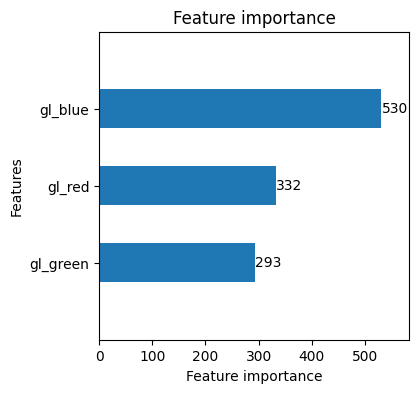

In [1418]:
# для обучения по трем признакам RGB
#построим график для признаков, использованных для обучения модели lgbm_best
plot_importance(lgbm_best, height = 0.5, ignore_zero = False, figsize = (4,4), grid = False)

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

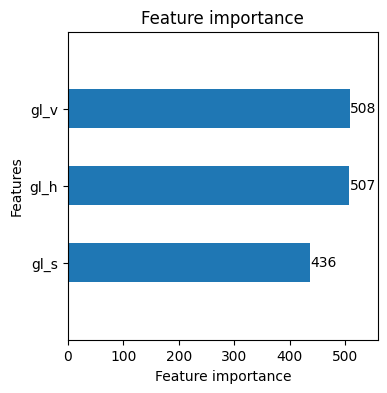

In [1432]:
# для обучения по трем признакам HSV
#построим график для признаков, использованных для обучения модели lgbm_best
plot_importance(lgbm_best, height = 0.5, ignore_zero = False, figsize = (4,4), grid = False)

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

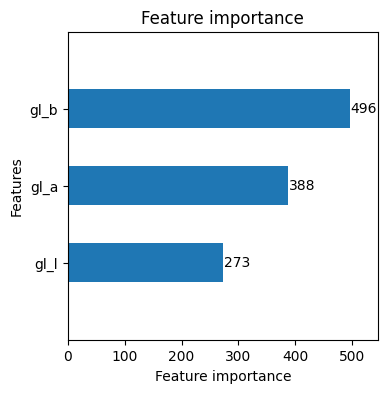

In [1463]:
# для обучения по трем признакам CIE Lab
#построим график для признаков, использованных для обучения модели lgbm_best
plot_importance(lgbm_best, height = 0.5, ignore_zero = False, figsize = (4,4), grid = False)

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

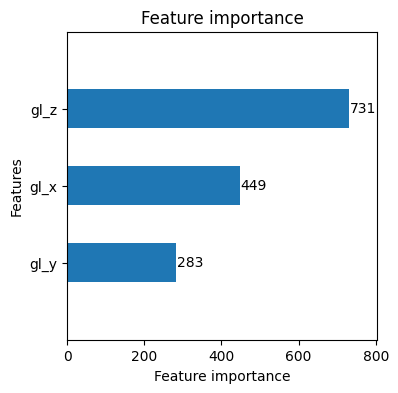

In [1474]:
# для обучения по трем признакам XYZ
#построим график для признаков, использованных для обучения модели lgbm_best
plot_importance(lgbm_best, height = 0.5, ignore_zero = False, figsize = (4,4), grid = False)

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

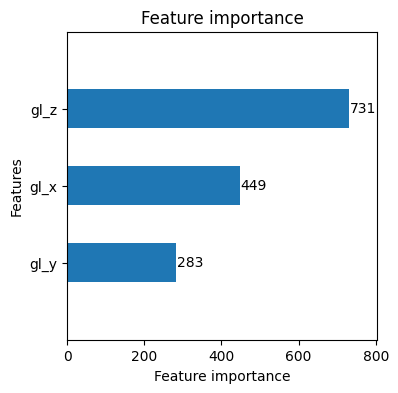

In [2124]:
# для обучения по трем признакам XYZ
#построим график для признаков, использованных для обучения модели lgbm_best
plot_importance(lgbm_best, height = 0.5, ignore_zero = False, figsize = (4,4), grid = False)

## Визуализация зон аналитов

In [565]:
df['glu'].value_counts()

glu
neg     267
>=56     51
28       46
5.6       9
14        7
Name: count, dtype: int64

In [628]:
fls14 = list(df.loc[df['glu'] == '14']['60_sec'])

In [629]:
fls14

[nan,
 nan,
 'IMG_20240311_131647.jpg',
 'IMG_20240312_121503.jpg',
 'IMG_20240327_115827.jpg',
 'IMG_20240329_130717.jpg',
 'IMG_20240404_121110.jpg']

In [585]:
fls5_6 = list(df.loc[df['glu'] == '5.6']['60_sec'])

In [597]:
fls_neg = list(df.loc[df['glu'] == 'neg']['60_sec'])[50:]

In [607]:
fls_28 = list(df.loc[df['glu'] == '28']['60_sec'])[5:]

In [614]:
fls_56 = list(df.loc[df['glu'] == '>=56']['60_sec'])[2:]

In [624]:
df.loc[df['glu'] == '5.6'][['60_sec', 'glu', 'glu_m']][1:]

,60_sec,glu,glu_m
102,IMG_20240313_114203.jpg,5.6,8.25
195,IMG_20240320_122119.jpg,5.6,12.40
207,IMG_20240321_120920.jpg,5.6,3.49
287,IMG_20240327_120209.jpg,5.6,19.30
311,IMG_20240329_130006.jpg,5.6,5.23
314,IMG_20240329_130526.jpg,5.6,6.83
338,IMG_20240401_140025.jpg,5.6,2.92
354,IMG_20240402_124659.jpg,5.6,21.23


In [631]:
df.loc[df['glu'] == '14'][['60_sec', 'glu', 'glu_m']][2:]

,60_sec,glu,glu_m
79,IMG_20240311_131647.jpg,14,NaN
98,IMG_20240312_121503.jpg,14,7.01
284,IMG_20240327_115827.jpg,14,9.73
315,IMG_20240329_130717.jpg,14,6.83
363,IMG_20240404_121110.jpg,14,67.83


In [634]:
df.loc[df['glu'] == '28'][['60_sec', 'glu', 'glu_m']][5:17]

,60_sec,glu,glu_m
60,IMG_20240311_125309.jpg,28,106.38
69,IMG_20240311_130418.jpg,28,0.24
75,IMG_20240311_131147.jpg,28,6.24
76,IMG_20240311_131302.jpg,28,9.71
78,IMG_20240311_131533.jpg,28,NaN
93,IMG_20240312_120848.jpg,28,160.87
94,IMG_20240312_121003.jpg,28,49.03
97,IMG_20240312_121347.jpg,28,213.05
111,IMG_20240313_115318.jpg,28,22.00
116,IMG_20240313_115934.jpg,28,18.27


In [646]:
files = df['60_sec']

In [651]:
files[60]

'IMG_20240311_125309.jpg'

In [1027]:
n=380
plt.imshow(cv2.cvtColor(cv2.imread(path + files[n]), cv2.COLOR_BGR2RGB))
plt.show
df.loc[df['60_sec'] == files[n]][['60_sec', 'glu', 'glu_m', 'day_id']]

TypeError: can only concatenate str (not "float") to str

In [566]:
path = "imgs/analytes/glucose/"

## Визуализация индикаторных зон глюкозы

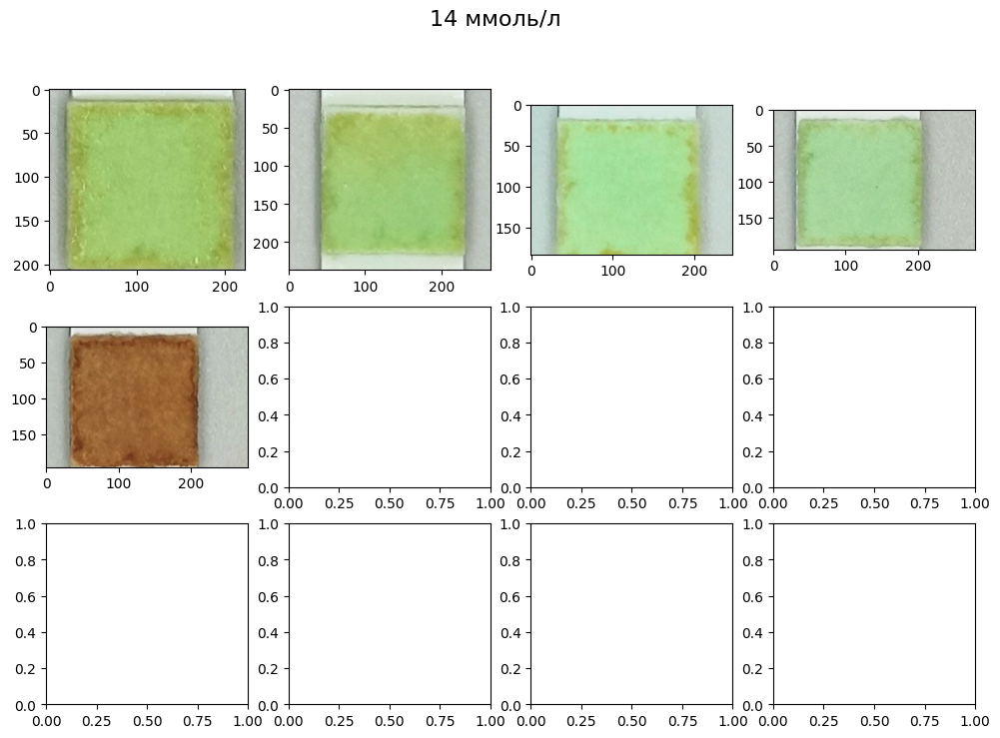

In [584]:
fig, ax = plt.subplots(3,4, figsize=(12,8))
fig.suptitle("14 ммоль/л", fontsize=16)
ax[0,0].imshow(cv2.cvtColor(cv2.imread(path + fls[2]), cv2.COLOR_BGR2RGB))
ax[0,1].imshow(cv2.cvtColor(cv2.imread(path + fls[3]), cv2.COLOR_BGR2RGB))
ax[0,2].imshow(cv2.cvtColor(cv2.imread(path + fls[4]), cv2.COLOR_BGR2RGB))
ax[0,3].imshow(cv2.cvtColor(cv2.imread(path + fls[5]), cv2.COLOR_BGR2RGB))
ax[1,0].imshow(cv2.cvtColor(cv2.imread(path + fls[6]), cv2.COLOR_BGR2RGB))
#ax[1,1].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
#ax[1,2].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
#ax[1,3].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
#ax[2,0].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
#ax[2,1].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
#ax[2,2].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
#ax[2,3].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
plt.show()

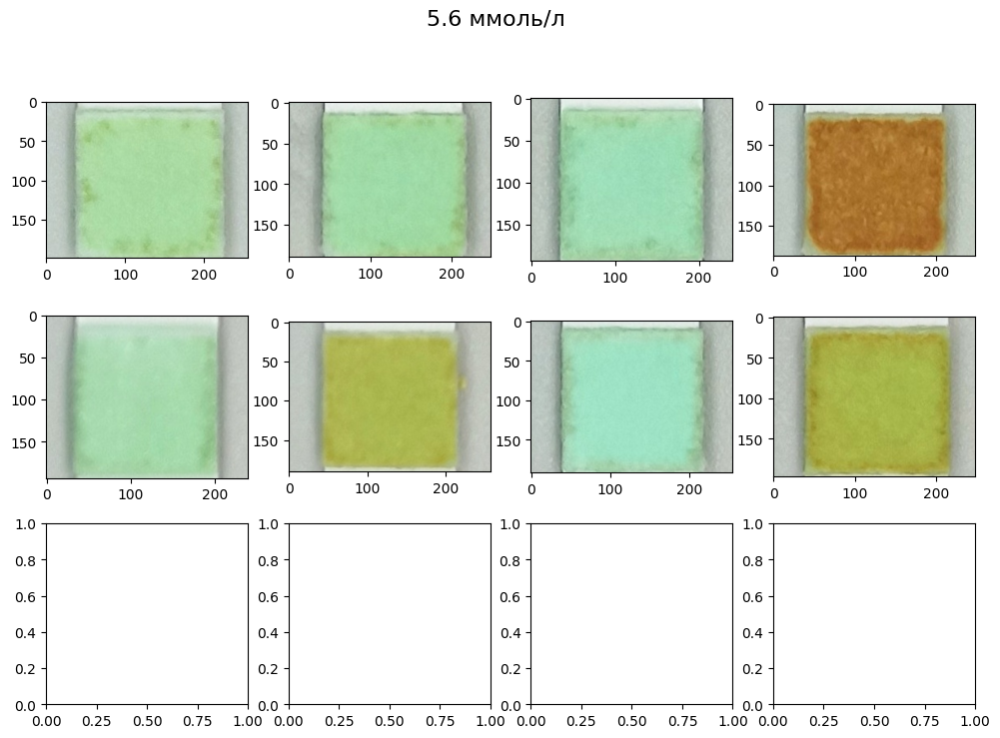

In [587]:
fig, ax = plt.subplots(3,4, figsize=(12,8))
fig.suptitle("5.6 ммоль/л", fontsize=16)
ax[0,0].imshow(cv2.cvtColor(cv2.imread(path + fls5_6[1]), cv2.COLOR_BGR2RGB))
ax[0,1].imshow(cv2.cvtColor(cv2.imread(path + fls5_6[2]), cv2.COLOR_BGR2RGB))
ax[0,2].imshow(cv2.cvtColor(cv2.imread(path + fls5_6[3]), cv2.COLOR_BGR2RGB))
ax[0,3].imshow(cv2.cvtColor(cv2.imread(path + fls5_6[4]), cv2.COLOR_BGR2RGB))
ax[1,0].imshow(cv2.cvtColor(cv2.imread(path + fls5_6[5]), cv2.COLOR_BGR2RGB))
ax[1,1].imshow(cv2.cvtColor(cv2.imread(path + fls5_6[6]), cv2.COLOR_BGR2RGB))
ax[1,2].imshow(cv2.cvtColor(cv2.imread(path + fls5_6[7]), cv2.COLOR_BGR2RGB))
ax[1,3].imshow(cv2.cvtColor(cv2.imread(path + fls5_6[8]), cv2.COLOR_BGR2RGB))
#ax[2,0].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
#ax[2,1].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
#ax[2,2].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
#ax[2,3].imshow(cv2.cvtColor(cv2.imread(path + fls[]), cv2.COLOR_BGR2RGB))
plt.show()

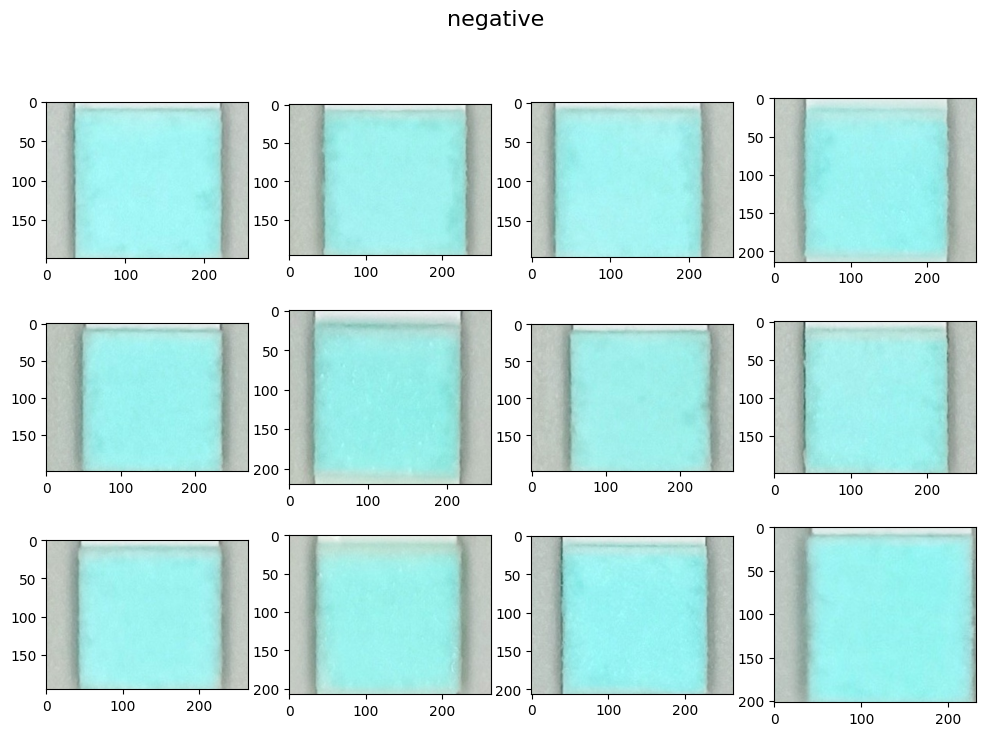

In [599]:
fig, ax = plt.subplots(3,4, figsize=(12,8))
fig.suptitle("negative", fontsize=16)
ax[0,0].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[0]), cv2.COLOR_BGR2RGB))
ax[0,1].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[1]), cv2.COLOR_BGR2RGB))
ax[0,2].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[2]), cv2.COLOR_BGR2RGB))
ax[0,3].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[3]), cv2.COLOR_BGR2RGB))
ax[1,0].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[4]), cv2.COLOR_BGR2RGB))
ax[1,1].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[5]), cv2.COLOR_BGR2RGB))
ax[1,2].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[6]), cv2.COLOR_BGR2RGB))
ax[1,3].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[7]), cv2.COLOR_BGR2RGB))
ax[2,0].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[8]), cv2.COLOR_BGR2RGB))
ax[2,1].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[9]), cv2.COLOR_BGR2RGB))
ax[2,2].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[10]), cv2.COLOR_BGR2RGB))
ax[2,3].imshow(cv2.cvtColor(cv2.imread(path + fls_neg[11]), cv2.COLOR_BGR2RGB))
plt.show()

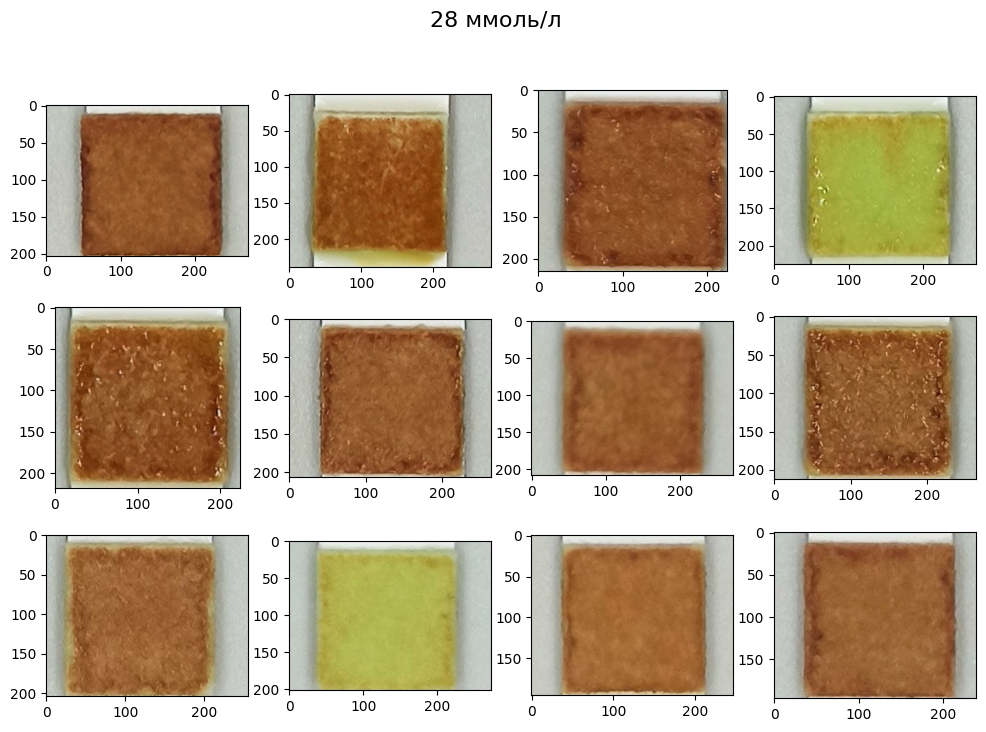

In [635]:
fig, ax = plt.subplots(3,4, figsize=(12,8))
fig.suptitle("28 ммоль/л", fontsize=16)
ax[0,0].imshow(cv2.cvtColor(cv2.imread(path + fls_28[0]), cv2.COLOR_BGR2RGB))
ax[0,1].imshow(cv2.cvtColor(cv2.imread(path + fls_28[1]), cv2.COLOR_BGR2RGB))
ax[0,2].imshow(cv2.cvtColor(cv2.imread(path + fls_28[2]), cv2.COLOR_BGR2RGB))
ax[0,3].imshow(cv2.cvtColor(cv2.imread(path + fls_28[3]), cv2.COLOR_BGR2RGB))
ax[1,0].imshow(cv2.cvtColor(cv2.imread(path + fls_28[4]), cv2.COLOR_BGR2RGB))
ax[1,1].imshow(cv2.cvtColor(cv2.imread(path + fls_28[5]), cv2.COLOR_BGR2RGB))
ax[1,2].imshow(cv2.cvtColor(cv2.imread(path + fls_28[6]), cv2.COLOR_BGR2RGB))
ax[1,3].imshow(cv2.cvtColor(cv2.imread(path + fls_28[7]), cv2.COLOR_BGR2RGB))
ax[2,0].imshow(cv2.cvtColor(cv2.imread(path + fls_28[8]), cv2.COLOR_BGR2RGB))
ax[2,1].imshow(cv2.cvtColor(cv2.imread(path + fls_28[9]), cv2.COLOR_BGR2RGB))
ax[2,2].imshow(cv2.cvtColor(cv2.imread(path + fls_28[10]), cv2.COLOR_BGR2RGB))
ax[2,3].imshow(cv2.cvtColor(cv2.imread(path + fls_28[11]), cv2.COLOR_BGR2RGB))
plt.show()

In [642]:
df.loc[df['glu'] == '28'][['60_sec', 'glu', 'glu_m']][5:17]

,60_sec,glu,glu_m
60,IMG_20240311_125309.jpg,28,106.38
69,IMG_20240311_130418.jpg,28,0.24
75,IMG_20240311_131147.jpg,28,6.24
76,IMG_20240311_131302.jpg,28,9.71
78,IMG_20240311_131533.jpg,28,NaN
93,IMG_20240312_120848.jpg,28,160.87
94,IMG_20240312_121003.jpg,28,49.03
97,IMG_20240312_121347.jpg,28,213.05
111,IMG_20240313_115318.jpg,28,22.00
116,IMG_20240313_115934.jpg,28,18.27


In [637]:
fls_28[1]

'IMG_20240311_130418.jpg'

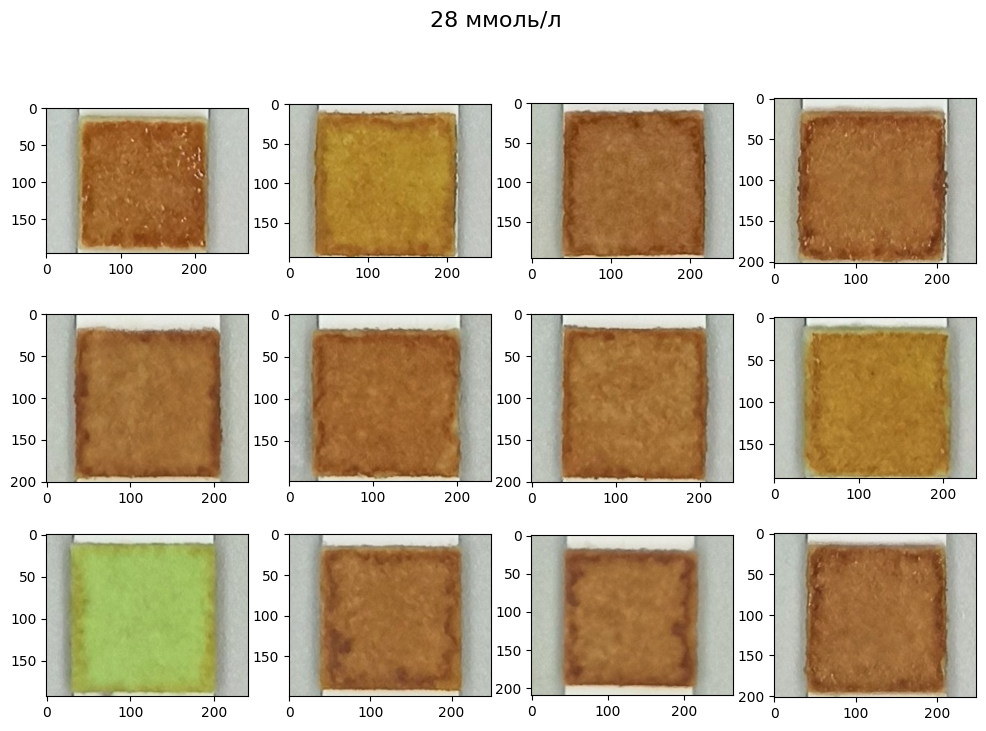

In [618]:
fig, ax = plt.subplots(3,4, figsize=(12,8))
fig.suptitle("28 ммоль/л", fontsize=16)
ax[0,0].imshow(cv2.cvtColor(cv2.imread(path + fls_28[12]), cv2.COLOR_BGR2RGB))
ax[0,1].imshow(cv2.cvtColor(cv2.imread(path + fls_28[13]), cv2.COLOR_BGR2RGB))
ax[0,2].imshow(cv2.cvtColor(cv2.imread(path + fls_28[14]), cv2.COLOR_BGR2RGB))
ax[0,3].imshow(cv2.cvtColor(cv2.imread(path + fls_28[15]), cv2.COLOR_BGR2RGB))
ax[1,0].imshow(cv2.cvtColor(cv2.imread(path + fls_28[16]), cv2.COLOR_BGR2RGB))
ax[1,1].imshow(cv2.cvtColor(cv2.imread(path + fls_28[17]), cv2.COLOR_BGR2RGB))
ax[1,2].imshow(cv2.cvtColor(cv2.imread(path + fls_28[18]), cv2.COLOR_BGR2RGB))
ax[1,3].imshow(cv2.cvtColor(cv2.imread(path + fls_28[19]), cv2.COLOR_BGR2RGB))
ax[2,0].imshow(cv2.cvtColor(cv2.imread(path + fls_28[20]), cv2.COLOR_BGR2RGB))
ax[2,1].imshow(cv2.cvtColor(cv2.imread(path + fls_28[21]), cv2.COLOR_BGR2RGB))
ax[2,2].imshow(cv2.cvtColor(cv2.imread(path + fls_28[22]), cv2.COLOR_BGR2RGB))
ax[2,3].imshow(cv2.cvtColor(cv2.imread(path + fls_28[23]), cv2.COLOR_BGR2RGB))
plt.show()

In [639]:
df.loc[df['glu'] == '28'][['60_sec', 'glu', 'glu_m']][17:29]

,60_sec,glu,glu_m
136,IMG_20240315_102436.jpg,28,53.63
144,IMG_20240318_120737.jpg,28,32.50
152,IMG_20240318_121935.jpg,28,83.24
162,IMG_20240319_121005.jpg,28,49.56
190,IMG_20240320_121504.jpg,28,36.50
194,IMG_20240320_122004.jpg,28,40.16
210,IMG_20240321_121306.jpg,28,82.42
220,IMG_20240322_122635.jpg,28,35.61
229,IMG_20240322_123753.jpg,28,17.10
250,IMG_20240325_121456.jpg,28,21.50


In [641]:
df.loc[df['glu'] == '28'][['60_sec', 'glu', 'glu_m']][29:41]

,60_sec,glu,glu_m
256,IMG_20240325_122226.jpg,28,35.23
261,IMG_20240326_114641.jpg,28,16.57
263,IMG_20240326_114911.jpg,28,19.66
280,IMG_20240327_115329.jpg,28,87.35
281,IMG_20240327_115441.jpg,28,18.25
282,IMG_20240327_115556.jpg,28,63.75
316,IMG_20240329_130901.jpg,28,88.17
322,IMG_20240401_133433.jpg,28,81.61
341,IMG_20240402_123040.jpg,28,10.10
343,IMG_20240402_123311.jpg,28,20.44


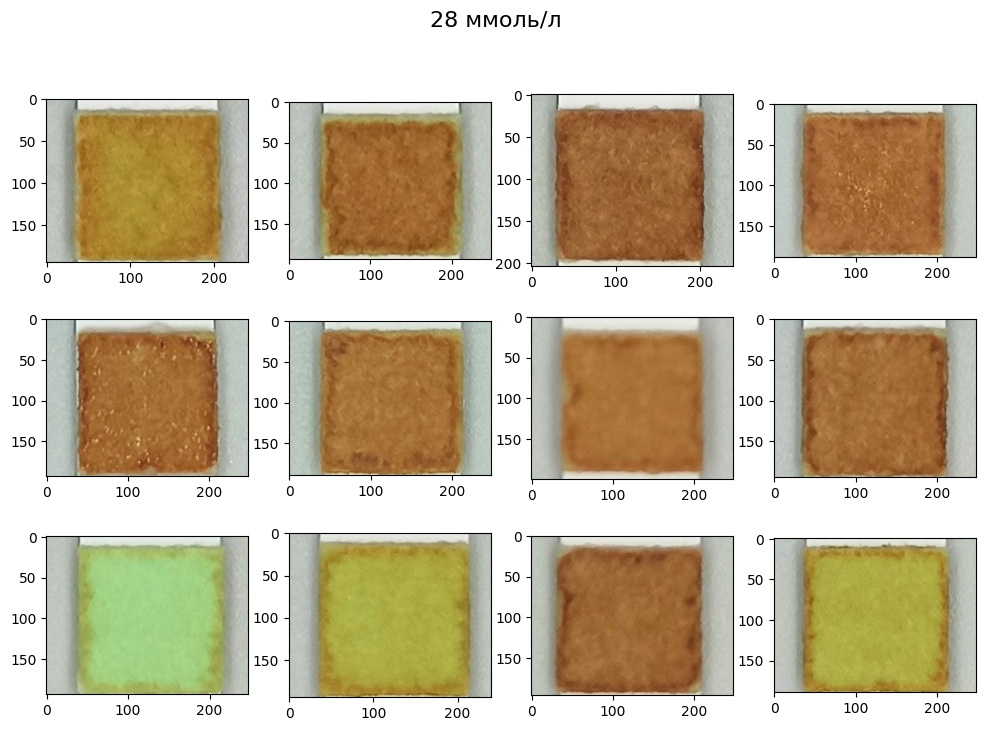

In [619]:
fig, ax = plt.subplots(3,4, figsize=(12,8))
fig.suptitle("28 ммоль/л", fontsize=16)
ax[0,0].imshow(cv2.cvtColor(cv2.imread(path + fls_28[24]), cv2.COLOR_BGR2RGB))
ax[0,1].imshow(cv2.cvtColor(cv2.imread(path + fls_28[25]), cv2.COLOR_BGR2RGB))
ax[0,2].imshow(cv2.cvtColor(cv2.imread(path + fls_28[26]), cv2.COLOR_BGR2RGB))
ax[0,3].imshow(cv2.cvtColor(cv2.imread(path + fls_28[27]), cv2.COLOR_BGR2RGB))
ax[1,0].imshow(cv2.cvtColor(cv2.imread(path + fls_28[28]), cv2.COLOR_BGR2RGB))
ax[1,1].imshow(cv2.cvtColor(cv2.imread(path + fls_28[29]), cv2.COLOR_BGR2RGB))
ax[1,2].imshow(cv2.cvtColor(cv2.imread(path + fls_28[30]), cv2.COLOR_BGR2RGB))
ax[1,3].imshow(cv2.cvtColor(cv2.imread(path + fls_28[31]), cv2.COLOR_BGR2RGB))
ax[2,0].imshow(cv2.cvtColor(cv2.imread(path + fls_28[32]), cv2.COLOR_BGR2RGB))
ax[2,1].imshow(cv2.cvtColor(cv2.imread(path + fls_28[33]), cv2.COLOR_BGR2RGB))
ax[2,2].imshow(cv2.cvtColor(cv2.imread(path + fls_28[34]), cv2.COLOR_BGR2RGB))
ax[2,3].imshow(cv2.cvtColor(cv2.imread(path + fls_28[35]), cv2.COLOR_BGR2RGB))
plt.show()

In [645]:
fls_28[24]

'IMG_20240325_122226.jpg'

In [643]:
df.loc[df['glu'] == '28'][['60_sec', 'glu', 'glu_m']][29:41]

,60_sec,glu,glu_m
256,IMG_20240325_122226.jpg,28,35.23
261,IMG_20240326_114641.jpg,28,16.57
263,IMG_20240326_114911.jpg,28,19.66
280,IMG_20240327_115329.jpg,28,87.35
281,IMG_20240327_115441.jpg,28,18.25
282,IMG_20240327_115556.jpg,28,63.75
316,IMG_20240329_130901.jpg,28,88.17
322,IMG_20240401_133433.jpg,28,81.61
341,IMG_20240402_123040.jpg,28,10.10
343,IMG_20240402_123311.jpg,28,20.44


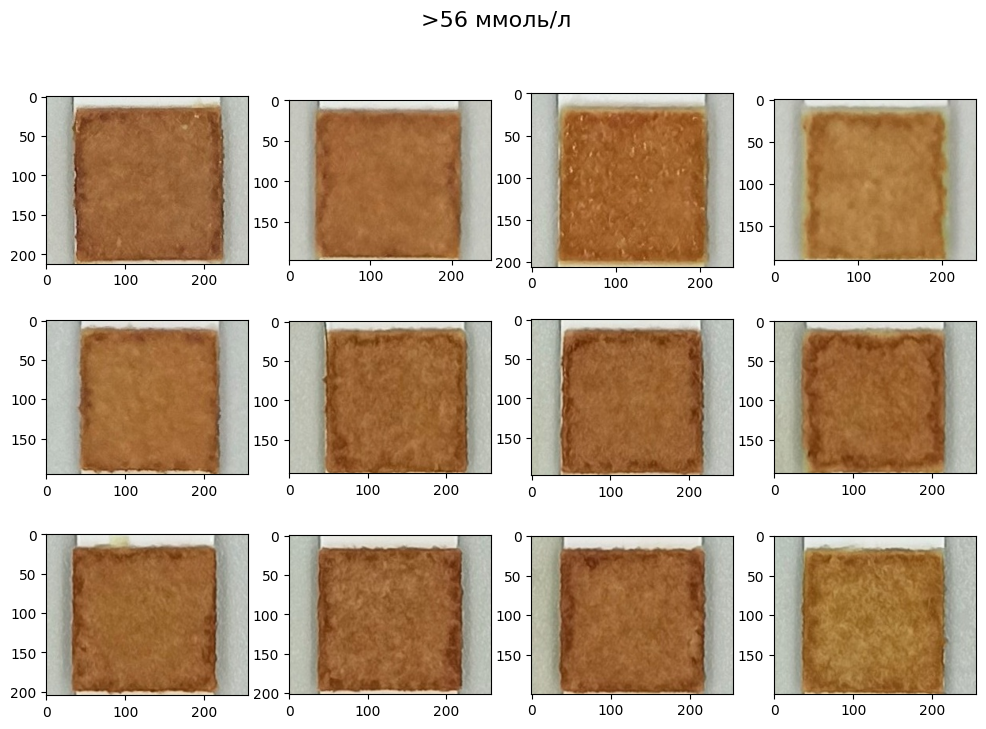

In [621]:
fig, ax = plt.subplots(3,4, figsize=(12,8))
fig.suptitle(">56 ммоль/л", fontsize=16)
ax[0,0].imshow(cv2.cvtColor(cv2.imread(path + fls_56[0]), cv2.COLOR_BGR2RGB))
ax[0,1].imshow(cv2.cvtColor(cv2.imread(path + fls_56[1]), cv2.COLOR_BGR2RGB))
ax[0,2].imshow(cv2.cvtColor(cv2.imread(path + fls_56[2]), cv2.COLOR_BGR2RGB))
ax[0,3].imshow(cv2.cvtColor(cv2.imread(path + fls_56[3]), cv2.COLOR_BGR2RGB))
ax[1,0].imshow(cv2.cvtColor(cv2.imread(path + fls_56[4]), cv2.COLOR_BGR2RGB))
ax[1,1].imshow(cv2.cvtColor(cv2.imread(path + fls_56[5]), cv2.COLOR_BGR2RGB))
ax[1,2].imshow(cv2.cvtColor(cv2.imread(path + fls_56[6]), cv2.COLOR_BGR2RGB))
ax[1,3].imshow(cv2.cvtColor(cv2.imread(path + fls_56[7]), cv2.COLOR_BGR2RGB))
ax[2,0].imshow(cv2.cvtColor(cv2.imread(path + fls_56[8]), cv2.COLOR_BGR2RGB))
ax[2,1].imshow(cv2.cvtColor(cv2.imread(path + fls_56[9]), cv2.COLOR_BGR2RGB))
ax[2,2].imshow(cv2.cvtColor(cv2.imread(path + fls_56[10]), cv2.COLOR_BGR2RGB))
ax[2,3].imshow(cv2.cvtColor(cv2.imread(path + fls_56[11]), cv2.COLOR_BGR2RGB))
plt.show()